<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/Atlas_of_Mathematical_Spaces_Visualized_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [ ]:
!uv pip install numpy scipy matplotlib graphviz qutip

[01/44] catalog_matrix: A coverage matrix linking broad space classes to recurring linear companions.


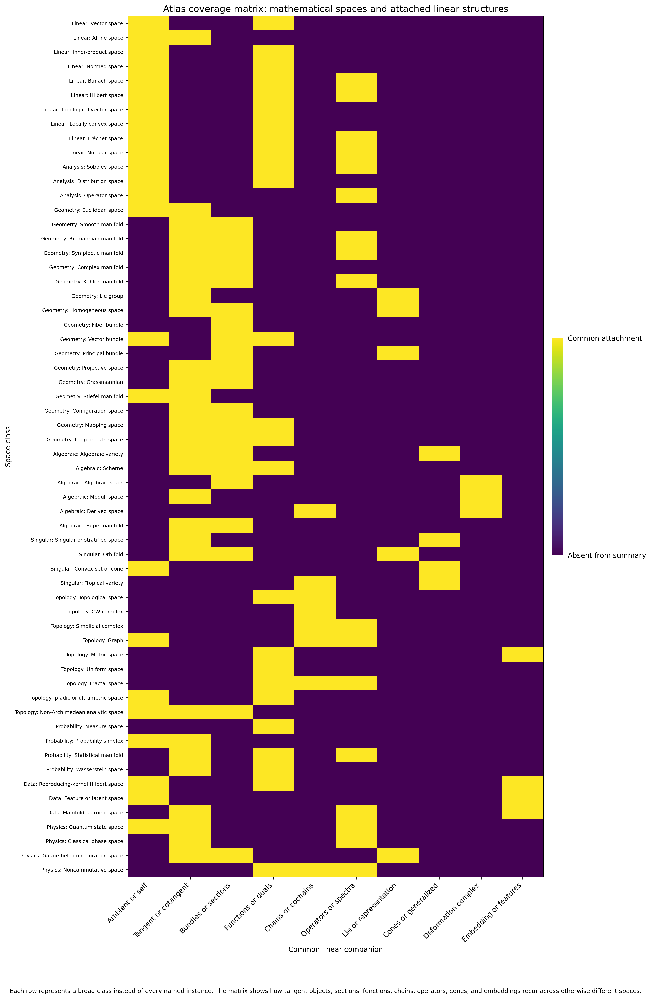

[02/44] space_taxonomy: A radial taxonomy of the principal families represented in the atlas.


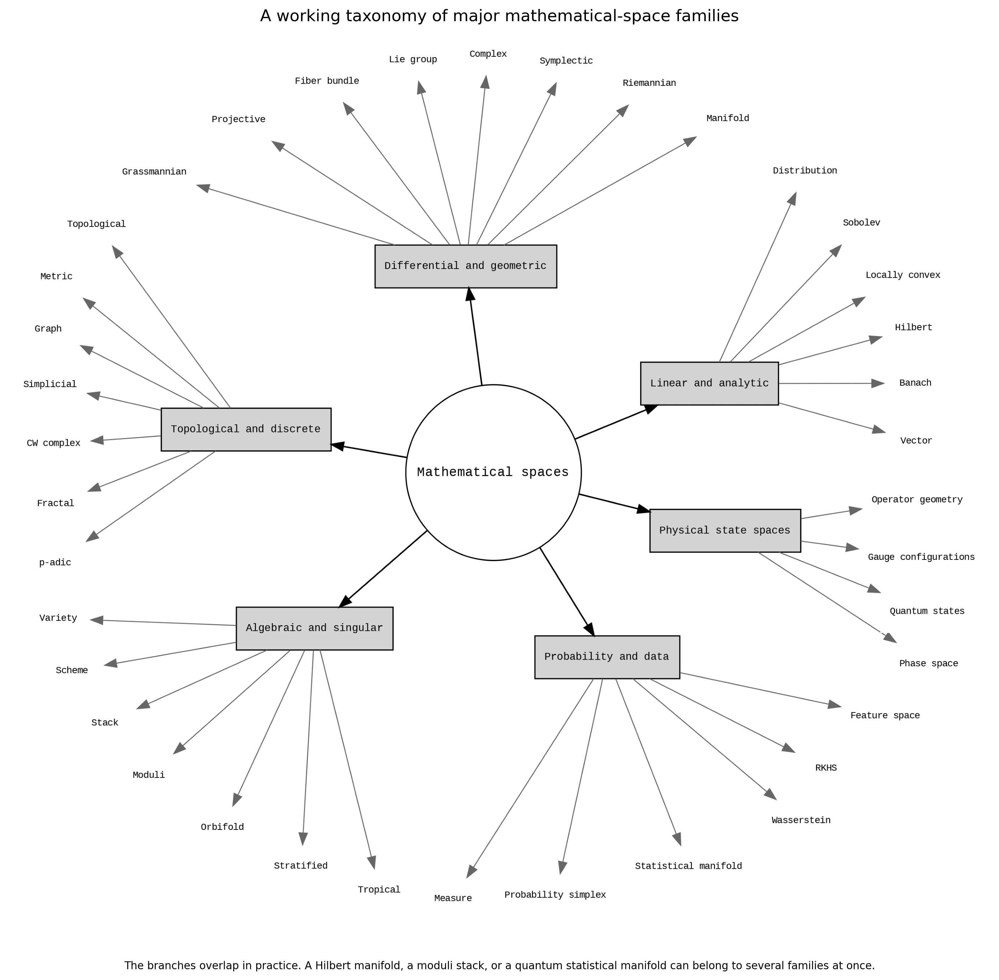

[03/44] linearization_dictionary: A map from nonlinear or discrete spaces to standard local and global linearizations.


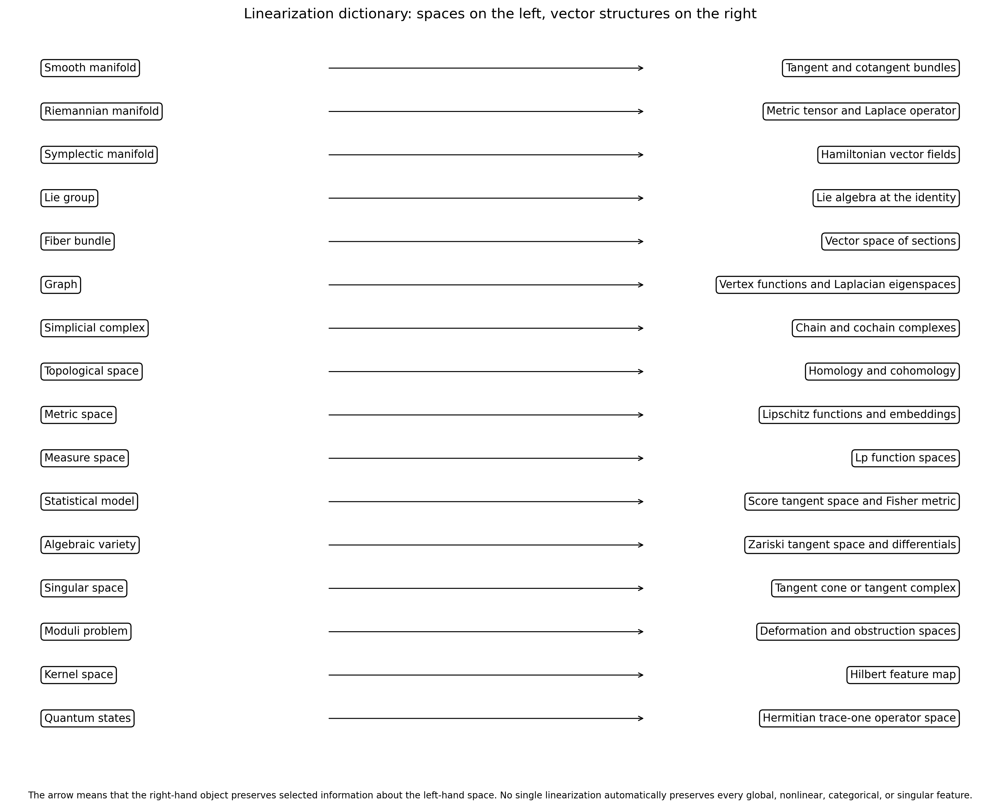

[04/44] vector_affine: Vector spaces have a preferred origin; affine spaces retain displacement vectors without one.


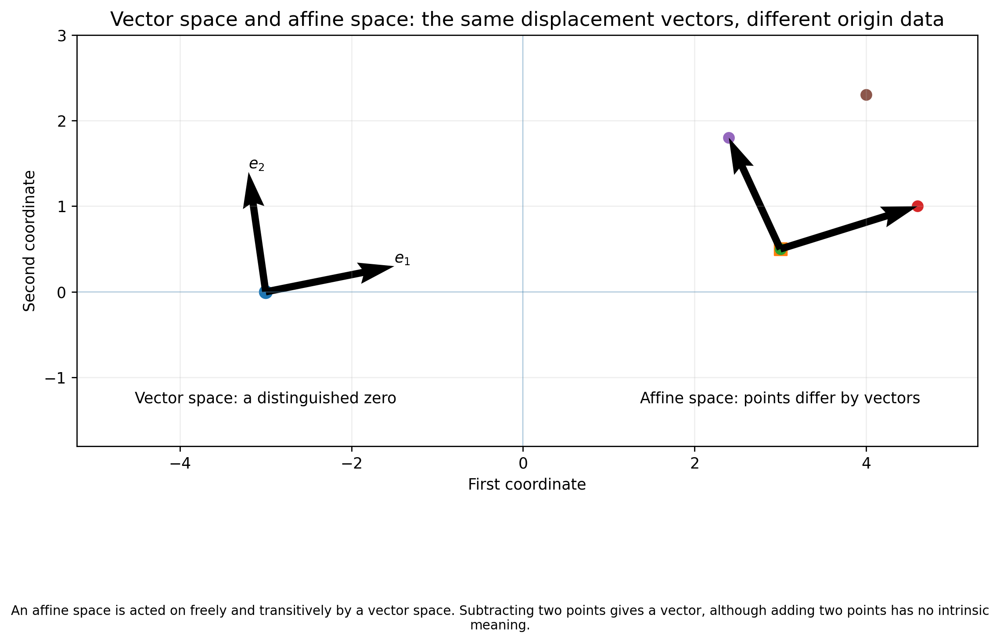

[05/44] normed_unit_balls: Different norms impose different geometries on the same underlying vector space.


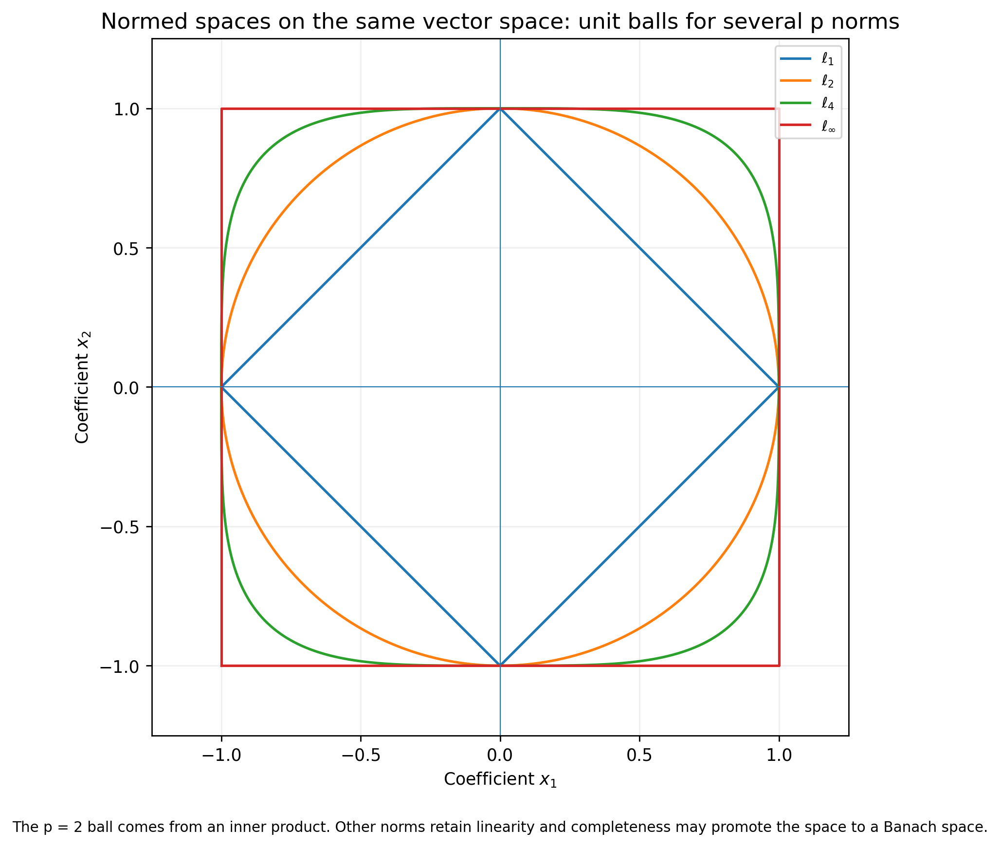

[06/44] locally_convex_seminorms: A family of seminorms supplies the local convex geometry of many infinite-dimensional spaces.


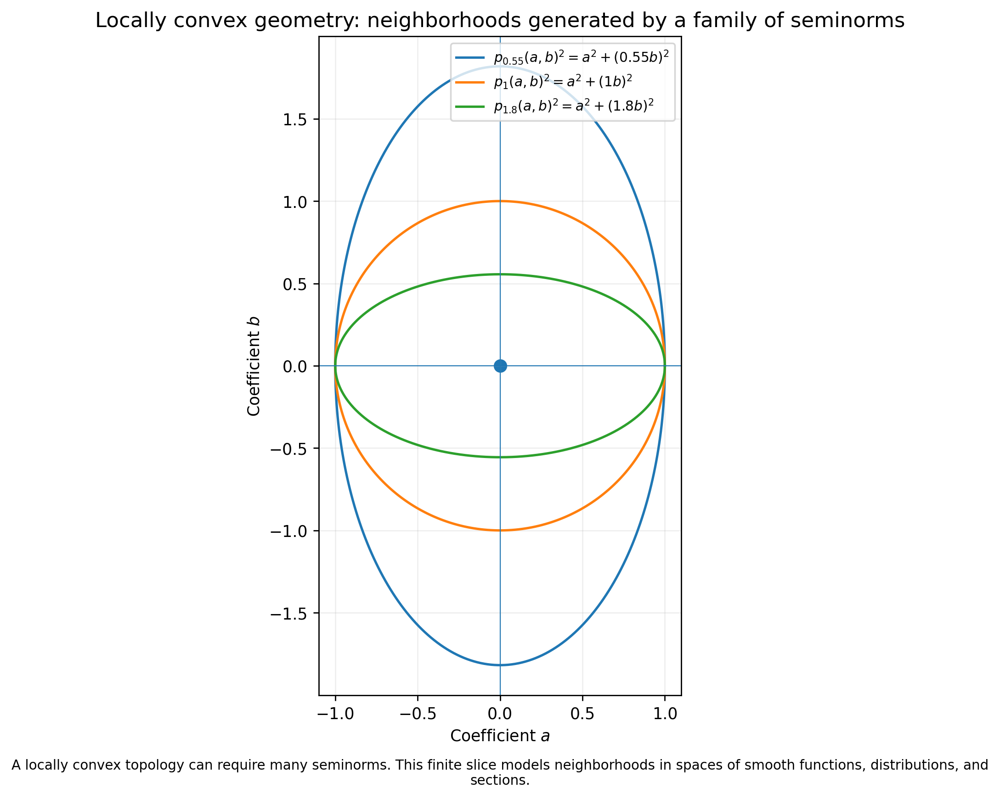

[07/44] hilbert_fourier: Fourier partial sums express a function as coordinates in an orthogonal Hilbert basis.


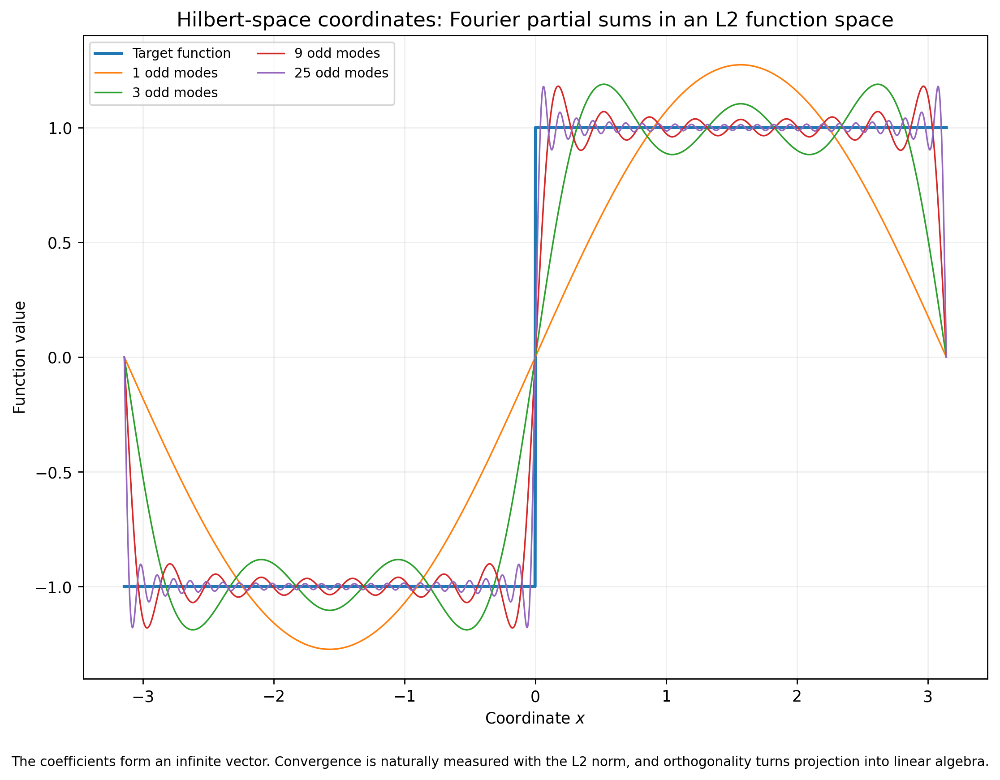

[08/44] sobolev_smoothing: A Sobolev norm controls both function amplitude and weak derivatives.


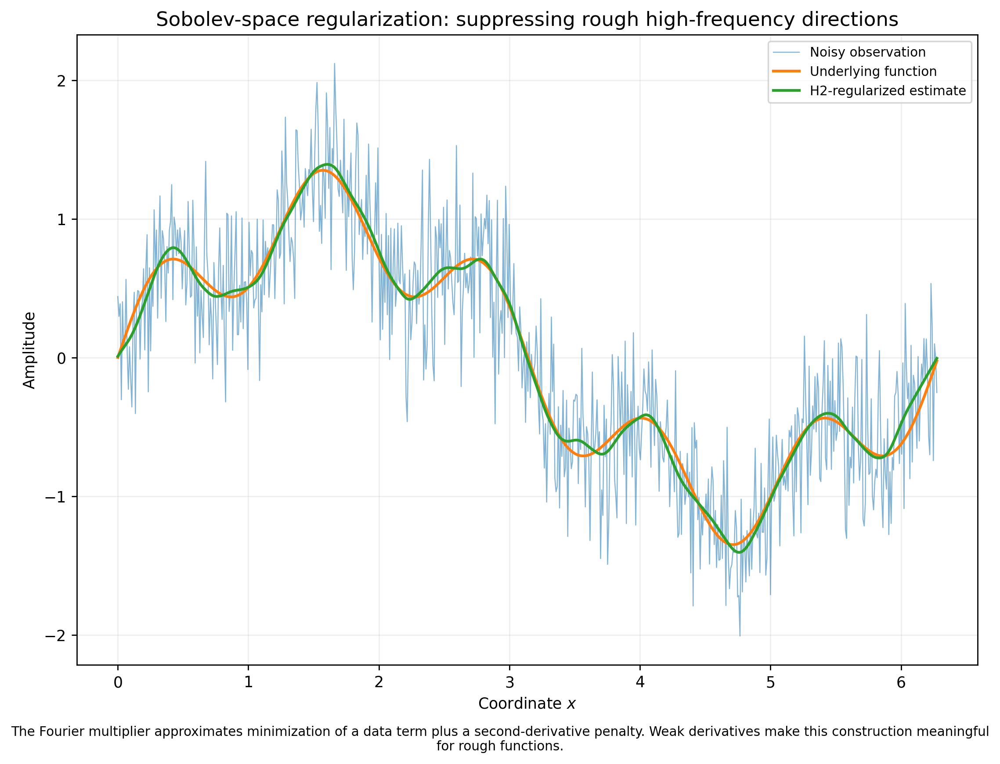

[09/44] distribution_delta_sequence: Distributions are continuous linear functionals on a test-function space.


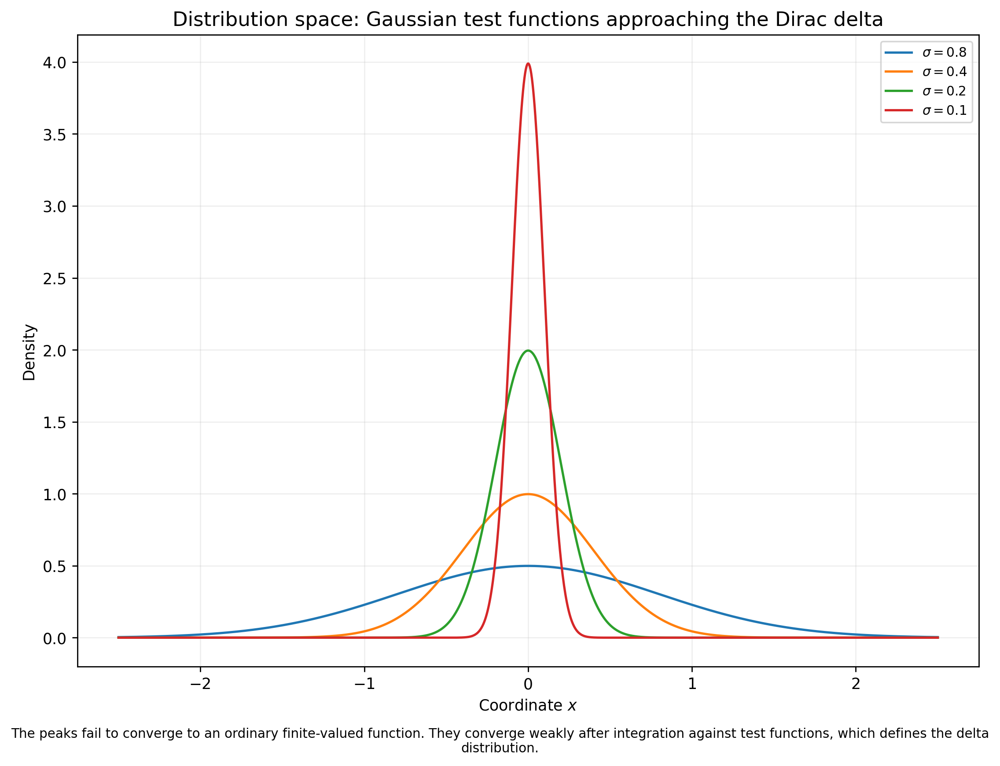

[10/44] quantum_operator_space: A qubit state is an affine point in the vector space of Hermitian operators.


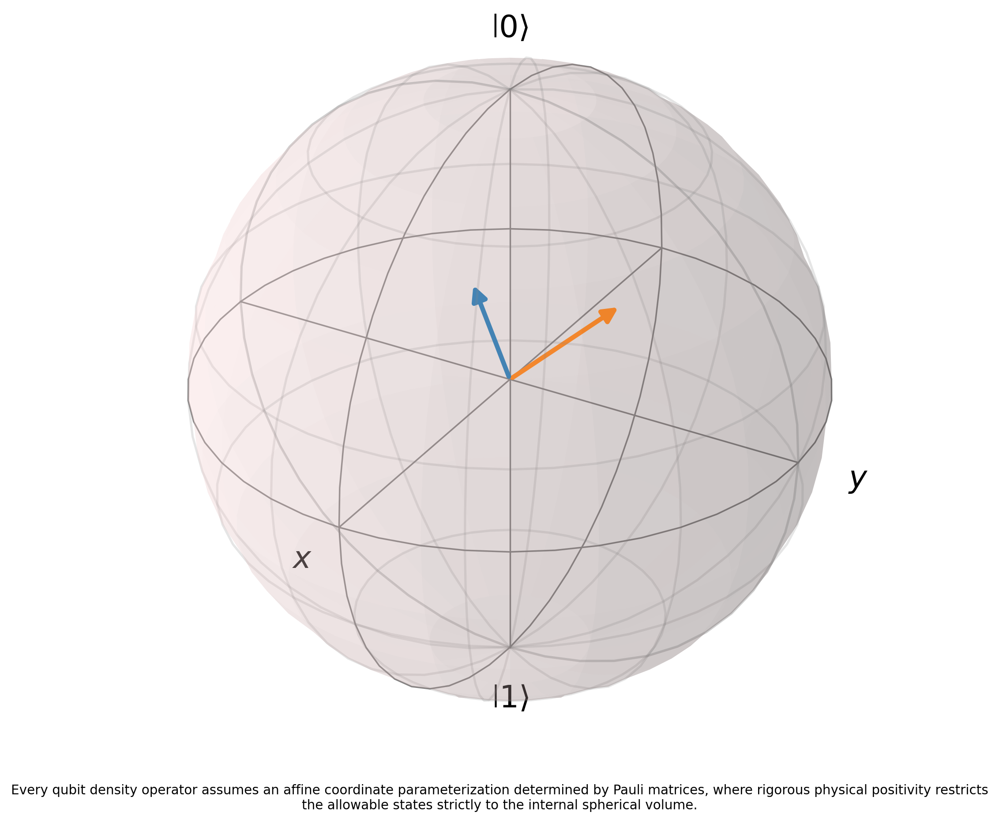

[11/44] manifold_tangent: A curved manifold is locally linearized by a tangent plane at each point.


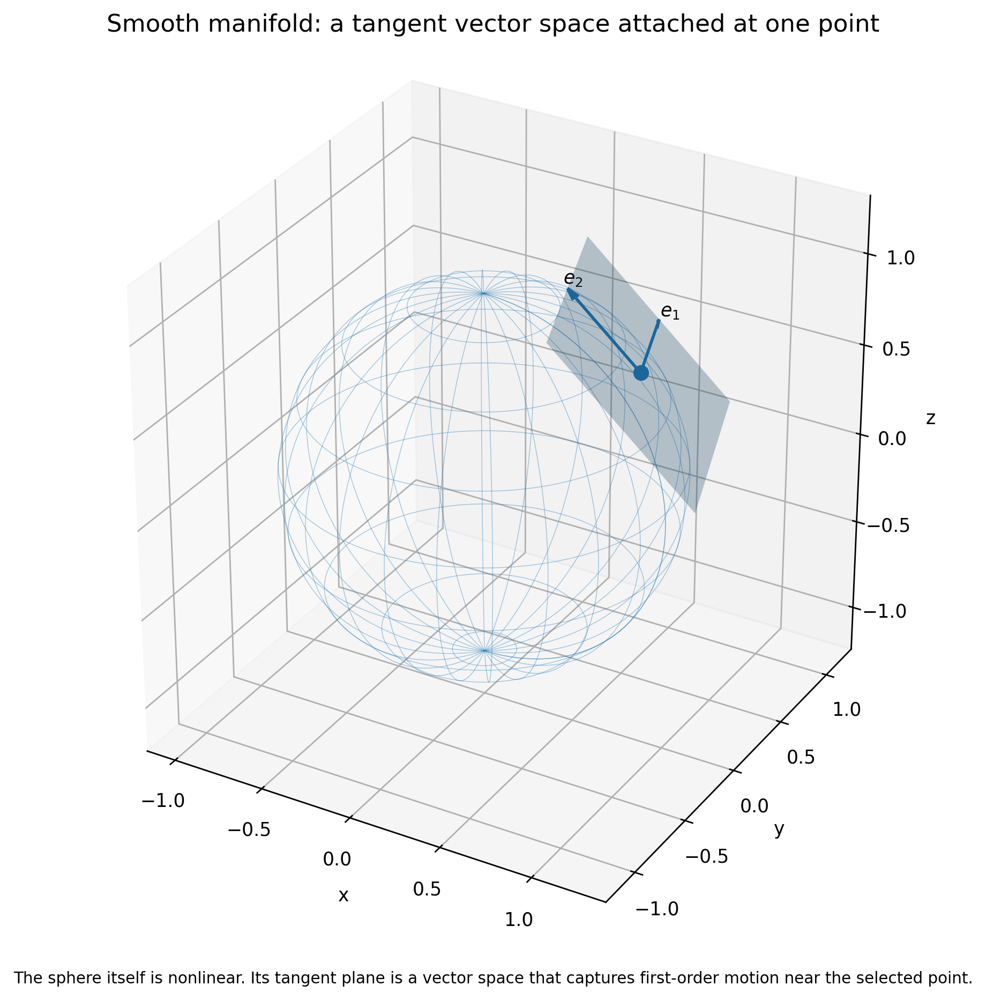

[12/44] sphere_vector_field: A vector field is a section selecting one tangent vector at every point.


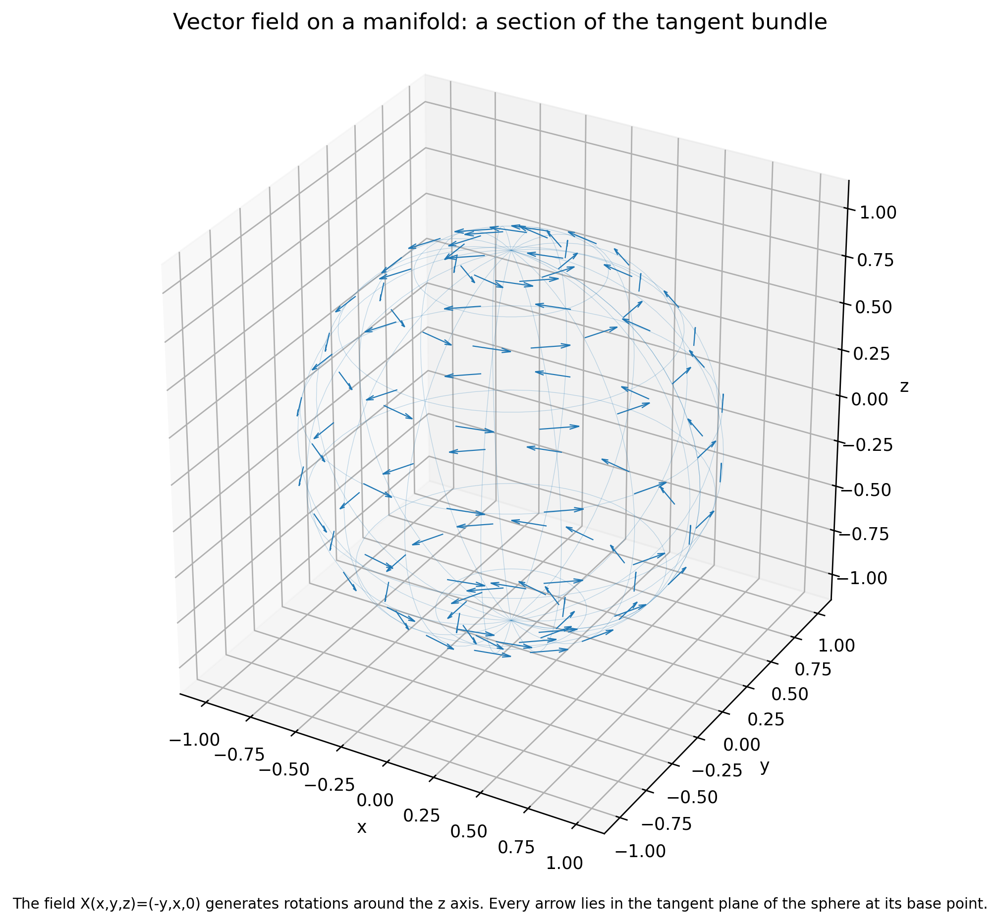

[13/44] cotangent_gradient: A differential is a cotangent covector; a metric converts it into a gradient vector.


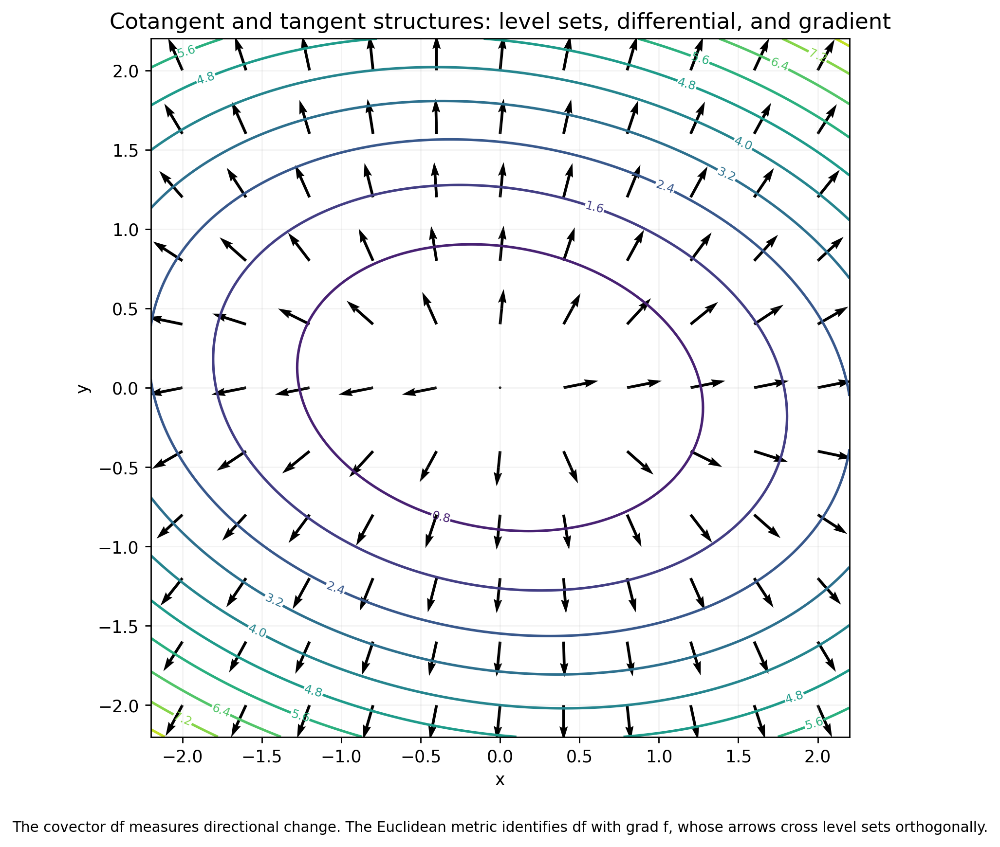

[14/44] hyperbolic_tangent: The Poincare disk is locally Euclidean as a tangent space and globally hyperbolic.


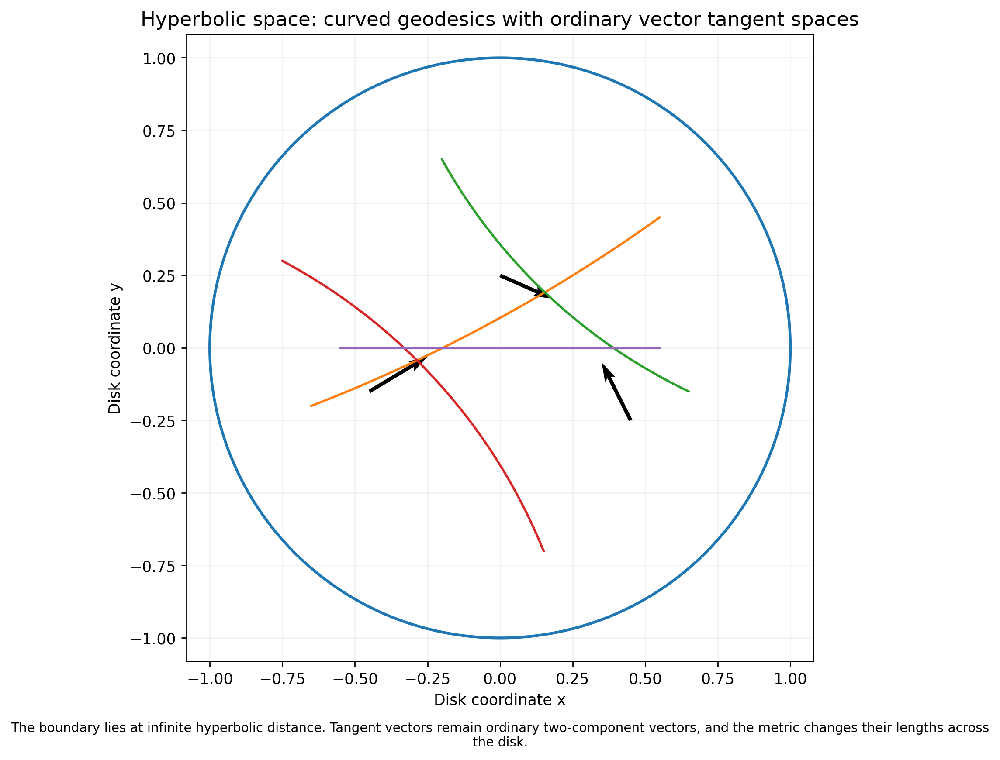

[15/44] symplectic_phase_space: A symplectic form converts energy differentials into Hamiltonian vector fields.


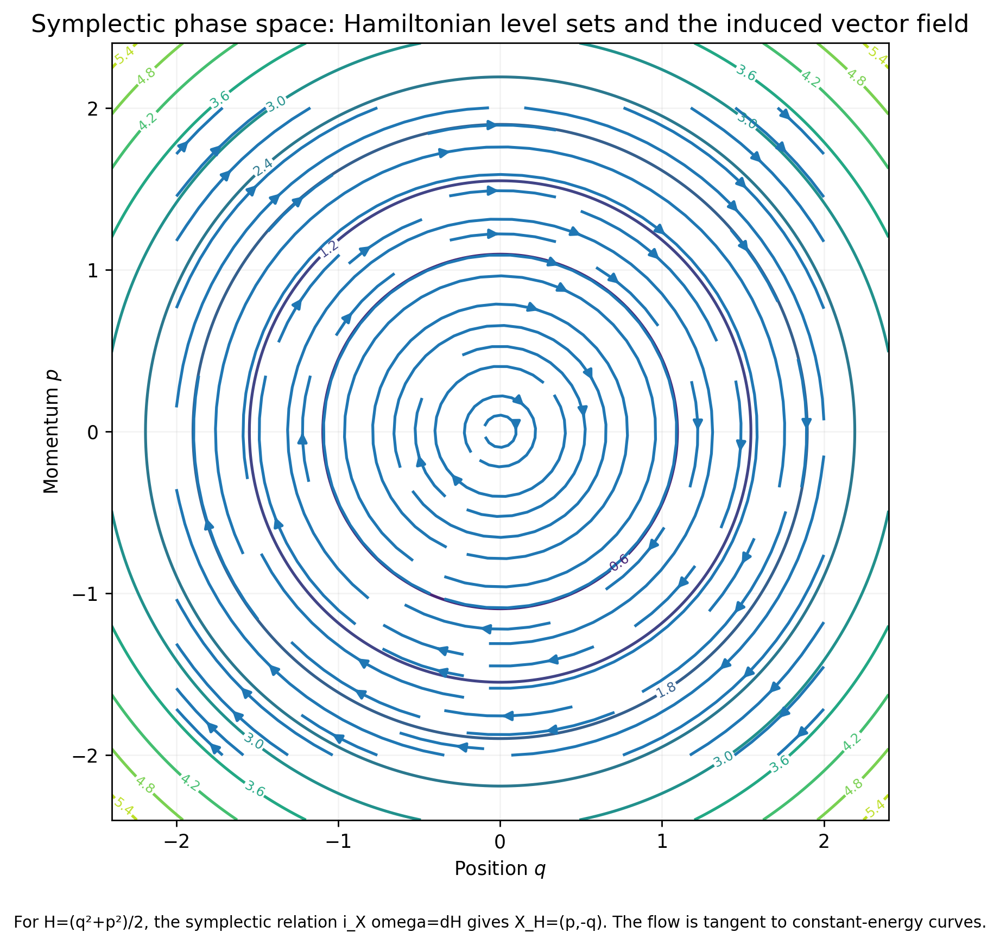

[16/44] complex_projective_line: The complex projective line is a sphere whose tangent plane carries a complex structure.


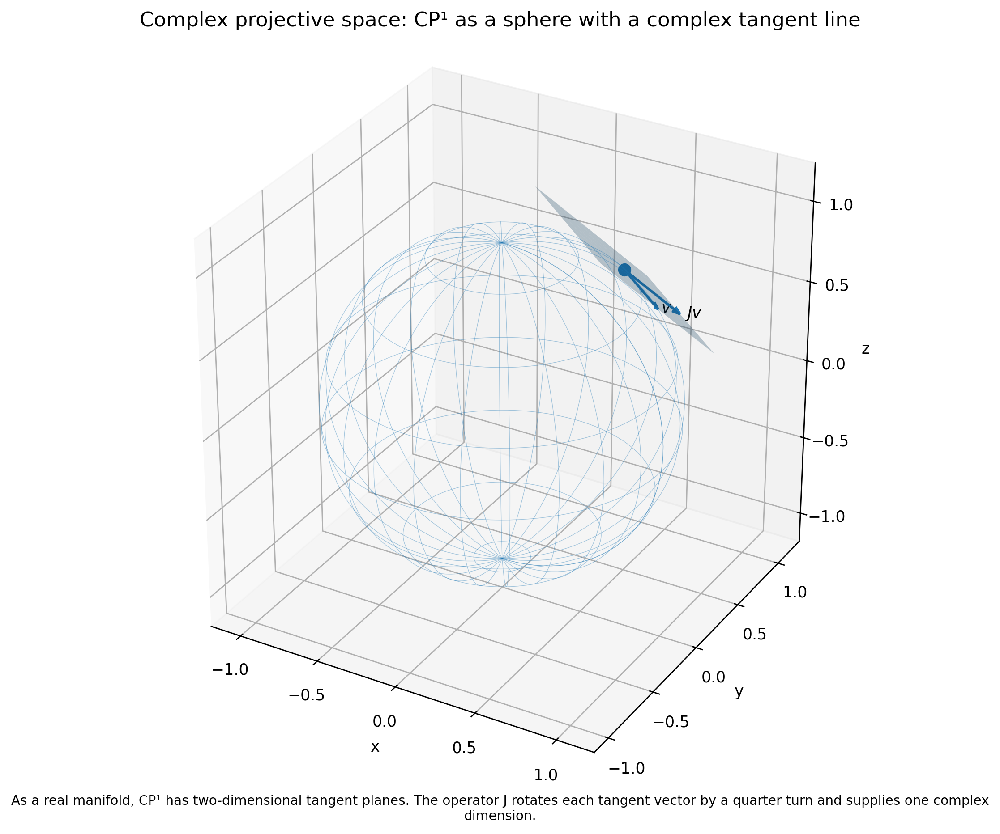

[17/44] lie_group_exponential: The tangent space at a Lie-group identity is a Lie algebra that generates the group locally.


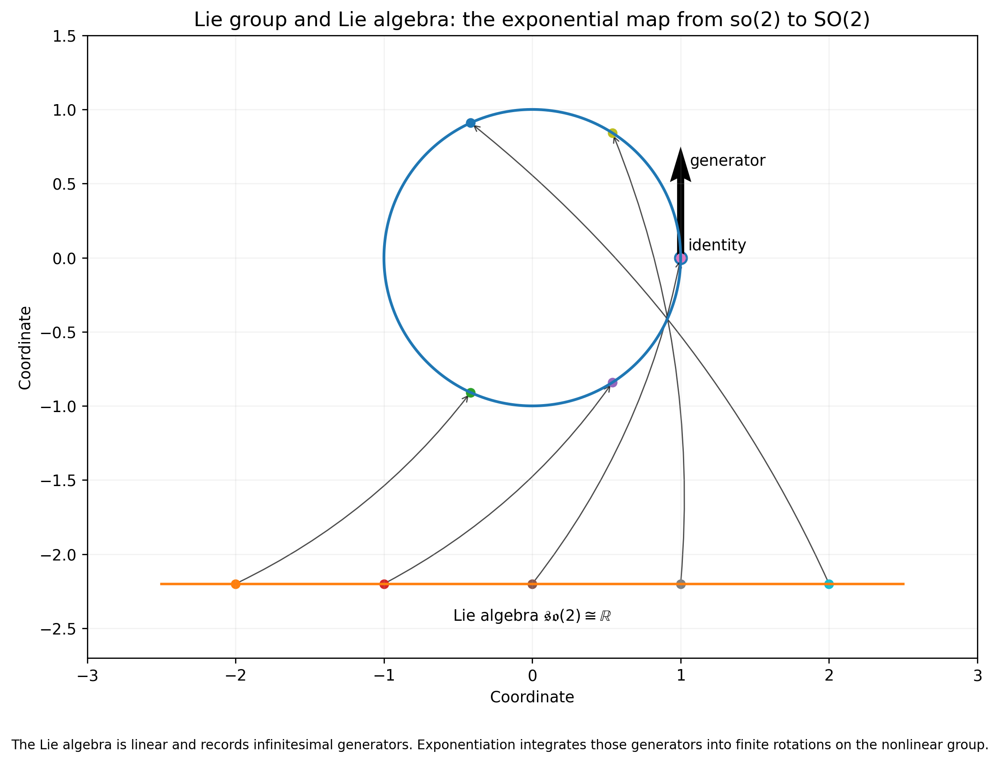

[18/44] mobius_bundle: A fiber bundle attaches a vector space to every base point and may twist globally.


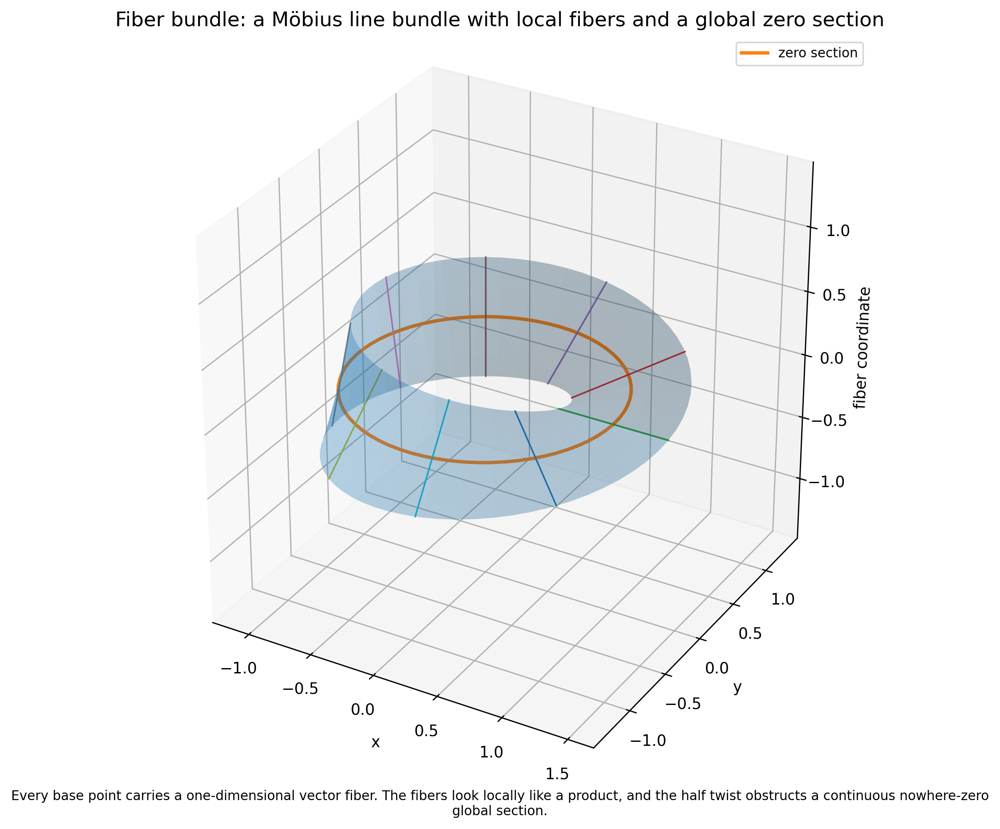

[19/44] grassmannian_planes: A Grassmannian parameterizes linear subspaces and has tangent spaces built from linear maps.


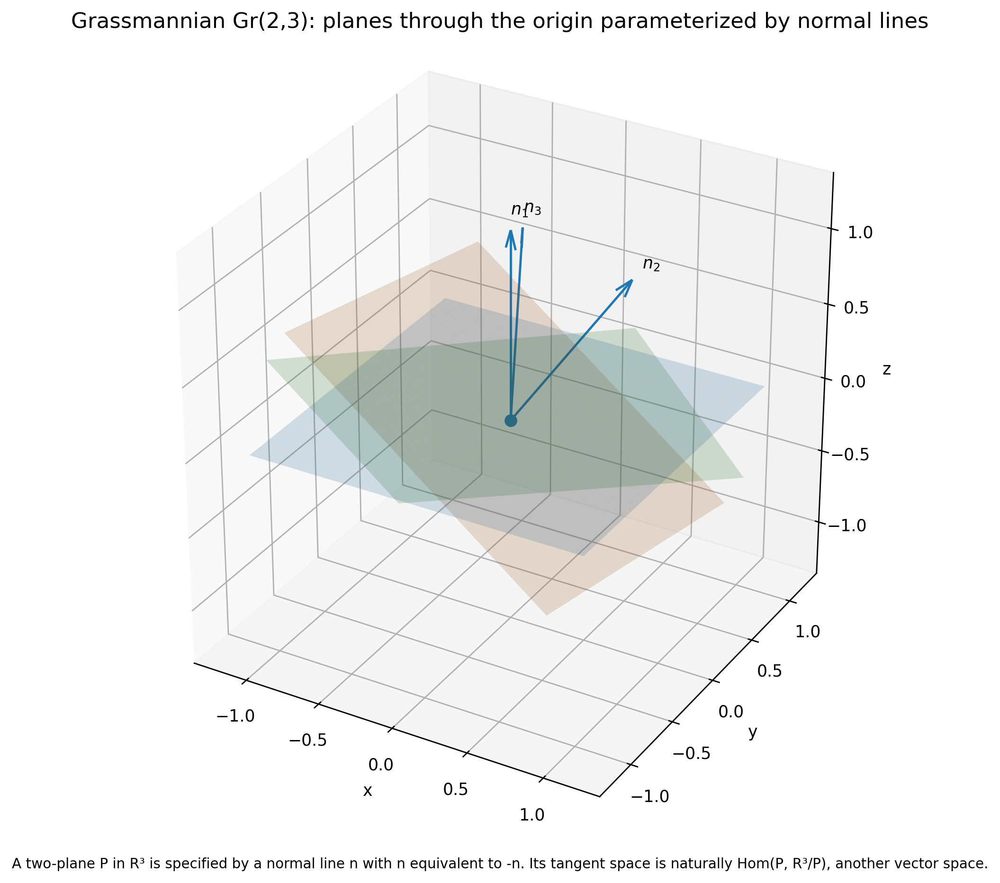

[20/44] configuration_space: A configuration space removes forbidden coincidences and retains tangent directions for allowed motions.


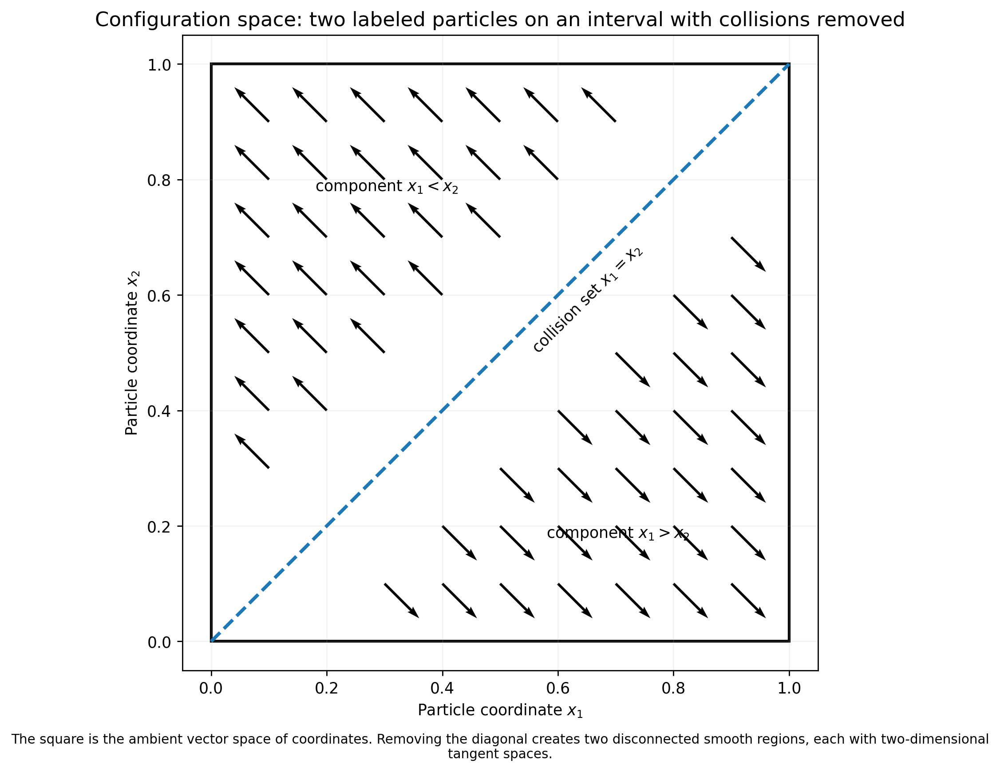

[21/44] mapping_space_tangent: The tangent to a mapping space consists of vector fields along the mapped object.


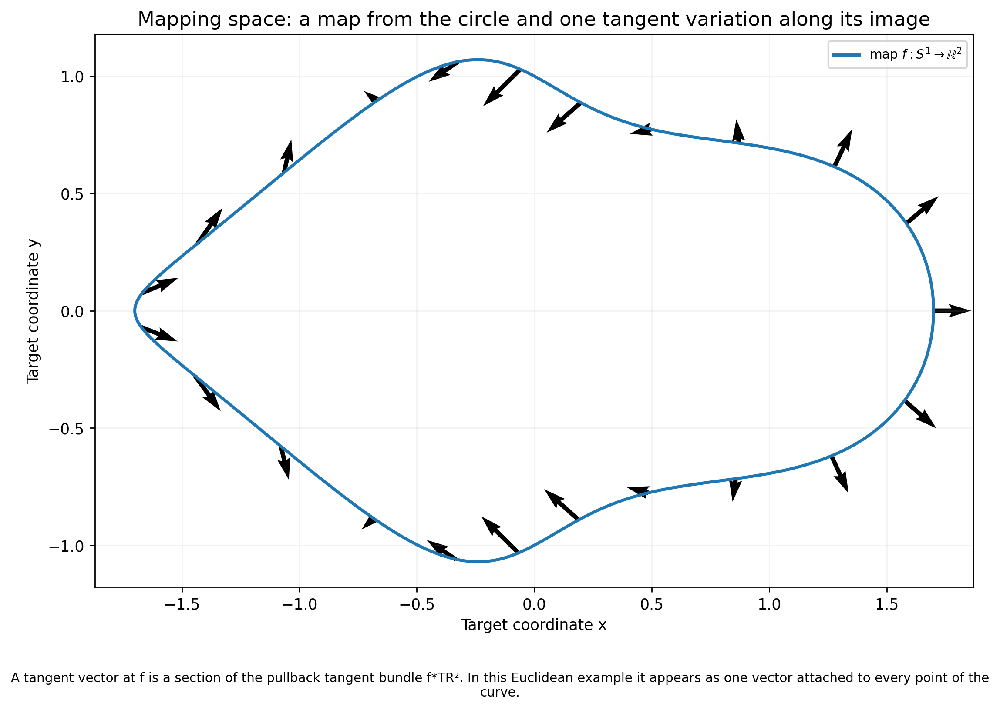

[22/44] algebraic_cusp: At a singular algebraic point, the Zariski tangent space can exceed the geometric tangent cone.


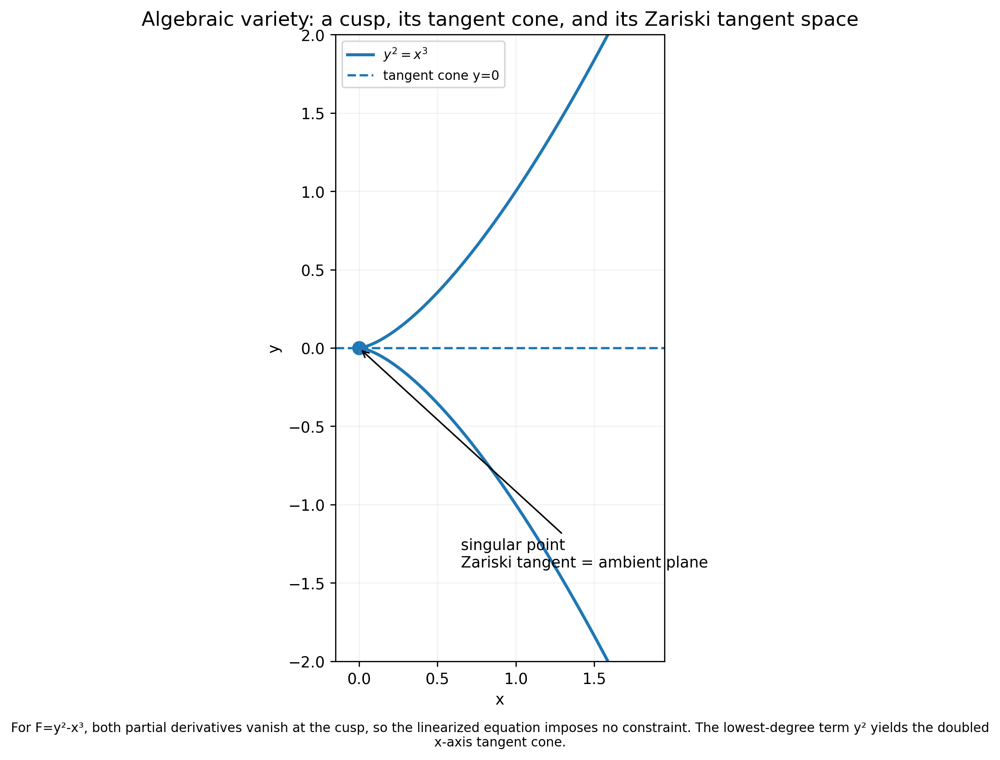

[23/44] stratified_tangent_cone: A stratified space can have ordinary tangent planes on smooth strata and a cone at a singular stratum.


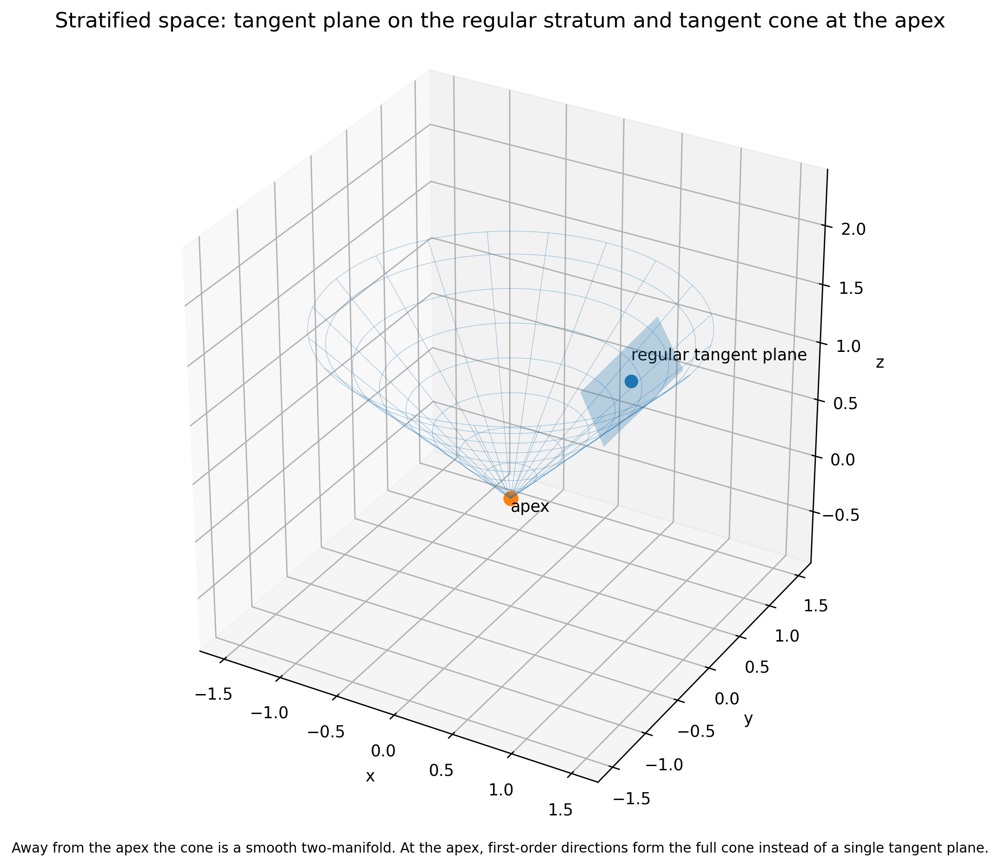

[24/44] orbifold_quotient: An orbifold has local models given by vector spaces modulo finite symmetry groups.


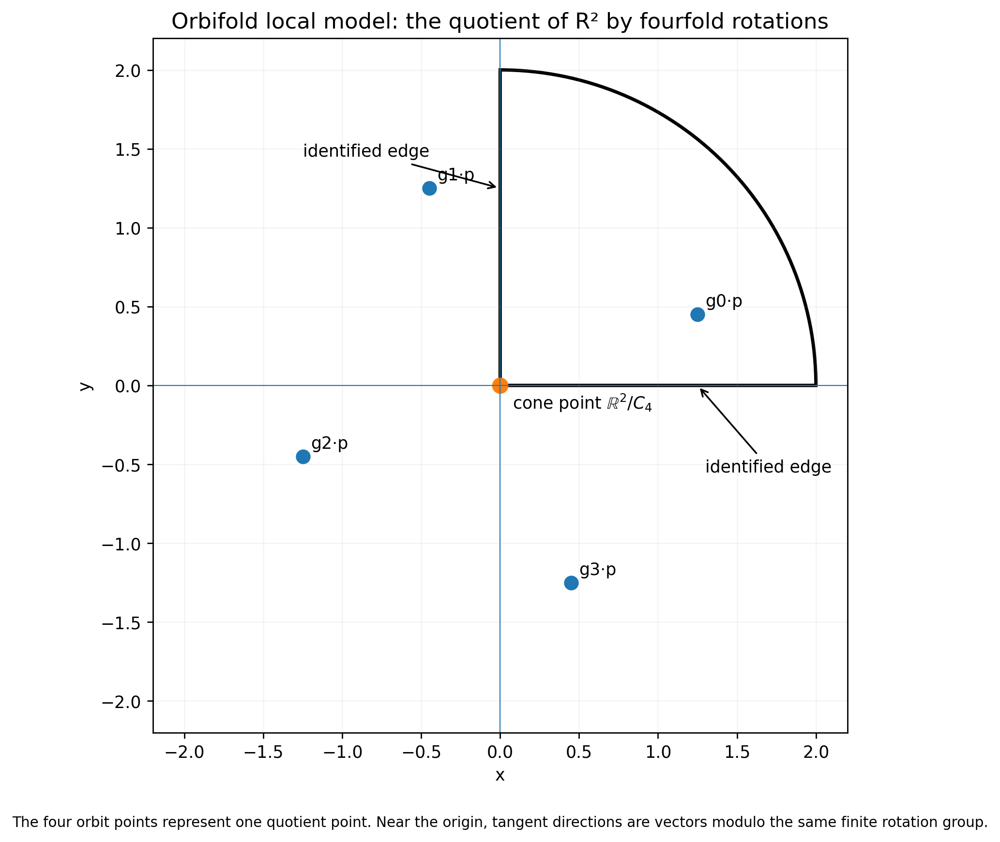

[25/44] moduli_upper_half_plane: A moduli space converts families of objects into points and local deformations into tangent vectors.


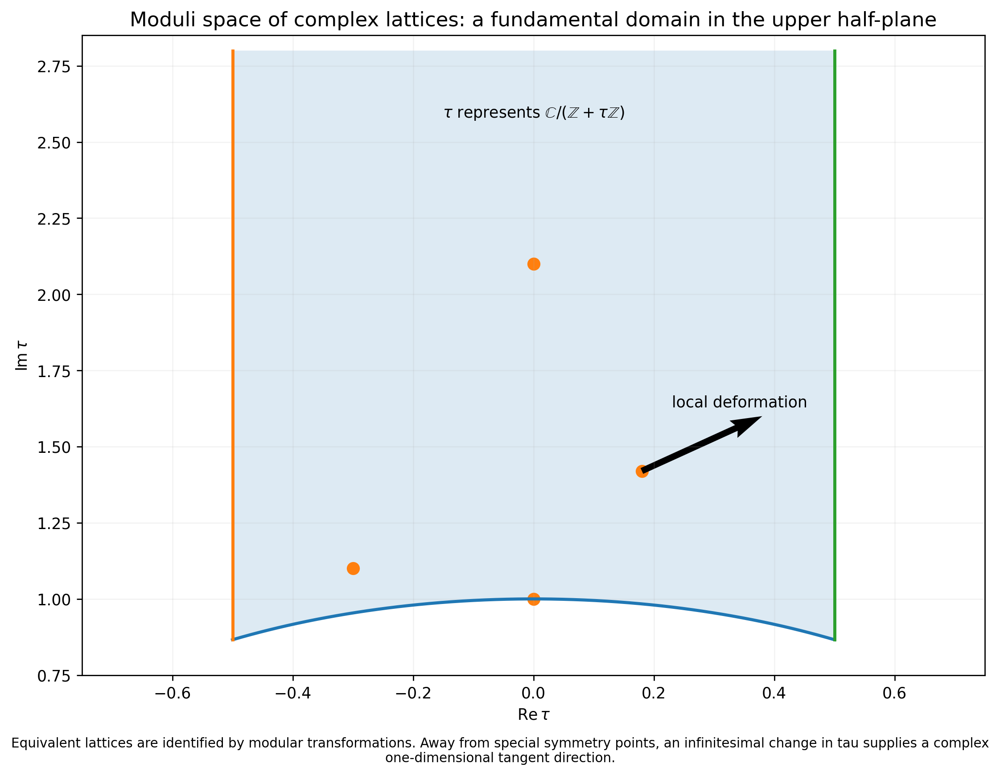

[26/44] sheaf_sections: Sheaves assemble local vector spaces of sections using restriction and compatibility maps.


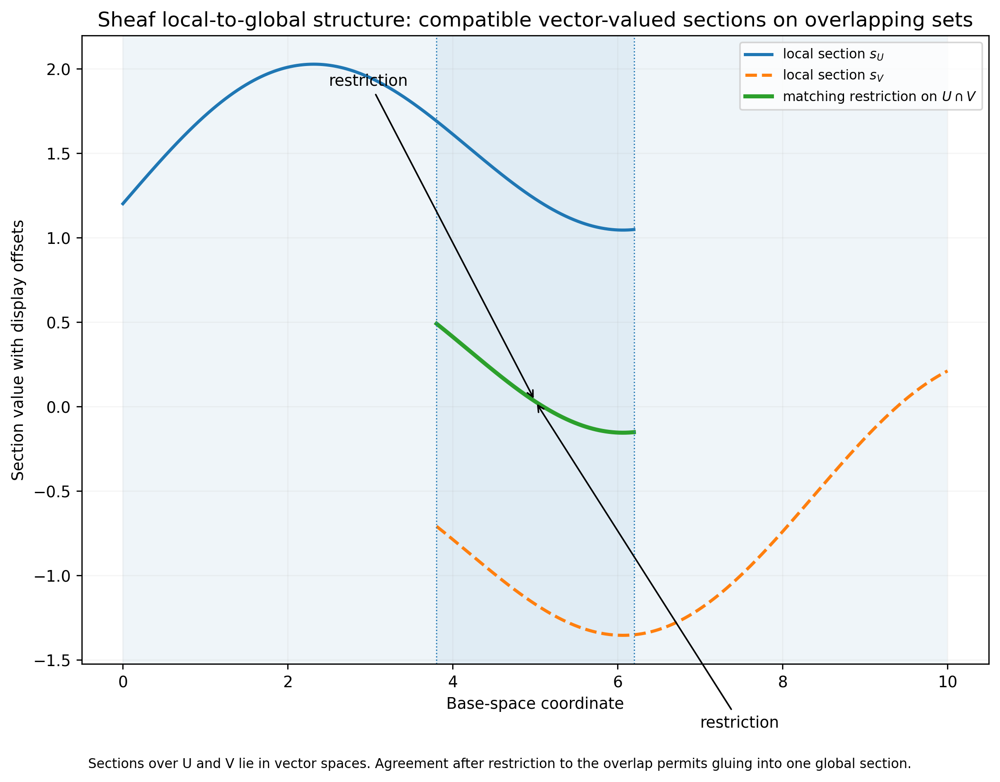

[27/44] convex_tangent_normal_cones: Optimization attaches tangent and normal cones to boundary points of convex sets.


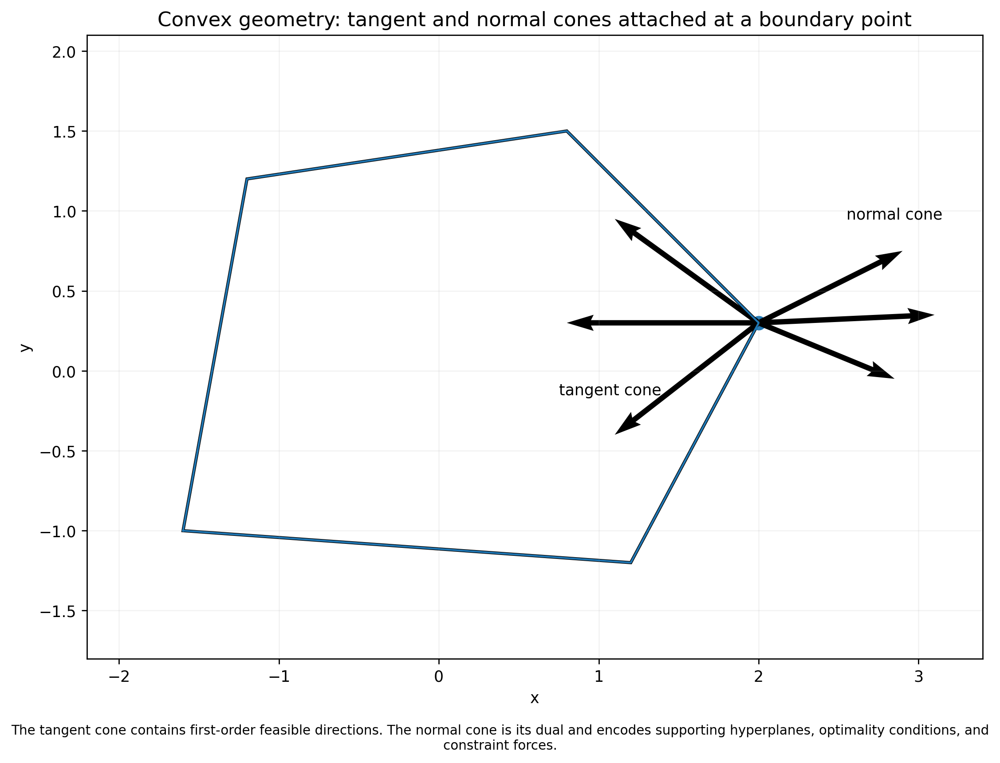

[28/44] tropical_tangent_fan: Tropical spaces are piecewise-linear objects whose local directions form polyhedral fans.


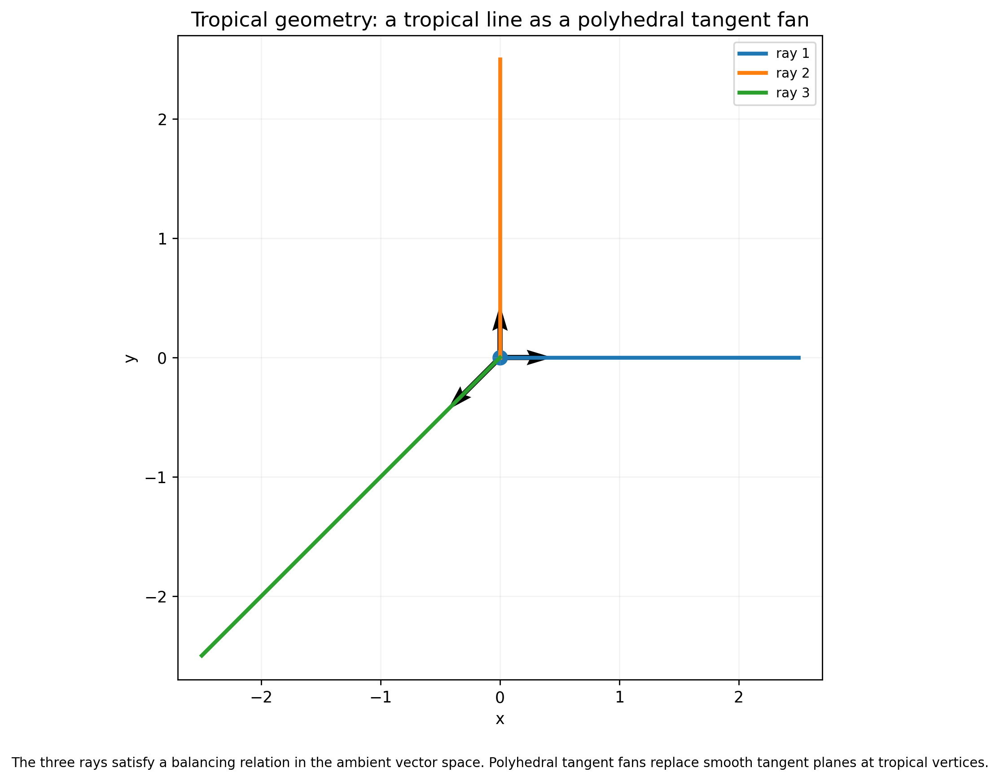

[29/44] derived_chain_complex: Derived and homological spaces retain higher-order information in complexes of vector spaces.


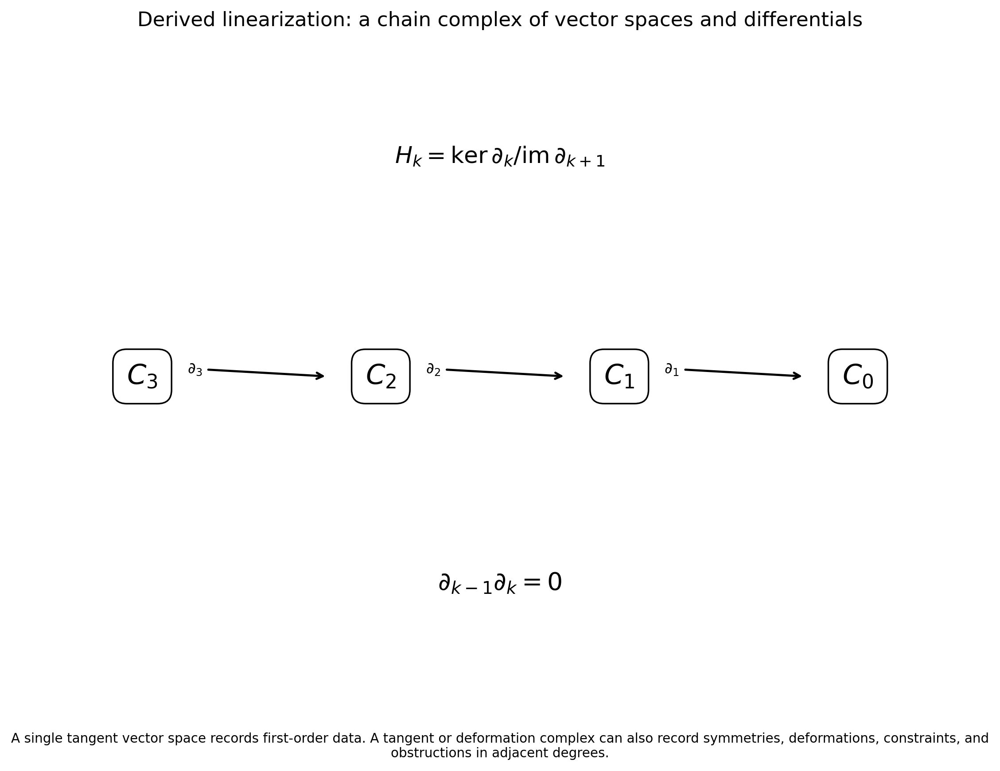

[30/44] graph_spectral_space: A graph becomes linear through vertex functions, incidence matrices, and Laplacian eigenspaces.


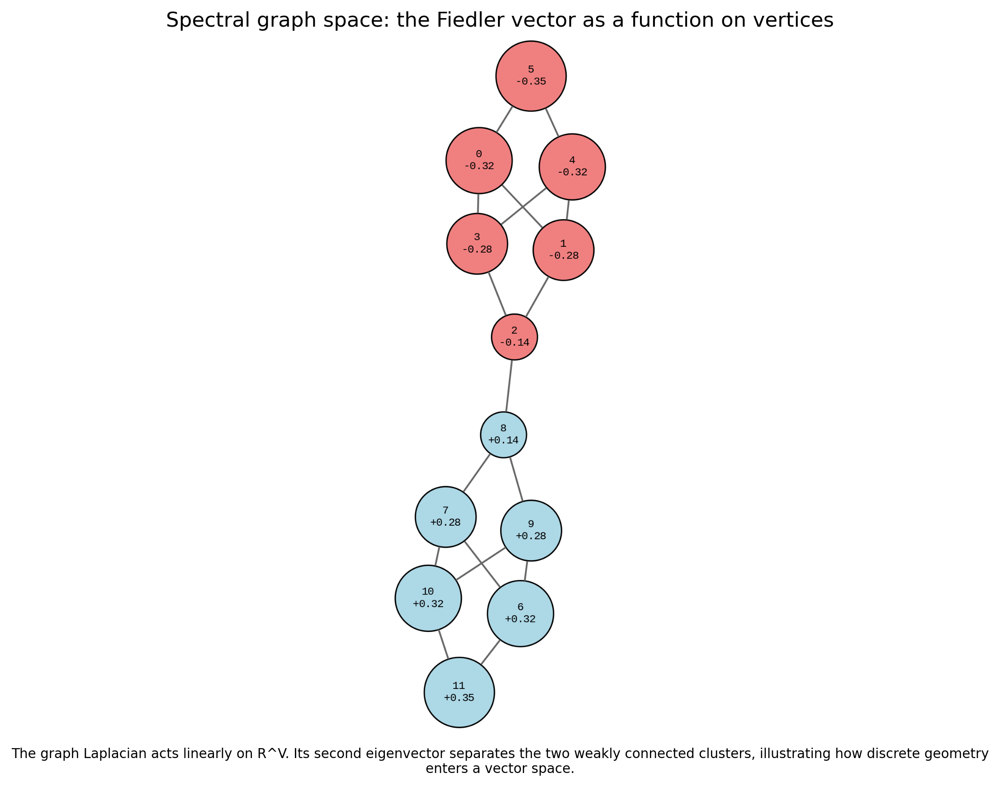

[31/44] simplicial_chain_space: A simplicial complex generates vector spaces of oriented vertices, edges, and faces.


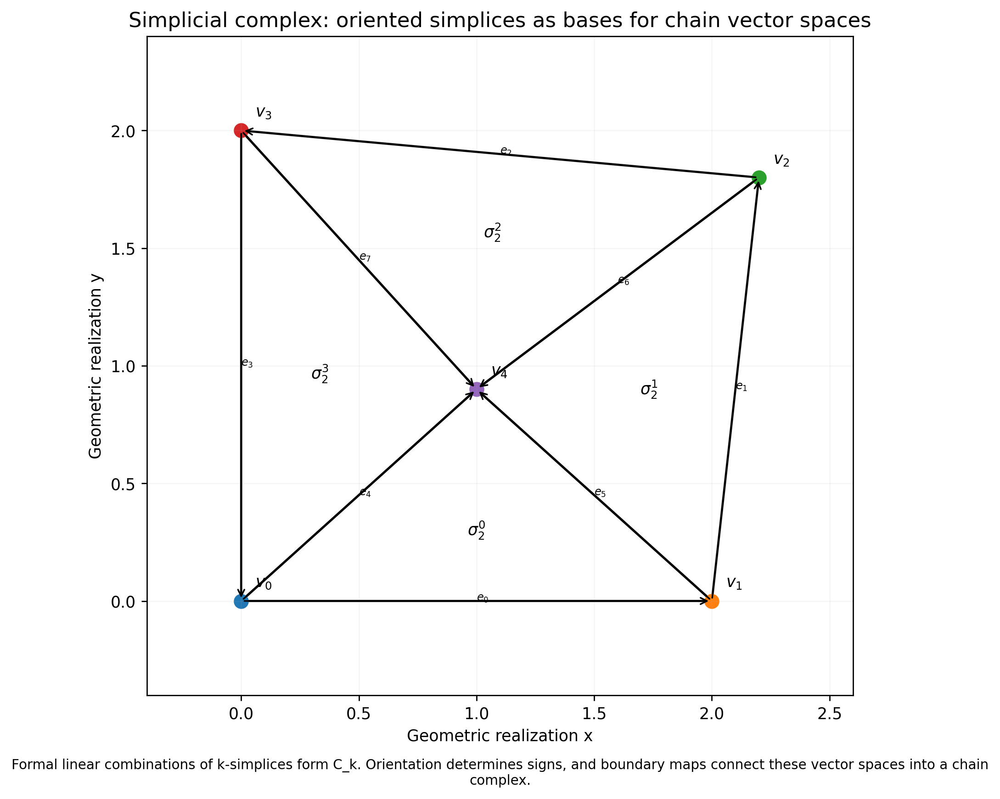

[32/44] boundary_operator_matrix: The boundary map of a discrete complex is a sparse linear operator.


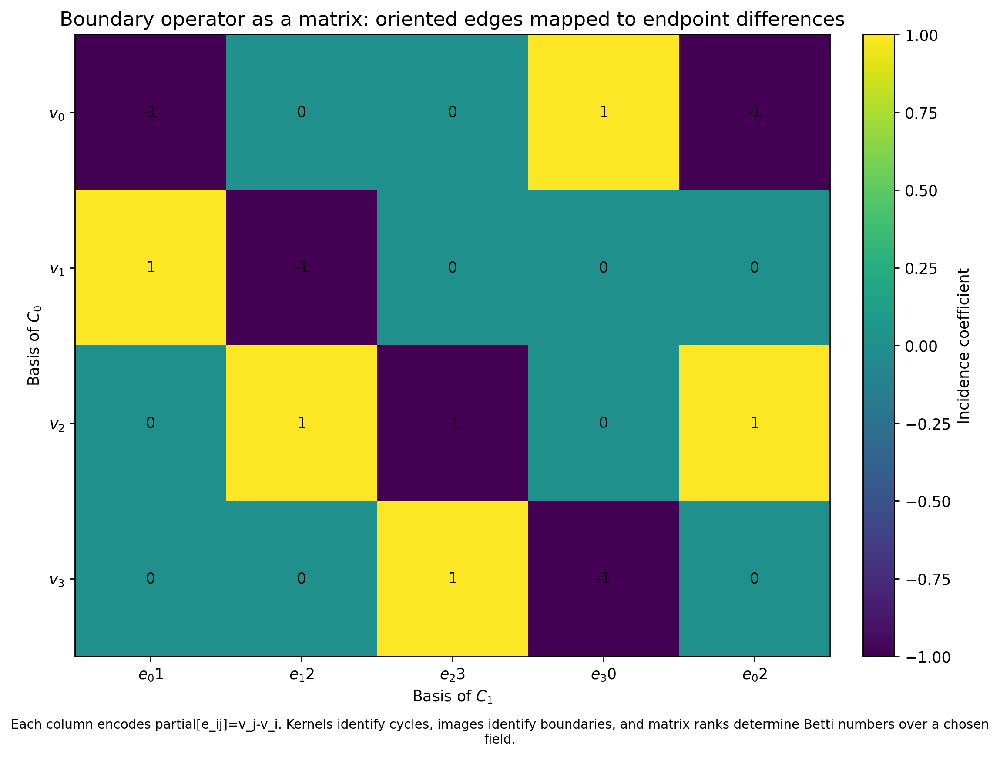

[33/44] torus_homology: Homology assigns global vector spaces whose basis cycles detect topological holes.


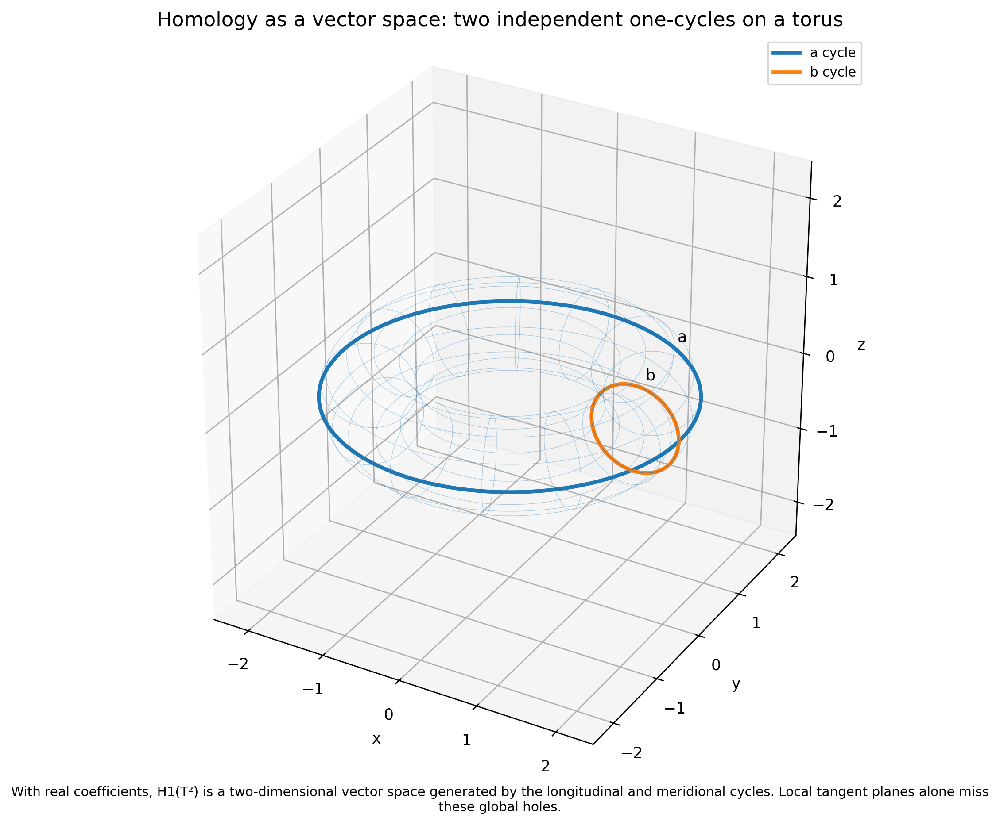

[34/44] metric_mds_embedding: A metric space can be represented by vectors whose Euclidean distances approximate the original metric.


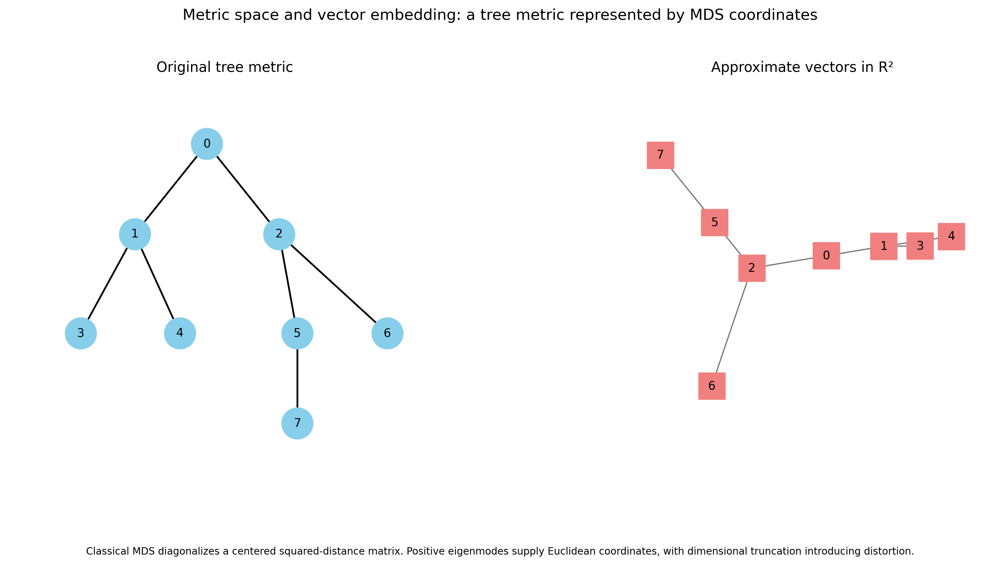

[35/44] p_adic_tree: An ultrametric groups points by shared residue digits and yields a nested hierarchy of balls.


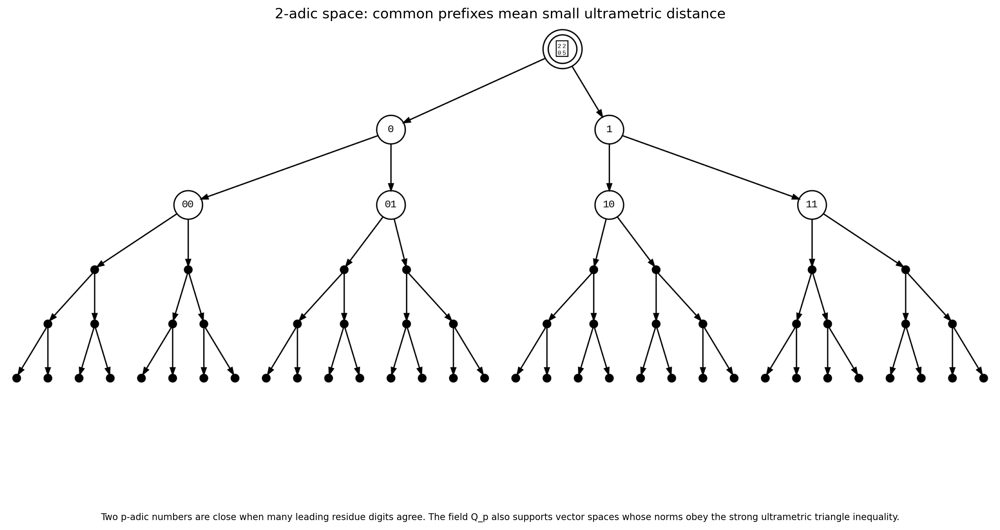

[36/44] cantor_cylinder_functions: A fractal space supports vector spaces of functions and measures despite lacking smooth tangent planes.


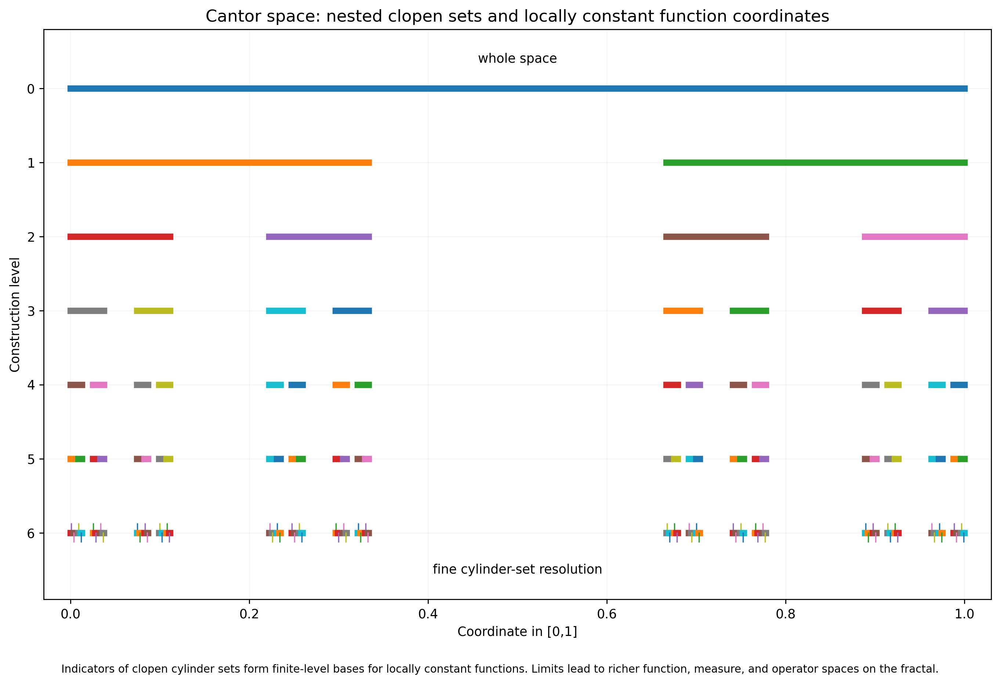

[37/44] measure_to_lp: A measure space generates vector spaces of integrable functions with p-norm geometry.


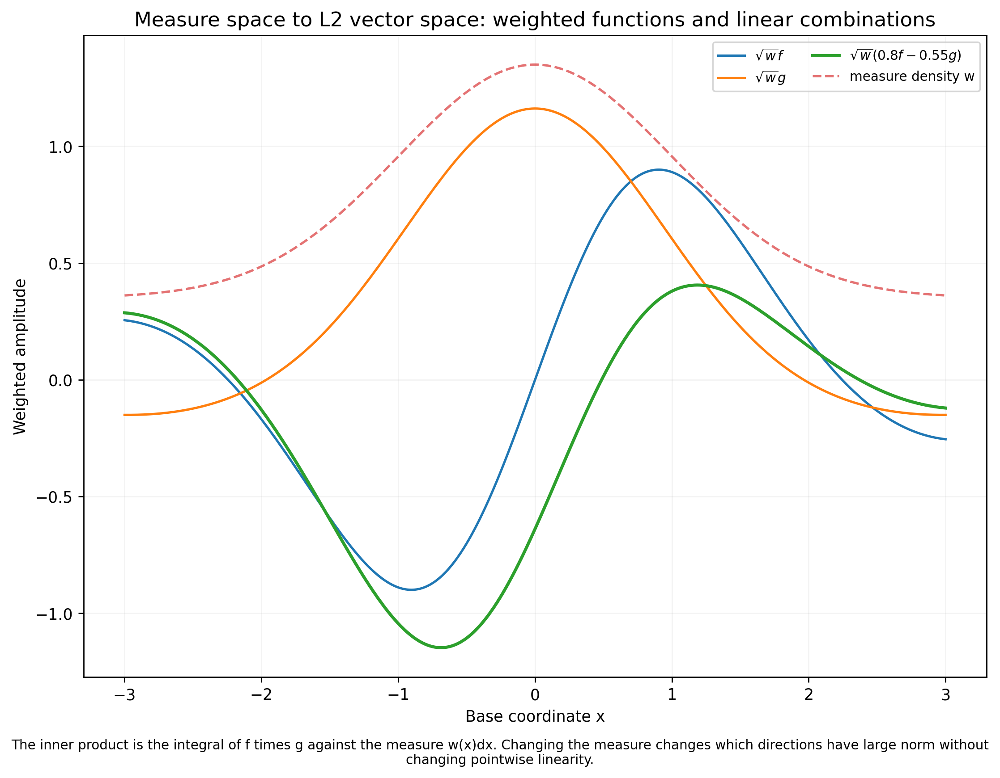

[38/44] probability_simplex: Finite probability distributions form a convex simplex with sum-zero tangent spaces.


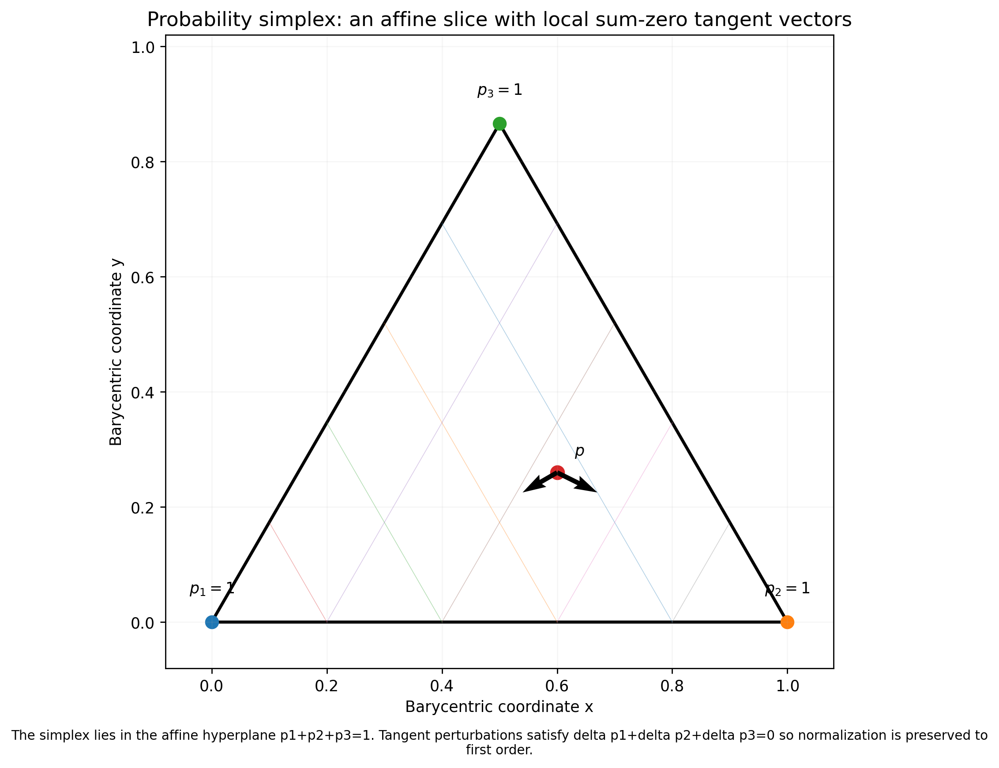

[39/44] information_geometry: The Fisher information equips a statistical model with a local inner product on score vectors.


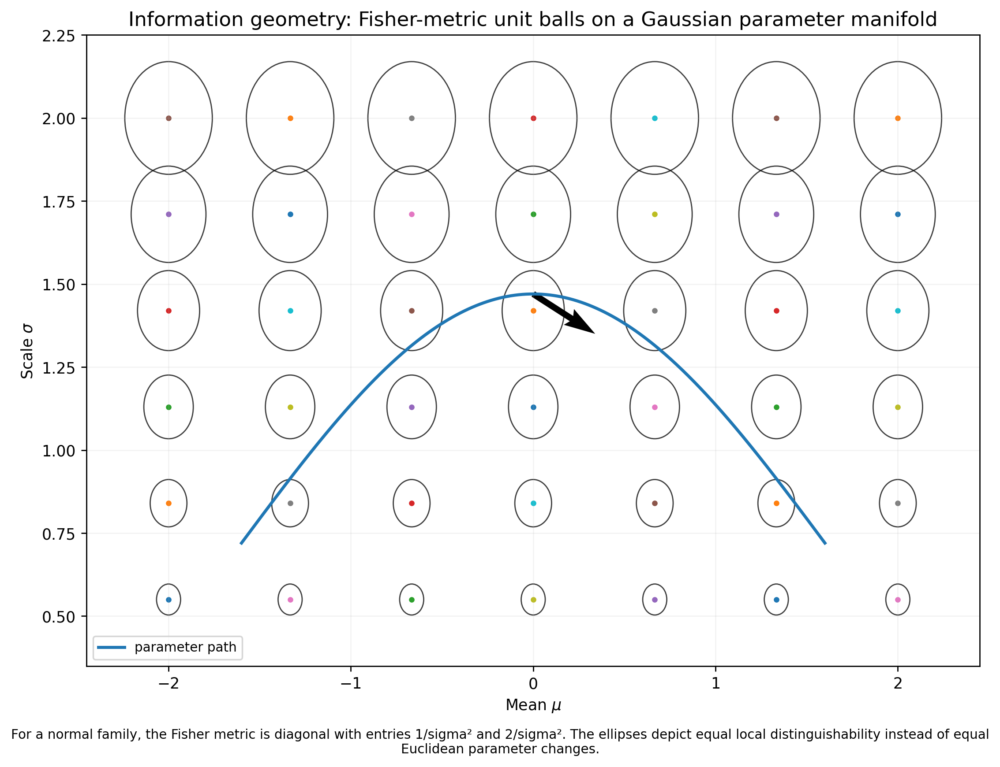

[40/44] wasserstein_geodesic: Wasserstein space treats probability measures as points and velocity fields as tangent directions.


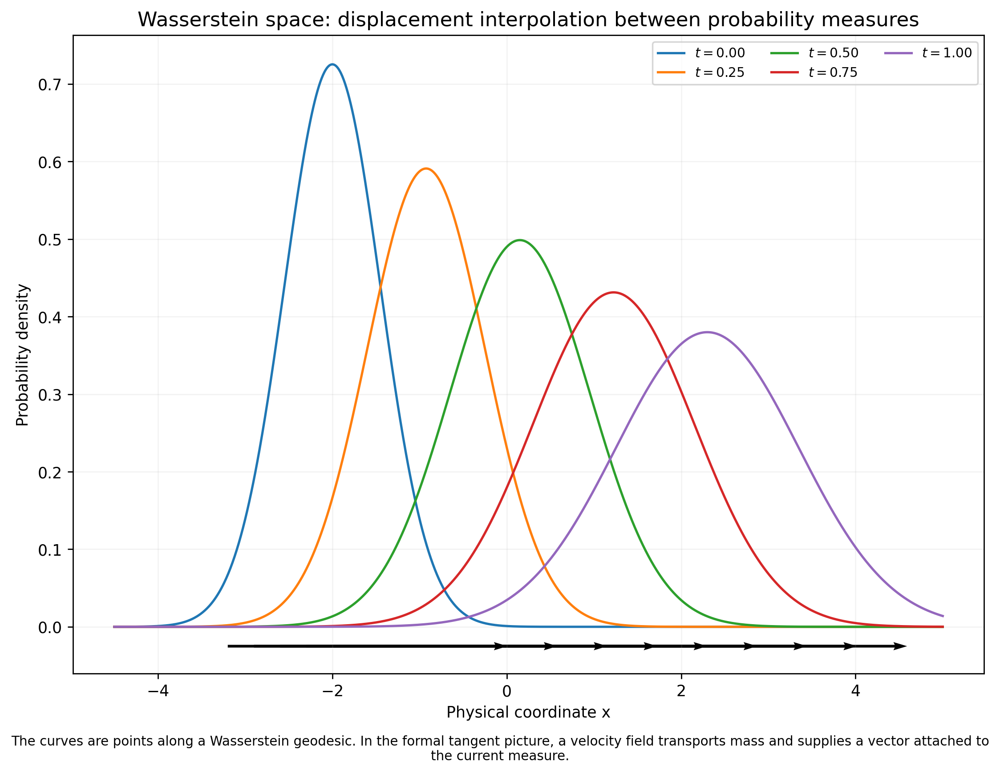

[41/44] rkhs_feature_map: A positive-definite kernel embeds inputs as vectors in a Hilbert feature space.


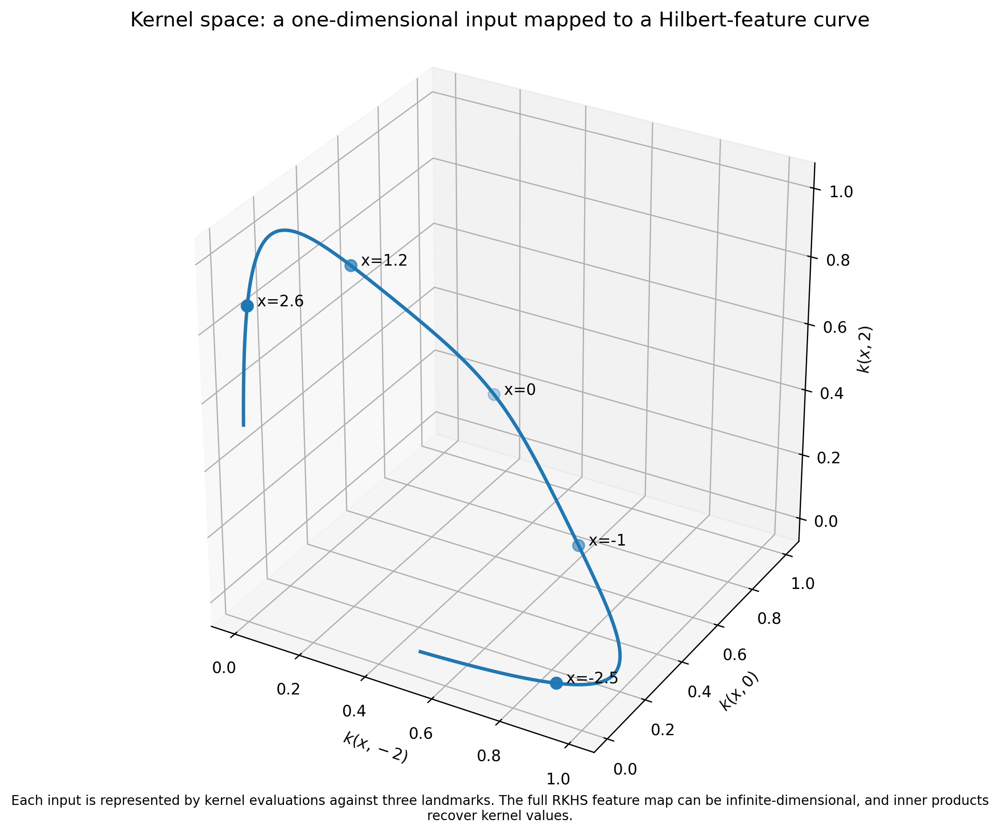

[42/44] statistical_score_tangent: Score functions are tangent vectors to a parametric family viewed inside a function space.


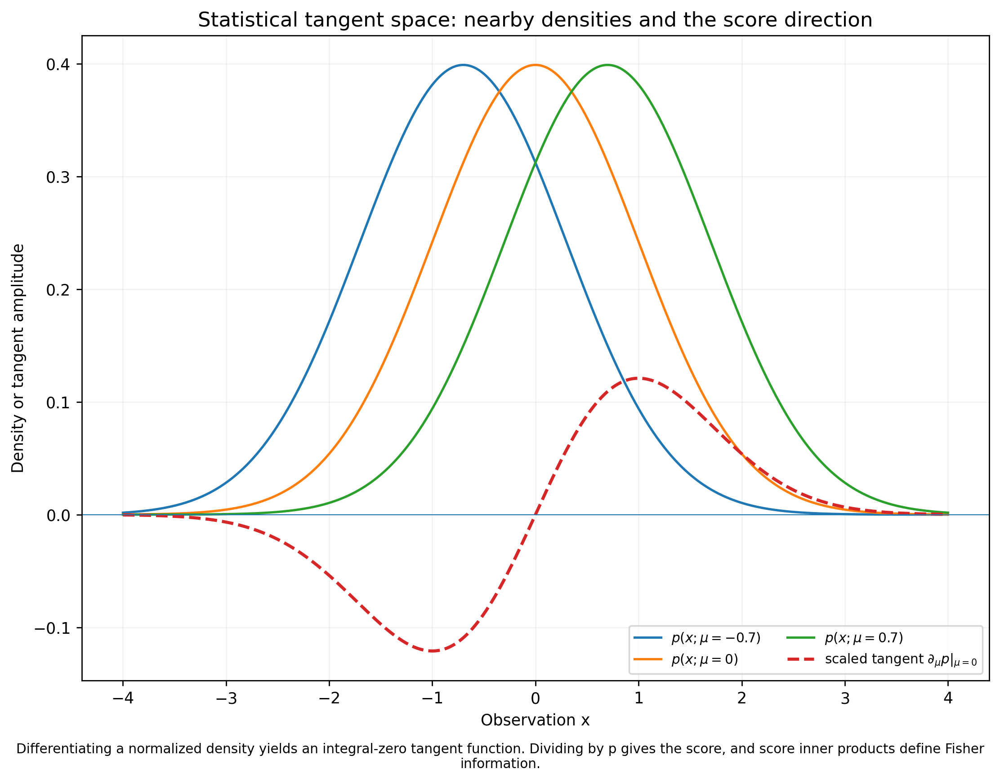

[43/44] data_manifold_tangent: A data manifold is a nonlinear subset of an ambient feature vector space with local tangent models.


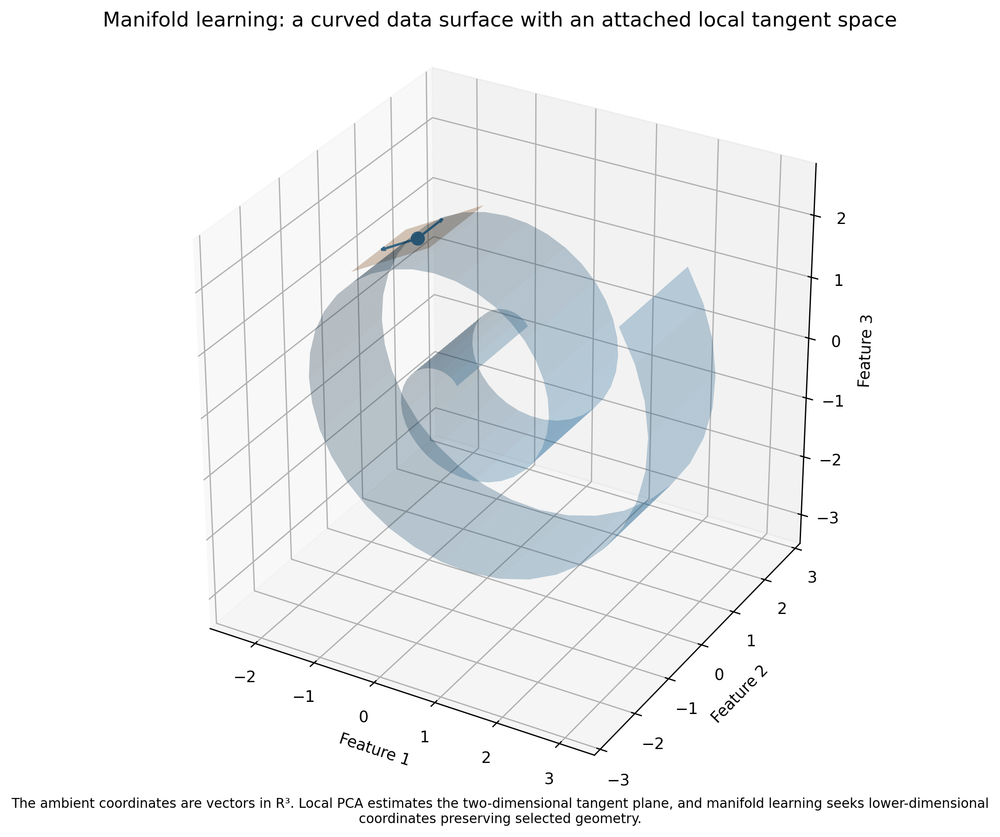

[44/44] gauge_connection_lattice: A gauge connection is locally Lie-algebra-valued data attached to paths or tangent directions.


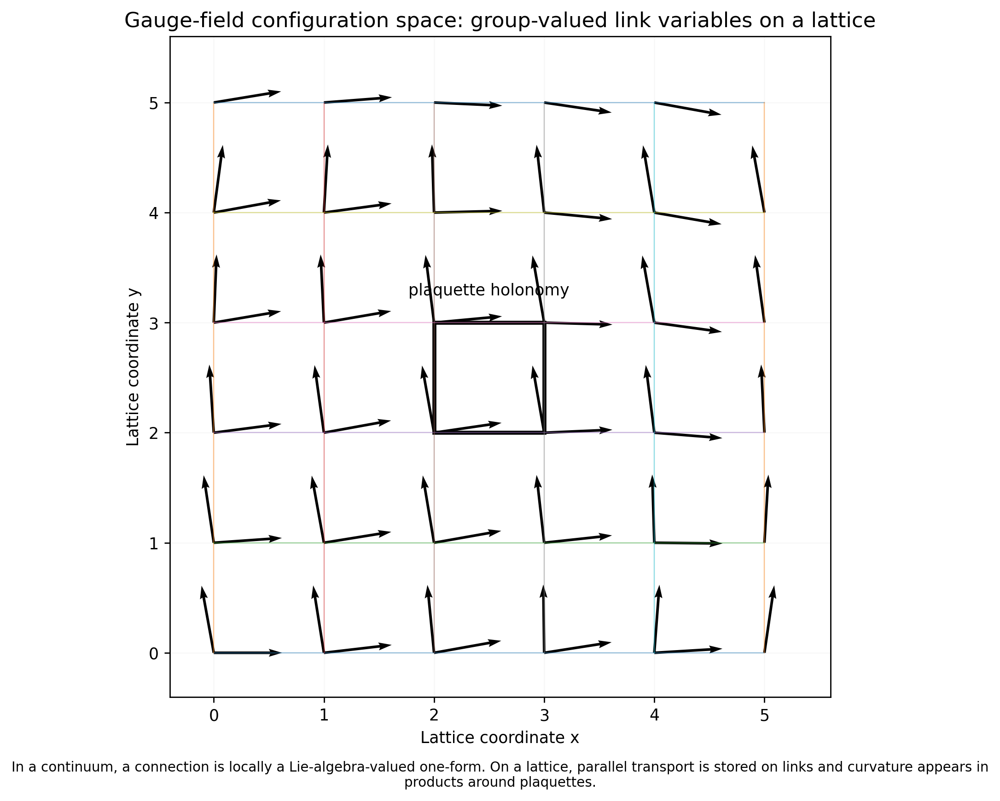

In [12]:
"""Render an atlas of mathematical spaces and their linear companions.

This script visualizes major families of mathematical spaces together with
vector spaces, vector bundles, section spaces, operator spaces, chain
complexes, tangent objects, and feature embeddings attached locally or
globally. Mathematics has no finite canonical list of every space ever
defined, so the atlas combines a broad catalog with representative plots.
"""

import argparse
import io
import math
from collections.abc import Callable, Iterable, Sequence
from dataclasses import dataclass
from typing import Final

import graphviz
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import qutip as qt
import scipy.sparse.csgraph as csgraph
from matplotlib.axes import Axes
from matplotlib.figure import Figure
from matplotlib.patches import Ellipse, FancyArrowPatch, Polygon, Wedge


# ---------------------------------------------------------------------------
# Control knobs
# ---------------------------------------------------------------------------
FIGURE_DPI: Final[int] = 250
GRAPHVIZ_DPI: Final[int] = 250
FIGURE_SIZE_2D: Final[tuple[float, float]] = (9.0, 7.0)
FIGURE_SIZE_3D: Final[tuple[float, float]] = (9.0, 7.5)
FIGURE_SIZE_TALL: Final[tuple[float, float]] = (13.0, 20.0)
RANDOM_SEED: Final[int] = 27
SPHERE_RESOLUTION: Final[int] = 60
SURFACE_RESOLUTION: Final[int] = 70
VECTOR_FIELD_DENSITY: Final[int] = 11
FOURIER_PARTIAL_SUMS: Final[tuple[int, ...]] = (1, 3, 9, 25)
DELTA_WIDTHS: Final[tuple[float, ...]] = (0.8, 0.4, 0.2, 0.1)
P_ADIC_PRIME: Final[int] = 2
P_ADIC_DEPTH: Final[int] = 5
CANTOR_DEPTH: Final[int] = 6
BLOCKING_SHOW: Final[bool] = True
PRINT_PROGRESS: Final[bool] = True
CONCEPT_NOTE_FONT_SIZE: Final[float] = 8.5

mpl.rcParams.update(
    {
        "figure.dpi": FIGURE_DPI,
        "savefig.dpi": FIGURE_DPI,
        "font.size": 10,
        "axes.titlesize": 13,
        "axes.labelsize": 10,
        "legend.fontsize": 8.5,
        "figure.autolayout": False,
        "font.sans-serif": ["Tahoma", "DejaVu Sans"],
        "font.weight": "normal",
    }
)


# ---------------------------------------------------------------------------
# Plot registry and mathematical-space catalog
# ---------------------------------------------------------------------------
@dataclass(frozen=True)
class PlotSpec:
    """Metadata for one atlas figure."""

    name: str
    group: str
    summary: str
    function: Callable[[], None]


@dataclass(frozen=True)
class SpaceRecord:
    """A mathematical space and the vector structures commonly attached."""

    name: str
    family: str
    structures: tuple[str, ...]


PLOT_REGISTRY: dict[str, PlotSpec] = {}


def register_plot(
    name: str,
    group: str,
    summary: str,
) -> Callable[[Callable[[], None]], Callable[[], None]]:
    """Register a plotting function.

    Args:
        name: Stable command-line identifier.
        group: Broad atlas group.
        summary: Concise mathematical interpretation.

    Returns:
        A decorator that registers the plotting function.
    """

    def decorator(function: Callable[[], None]) -> Callable[[], None]:
        if name in PLOT_REGISTRY:
            raise ValueError(f"Duplicate plot name: {name}")
        PLOT_REGISTRY[name] = PlotSpec(name, group, summary, function)
        return function

    return decorator


STRUCTURE_COLUMNS: Final[tuple[str, ...]] = (
    "Ambient or self",
    "Tangent or cotangent",
    "Bundles or sections",
    "Functions or duals",
    "Chains or cochains",
    "Operators or spectra",
    "Lie or representation",
    "Cones or generalized",
    "Deformation complex",
    "Embedding or features",
)

SPACE_CATALOG: Final[tuple[SpaceRecord, ...]] = (
    SpaceRecord("Vector space", "Linear", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Affine space", "Linear", ("Ambient or self", "Tangent or cotangent")),
    SpaceRecord("Inner-product space", "Linear", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Normed space", "Linear", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Banach space", "Linear", ("Ambient or self", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Hilbert space", "Linear", ("Ambient or self", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Topological vector space", "Linear", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Locally convex space", "Linear", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Fréchet space", "Linear", ("Ambient or self", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Nuclear space", "Linear", ("Ambient or self", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Sobolev space", "Analysis", ("Ambient or self", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Distribution space", "Analysis", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Operator space", "Analysis", ("Ambient or self", "Operators or spectra")),
    SpaceRecord("Euclidean space", "Geometry", ("Ambient or self", "Tangent or cotangent")),
    SpaceRecord("Smooth manifold", "Geometry", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Riemannian manifold", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Operators or spectra")),
    SpaceRecord("Symplectic manifold", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Operators or spectra")),
    SpaceRecord("Complex manifold", "Geometry", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Kähler manifold", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Operators or spectra")),
    SpaceRecord("Lie group", "Geometry", ("Tangent or cotangent", "Lie or representation")),
    SpaceRecord("Homogeneous space", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Lie or representation")),
    SpaceRecord("Fiber bundle", "Geometry", ("Bundles or sections",)),
    SpaceRecord("Vector bundle", "Geometry", ("Ambient or self", "Bundles or sections", "Functions or duals")),
    SpaceRecord("Principal bundle", "Geometry", ("Bundles or sections", "Lie or representation")),
    SpaceRecord("Projective space", "Geometry", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Grassmannian", "Geometry", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Stiefel manifold", "Geometry", ("Tangent or cotangent", "Ambient or self")),
    SpaceRecord("Configuration space", "Geometry", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Mapping space", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Functions or duals")),
    SpaceRecord("Loop or path space", "Geometry", ("Tangent or cotangent", "Bundles or sections", "Functions or duals")),
    SpaceRecord("Algebraic variety", "Algebraic", ("Tangent or cotangent", "Bundles or sections", "Cones or generalized")),
    SpaceRecord("Scheme", "Algebraic", ("Tangent or cotangent", "Bundles or sections", "Functions or duals")),
    SpaceRecord("Algebraic stack", "Algebraic", ("Bundles or sections", "Deformation complex")),
    SpaceRecord("Moduli space", "Algebraic", ("Tangent or cotangent", "Deformation complex")),
    SpaceRecord("Derived space", "Algebraic", ("Chains or cochains", "Deformation complex")),
    SpaceRecord("Supermanifold", "Algebraic", ("Tangent or cotangent", "Bundles or sections")),
    SpaceRecord("Singular or stratified space", "Singular", ("Tangent or cotangent", "Cones or generalized")),
    SpaceRecord("Orbifold", "Singular", ("Tangent or cotangent", "Bundles or sections", "Lie or representation")),
    SpaceRecord("Convex set or cone", "Singular", ("Ambient or self", "Cones or generalized")),
    SpaceRecord("Tropical variety", "Singular", ("Cones or generalized", "Chains or cochains")),
    SpaceRecord("Topological space", "Topology", ("Functions or duals", "Chains or cochains")),
    SpaceRecord("CW complex", "Topology", ("Chains or cochains",)),
    SpaceRecord("Simplicial complex", "Topology", ("Chains or cochains", "Operators or spectra")),
    SpaceRecord("Graph", "Topology", ("Ambient or self", "Chains or cochains", "Operators or spectra")),
    SpaceRecord("Metric space", "Topology", ("Functions or duals", "Embedding or features")),
    SpaceRecord("Uniform space", "Topology", ("Functions or duals",)),
    SpaceRecord("Fractal space", "Topology", ("Functions or duals", "Chains or cochains", "Operators or spectra")),
    SpaceRecord("p-adic or ultrametric space", "Topology", ("Ambient or self", "Functions or duals")),
    SpaceRecord("Non-Archimedean analytic space", "Topology", ("Tangent or cotangent", "Bundles or sections", "Ambient or self")),
    SpaceRecord("Measure space", "Probability", ("Functions or duals",)),
    SpaceRecord("Probability simplex", "Probability", ("Ambient or self", "Tangent or cotangent")),
    SpaceRecord("Statistical manifold", "Probability", ("Tangent or cotangent", "Functions or duals", "Operators or spectra")),
    SpaceRecord("Wasserstein space", "Probability", ("Tangent or cotangent", "Functions or duals")),
    SpaceRecord("Reproducing-kernel Hilbert space", "Data", ("Ambient or self", "Functions or duals", "Embedding or features")),
    SpaceRecord("Feature or latent space", "Data", ("Ambient or self", "Embedding or features")),
    SpaceRecord("Manifold-learning space", "Data", ("Tangent or cotangent", "Embedding or features", "Operators or spectra")),
    SpaceRecord("Quantum state space", "Physics", ("Ambient or self", "Tangent or cotangent", "Operators or spectra")),
    SpaceRecord("Classical phase space", "Physics", ("Tangent or cotangent", "Operators or spectra")),
    SpaceRecord("Gauge-field configuration space", "Physics", ("Tangent or cotangent", "Bundles or sections", "Lie or representation")),
    SpaceRecord("Noncommutative space", "Physics", ("Functions or duals", "Operators or spectra", "Chains or cochains")),
)


# ---------------------------------------------------------------------------
# Figure helpers
# ---------------------------------------------------------------------------
def new_2d_figure(
    title: str,
    figsize: tuple[float, float] = FIGURE_SIZE_2D,
) -> tuple[Figure, Axes]:
    """Create one two-dimensional figure and axis."""
    figure, axis = plt.subplots(figsize=figsize)
    axis.set_title(title)
    return figure, axis


def new_3d_figure(
    title: str,
    figsize: tuple[float, float] = FIGURE_SIZE_3D,
) -> tuple[Figure, Axes]:
    """Create one three-dimensional figure and axis."""
    figure = plt.figure(figsize=figsize)
    axis = figure.add_subplot(111, projection="3d")
    axis.set_title(title)
    return figure, axis


def render_graphviz_to_axis(
    dot_graph: graphviz.Graph | graphviz.Digraph,
    axis: Axes,
) -> None:
    """Render a Graphviz object into a Matplotlib axis using a memory buffer."""
    png_data = dot_graph.pipe(format="png")
    image = plt.imread(io.BytesIO(png_data))
    axis.imshow(image)
    axis.axis("off")


def finish_figure(figure: Figure, concept_note: str) -> None:
    """Render and close a figure without writing a file.

    Args:
        figure: Matplotlib figure to render.
        concept_note: Explanatory sentence placed below the plot.
    """
    figure.text(
        0.5,
        0.012,
        concept_note,
        ha="center",
        va="bottom",
        fontsize=CONCEPT_NOTE_FONT_SIZE,
        wrap=True,
    )
    figure.tight_layout(rect=(0.0, 0.045, 1.0, 1.0))
    if mpl.get_backend().lower() == "agg":
        figure.canvas.draw()
    else:
        plt.show(block=BLOCKING_SHOW)
    plt.close(figure)


def set_axes_equal_3d(axis: Axes) -> None:
    """Set approximately equal scale on a three-dimensional axis."""
    limits = np.array(
        [axis.get_xlim3d(), axis.get_ylim3d(), axis.get_zlim3d()],
        dtype=float,
    )
    spans = limits[:, 1] - limits[:, 0]
    centers = limits.mean(axis=1)
    radius = 0.5 * float(np.max(spans))
    axis.set_xlim3d(centers[0] - radius, centers[0] + radius)
    axis.set_ylim3d(centers[1] - radius, centers[1] + radius)
    axis.set_zlim3d(centers[2] - radius, centers[2] + radius)
    axis.set_box_aspect((1.0, 1.0, 1.0))


def unit_vector(vector: np.ndarray) -> np.ndarray:
    """Return a normalized copy of a vector."""
    norm = np.linalg.norm(vector)
    if norm == 0.0:
        raise ValueError("The zero vector has no direction.")
    return vector / norm


def draw_plane_patch(
    axis: Axes,
    point: np.ndarray,
    basis_a: np.ndarray,
    basis_b: np.ndarray,
    half_width: float,
    resolution: int = 9,
    alpha: float = 0.28,
) -> None:
    """Draw a rectangular plane patch in three dimensions."""
    coefficients = np.linspace(-half_width, half_width, resolution)
    aa, bb = np.meshgrid(coefficients, coefficients)
    patch = (
        point[:, None, None]
        + basis_a[:, None, None] * aa[None, :, :]
        + basis_b[:, None, None] * bb[None, :, :]
    )
    axis.plot_surface(patch[0], patch[1], patch[2], alpha=alpha)


def classical_mds(distance_matrix: np.ndarray, dimensions: int = 2) -> np.ndarray:
    """Embed a finite metric approximately with classical multidimensional scaling."""
    distances = np.asarray(distance_matrix, dtype=float)
    count = distances.shape[0]
    centering = np.eye(count) - np.ones((count, count)) / count
    gram = -0.5 * centering @ (distances**2) @ centering
    eigenvalues, eigenvectors = np.linalg.eigh(gram)
    order = np.argsort(eigenvalues)[::-1]
    selected_values = np.maximum(eigenvalues[order[:dimensions]], 0.0)
    selected_vectors = eigenvectors[:, order[:dimensions]]
    return selected_vectors * np.sqrt(selected_values)


def barycentric_to_cartesian(probabilities: np.ndarray) -> np.ndarray:
    """Map three-component probabilities to an equilateral simplex."""
    vertices = np.array(
        [
            [0.0, 0.0],
            [1.0, 0.0],
            [0.5, math.sqrt(3.0) / 2.0],
        ]
    )
    return probabilities @ vertices


def normal_density(x_values: np.ndarray, mean: float, sigma: float) -> np.ndarray:
    """Evaluate a normalized Gaussian density."""
    coefficient = 1.0 / (math.sqrt(2.0 * math.pi) * sigma)
    return coefficient * np.exp(-0.5 * ((x_values - mean) / sigma) ** 2)


# ---------------------------------------------------------------------------
# Overview plots
# ---------------------------------------------------------------------------
@register_plot(
    "catalog_matrix",
    "overview",
    "A coverage matrix linking broad space classes to recurring linear companions.",
)
def plot_catalog_matrix() -> None:
    """Plot the catalog of major spaces against attached vector structures."""
    matrix = np.zeros((len(SPACE_CATALOG), len(STRUCTURE_COLUMNS)), dtype=int)
    for row, record in enumerate(SPACE_CATALOG):
        for structure in record.structures:
            matrix[row, STRUCTURE_COLUMNS.index(structure)] = 1

    figure, axis = new_2d_figure(
        "Atlas coverage matrix: mathematical spaces and attached linear structures",
        FIGURE_SIZE_TALL,
    )
    image = axis.imshow(matrix, aspect="auto", interpolation="nearest")
    axis.set_xticks(np.arange(len(STRUCTURE_COLUMNS)))
    axis.set_xticklabels(STRUCTURE_COLUMNS, rotation=45, ha="right")
    axis.set_yticks(np.arange(len(SPACE_CATALOG)))
    axis.set_yticklabels(
        [f"{record.family}: {record.name}" for record in SPACE_CATALOG],
        fontsize=7.2,
    )
    axis.set_xlabel("Common linear companion")
    axis.set_ylabel("Space class")
    colorbar = figure.colorbar(image, ax=axis, fraction=0.025, pad=0.02)
    colorbar.set_ticks([0, 1])
    colorbar.set_ticklabels(["Absent from summary", "Common attachment"])
    finish_figure(
        figure,
        "Each row represents a broad class instead of every named instance. "
        "The matrix shows how tangent objects, sections, functions, chains, "
        "operators, cones, and embeddings recur across otherwise different spaces.",
    )


@register_plot(
    "space_taxonomy",
    "overview",
    "A radial taxonomy of the principal families represented in the atlas.",
)
def plot_space_taxonomy() -> None:
    """Plot a high-level taxonomy of mathematical spaces."""
    families: dict[str, tuple[str, ...]] = {
        "Linear and analytic": (
            "Vector",
            "Banach",
            "Hilbert",
            "Locally convex",
            "Sobolev",
            "Distribution",
        ),
        "Differential and geometric": (
            "Manifold",
            "Riemannian",
            "Symplectic",
            "Complex",
            "Lie group",
            "Fiber bundle",
            "Projective",
            "Grassmannian",
        ),
        "Topological and discrete": (
            "Topological",
            "Metric",
            "Graph",
            "Simplicial",
            "CW complex",
            "Fractal",
            "p-adic",
        ),
        "Algebraic and singular": (
            "Variety",
            "Scheme",
            "Stack",
            "Moduli",
            "Orbifold",
            "Stratified",
            "Tropical",
        ),
        "Probability and data": (
            "Measure",
            "Probability simplex",
            "Statistical manifold",
            "Wasserstein",
            "RKHS",
            "Feature space",
        ),
        "Physical state spaces": (
            "Phase space",
            "Quantum states",
            "Gauge configurations",
            "Operator geometry",
        ),
    }

    dot = graphviz.Digraph(engine="twopi")
    dot.attr(dpi=str(GRAPHVIZ_DPI), overlap="false", ranksep="1.8")
    dot.node_attr.update(fontname="Tahoma", style="filled")

    root = "Mathematical spaces"
    dot.node(root, label=root, shape="circle", width="1.4", fillcolor="white", fontsize="11")

    for family, leaves in families.items():
        dot.node(family, label=family, shape="box", fillcolor="lightgray", fontsize="9")
        dot.edge(root, family, penwidth="1.2")
        for leaf in leaves:
            dot.node(leaf, label=leaf, shape="plaintext", fontsize="8", fillcolor="white")
            dot.edge(family, leaf, penwidth="0.8", color="gray40")

    figure, axis = new_2d_figure(
        "A working taxonomy of major mathematical-space families",
        (13.5, 11.0),
    )
    render_graphviz_to_axis(dot, axis)
    finish_figure(
        figure,
        "The branches overlap in practice. A Hilbert manifold, a moduli stack, "
        "or a quantum statistical manifold can belong to several families at once.",
    )


@register_plot(
    "linearization_dictionary",
    "overview",
    "A map from nonlinear or discrete spaces to standard local and global linearizations.",
)
def plot_linearization_dictionary() -> None:
    """Plot a dictionary from spaces to attached vector structures."""
    mappings = (
        ("Smooth manifold", "Tangent and cotangent bundles"),
        ("Riemannian manifold", "Metric tensor and Laplace operator"),
        ("Symplectic manifold", "Hamiltonian vector fields"),
        ("Lie group", "Lie algebra at the identity"),
        ("Fiber bundle", "Vector space of sections"),
        ("Graph", "Vertex functions and Laplacian eigenspaces"),
        ("Simplicial complex", "Chain and cochain complexes"),
        ("Topological space", "Homology and cohomology"),
        ("Metric space", "Lipschitz functions and embeddings"),
        ("Measure space", "Lp function spaces"),
        ("Statistical model", "Score tangent space and Fisher metric"),
        ("Algebraic variety", "Zariski tangent space and differentials"),
        ("Singular space", "Tangent cone or tangent complex"),
        ("Moduli problem", "Deformation and obstruction spaces"),
        ("Kernel space", "Hilbert feature map"),
        ("Quantum states", "Hermitian trace-one operator space"),
    )

    figure, axis = new_2d_figure(
        "Linearization dictionary: spaces on the left, vector structures on the right",
        (13.0, 10.5),
    )
    y_positions = np.arange(len(mappings))[::-1]
    left_x = 0.0
    right_x = 10.0

    for y_value, (space_name, structure_name) in zip(
        y_positions,
        mappings,
        strict=True,
    ):
        axis.text(
            left_x,
            y_value,
            space_name,
            ha="left",
            va="center",
            bbox={"boxstyle": "round,pad=0.3", "fill": False},
        )
        axis.text(
            right_x,
            y_value,
            structure_name,
            ha="right",
            va="center",
            bbox={"boxstyle": "round,pad=0.3", "fill": False},
        )
        axis.annotate(
            "",
            xy=(right_x - 3.4, y_value),
            xytext=(left_x + 3.1, y_value),
            arrowprops={"arrowstyle": "->", "linewidth": 0.9},
        )

    axis.set_xlim(-0.4, 10.4)
    axis.set_ylim(-1.0, len(mappings))
    axis.axis("off")
    finish_figure(
        figure,
        "The arrow means that the right-hand object preserves selected information "
        "about the left-hand space. No single linearization automatically preserves "
        "every global, nonlinear, categorical, or singular feature.",
    )


# ---------------------------------------------------------------------------
# Linear and functional-analysis plots
# ---------------------------------------------------------------------------
@register_plot(
    "vector_affine",
    "linear",
    "Vector spaces have a preferred origin; affine spaces retain displacement vectors without one.",
)
def plot_vector_affine() -> None:
    """Contrast a vector space with an affine torsor over that vector space."""
    figure, axis = new_2d_figure(
        "Vector space and affine space: the same displacement vectors, different origin data"
    )

    vector_origin = np.array([-3.0, 0.0])
    affine_base = np.array([3.0, 0.5])
    basis = (np.array([1.5, 0.3]), np.array([-0.2, 1.4]))

    axis.axhline(0.0, linewidth=0.6, alpha=0.35)
    axis.axvline(0.0, linewidth=0.6, alpha=0.35)
    axis.scatter(*vector_origin, s=65, marker="o")
    for index, vector in enumerate(basis, start=1):
        axis.quiver(
            vector_origin[0],
            vector_origin[1],
            vector[0],
            vector[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.008,
        )
        tip = vector_origin + vector
        axis.text(tip[0], tip[1], rf"$e_{index}$", ha="left", va="bottom")

    axis.scatter(*affine_base, s=65, marker="s")
    displacement_a = np.array([1.6, 0.5])
    displacement_b = np.array([-0.6, 1.3])
    affine_points = [
        affine_base,
        affine_base + displacement_a,
        affine_base + displacement_b,
        affine_base + displacement_a + displacement_b,
    ]
    for point in affine_points:
        axis.scatter(*point, s=45)
    for displacement in (displacement_a, displacement_b):
        axis.quiver(
            affine_base[0],
            affine_base[1],
            displacement[0],
            displacement[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.008,
        )

    axis.text(-3.0, -1.3, "Vector space: a distinguished zero", ha="center")
    axis.text(3.0, -1.3, "Affine space: points differ by vectors", ha="center")
    axis.set_xlim(-5.2, 5.3)
    axis.set_ylim(-1.8, 3.0)
    axis.set_aspect("equal")
    axis.set_xlabel("First coordinate")
    axis.set_ylabel("Second coordinate")
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "An affine space is acted on freely and transitively by a vector space. "
        "Subtracting two points gives a vector, although adding two points has no intrinsic meaning.",
    )


@register_plot(
    "normed_unit_balls",
    "linear",
    "Different norms impose different geometries on the same underlying vector space.",
)
def plot_normed_unit_balls() -> None:
    """Overlay unit balls for several p norms on R squared."""
    figure, axis = new_2d_figure(
        "Normed spaces on the same vector space: unit balls for several p norms"
    )
    theta = np.linspace(0.0, 2.0 * math.pi, 1000)
    for p_value in (1.0, 2.0, 4.0):
        cosine = np.cos(theta)
        sine = np.sin(theta)
        x_values = np.sign(cosine) * np.abs(cosine) ** (2.0 / p_value)
        y_values = np.sign(sine) * np.abs(sine) ** (2.0 / p_value)
        axis.plot(x_values, y_values, label=rf"$\ell_{{{p_value:g}}}$")

    square = np.array(
        [
            [-1.0, -1.0],
            [1.0, -1.0],
            [1.0, 1.0],
            [-1.0, 1.0],
            [-1.0, -1.0],
        ]
    )
    axis.plot(square[:, 0], square[:, 1], label=r"$\ell_{\infty}$")
    axis.axhline(0.0, linewidth=0.6)
    axis.axvline(0.0, linewidth=0.6)
    axis.set_aspect("equal")
    axis.set_xlim(-1.25, 1.25)
    axis.set_ylim(-1.25, 1.25)
    axis.set_xlabel(r"Coefficient $x_1$")
    axis.set_ylabel(r"Coefficient $x_2$")
    axis.legend()
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "The p = 2 ball comes from an inner product. Other norms retain linearity "
        "and completeness may promote the space to a Banach space.",
    )


@register_plot(
    "locally_convex_seminorms",
    "linear",
    "A family of seminorms supplies the local convex geometry of many infinite-dimensional spaces.",
)
def plot_locally_convex_seminorms() -> None:
    """Visualize several seminorm neighborhoods in a coefficient plane."""
    figure, axis = new_2d_figure(
        "Locally convex geometry: neighborhoods generated by a family of seminorms"
    )
    parameter = np.linspace(0.0, 2.0 * math.pi, 600)
    scales = (0.55, 1.0, 1.8)
    for scale in scales:
        x_values = np.cos(parameter)
        y_values = np.sin(parameter) / scale
        axis.plot(
            x_values,
            y_values,
            label=rf"$p_{{{scale:g}}}(a,b)^2=a^2+({scale:g}b)^2$",
        )

    axis.scatter(0.0, 0.0, s=55)
    axis.axhline(0.0, linewidth=0.6)
    axis.axvline(0.0, linewidth=0.6)
    axis.set_aspect("equal")
    axis.set_xlabel(r"Coefficient $a$")
    axis.set_ylabel(r"Coefficient $b$")
    axis.legend(loc="upper right")
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "A locally convex topology can require many seminorms. This finite slice "
        "models neighborhoods in spaces of smooth functions, distributions, and sections.",
    )


@register_plot(
    "hilbert_fourier",
    "linear",
    "Fourier partial sums express a function as coordinates in an orthogonal Hilbert basis.",
)
def plot_hilbert_fourier() -> None:
    """Plot Fourier approximations to a periodic square wave."""
    x_values = np.linspace(-math.pi, math.pi, 1600)
    target = np.sign(np.sin(x_values))

    figure, axis = new_2d_figure(
        "Hilbert-space coordinates: Fourier partial sums in an L2 function space"
    )
    axis.plot(x_values, target, linewidth=2.0, label="Target function")
    for term_count in FOURIER_PARTIAL_SUMS:
        approximation = np.zeros_like(x_values)
        for odd_index in range(1, 2 * term_count, 2):
            approximation += np.sin(odd_index * x_values) / odd_index
        approximation *= 4.0 / math.pi
        axis.plot(
            x_values,
            approximation,
            linewidth=1.0,
            label=f"{term_count} odd modes",
        )

    axis.set_xlabel(r"Coordinate $x$")
    axis.set_ylabel(r"Function value")
    axis.legend(ncol=2)
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "The coefficients form an infinite vector. Convergence is naturally measured "
        "with the L2 norm, and orthogonality turns projection into linear algebra.",
    )


@register_plot(
    "sobolev_smoothing",
    "linear",
    "A Sobolev norm controls both function amplitude and weak derivatives.",
)
def plot_sobolev_smoothing() -> None:
    """Visualize spectral smoothing induced by a derivative penalty."""
    generator = np.random.default_rng(RANDOM_SEED)
    x_values = np.linspace(0.0, 2.0 * math.pi, 700, endpoint=False)
    truth = np.sin(x_values) + 0.35 * np.sin(5.0 * x_values)
    noisy = truth + 0.35 * generator.normal(size=x_values.size)

    frequencies = np.fft.fftfreq(x_values.size, d=1.0 / x_values.size)
    spectrum = np.fft.fft(noisy)
    regularization = 2.0e-5
    filter_values = 1.0 / (1.0 + regularization * frequencies**4)
    smoothed = np.fft.ifft(spectrum * filter_values).real

    figure, axis = new_2d_figure(
        "Sobolev-space regularization: suppressing rough high-frequency directions"
    )
    axis.plot(x_values, noisy, linewidth=0.7, alpha=0.55, label="Noisy observation")
    axis.plot(x_values, truth, linewidth=1.8, label="Underlying function")
    axis.plot(x_values, smoothed, linewidth=1.8, label="H2-regularized estimate")
    axis.set_xlabel(r"Coordinate $x$")
    axis.set_ylabel("Amplitude")
    axis.legend()
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "The Fourier multiplier approximates minimization of a data term plus a "
        "second-derivative penalty. Weak derivatives make this construction meaningful for rough functions.",
    )


@register_plot(
    "distribution_delta_sequence",
    "linear",
    "Distributions are continuous linear functionals on a test-function space.",
)
def plot_distribution_delta_sequence() -> None:
    """Plot a sequence of ordinary functions approaching a Dirac distribution."""
    x_values = np.linspace(-2.5, 2.5, 1200)
    figure, axis = new_2d_figure(
        "Distribution space: Gaussian test functions approaching the Dirac delta"
    )
    for width in DELTA_WIDTHS:
        values = normal_density(x_values, 0.0, width)
        axis.plot(x_values, values, label=rf"$\sigma={width:g}$")

    axis.set_xlabel(r"Coordinate $x$")
    axis.set_ylabel("Density")
    axis.legend()
    axis.grid(alpha=0.2)
    finish_figure(
        figure,
        "The peaks fail to converge to an ordinary finite-valued function. They converge "
        "weakly after integration against test functions, which defines the delta distribution.",
    )


@register_plot(
    "quantum_operator_space",
    "linear",
    "A qubit state is an affine point in the vector space of Hermitian operators.",
)
def plot_quantum_operator_space() -> None:
    """Visualize the Bloch ball as an affine slice of Hermitian operator space."""
    figure = plt.figure(figsize=FIGURE_SIZE_3D)
    axis = figure.add_subplot(111, projection="3d")
    axis.set_title("Quantum state space: the Bloch ball inside Hermitian operator space", pad=20)

    bloch_sphere = qt.Bloch(fig=figure, axes=axis)
    pure_vector = unit_vector(np.array([0.65, 0.25, 0.72]))
    mixed_vector = np.array([-0.35, 0.20, 0.15])
    zero_vector = np.zeros(3)

    bloch_sphere.add_vectors(pure_vector)
    bloch_sphere.add_vectors(mixed_vector)
    bloch_sphere.add_vectors(zero_vector)

    bloch_sphere.vector_color = ["#1f77b4", "#ff7f0e", "#2ca02c"]
    bloch_sphere.render()

    finish_figure(
        figure,
        "Every qubit density operator assumes an affine coordinate parameterization determined by Pauli matrices, "
        "where rigorous physical positivity restricts the allowable states strictly to the internal spherical volume.",
    )


# ---------------------------------------------------------------------------
# Differential and geometric plots
# ---------------------------------------------------------------------------
@register_plot(
    "manifold_tangent",
    "geometry",
    "A curved manifold is locally linearized by a tangent plane at each point.",
)
def plot_manifold_tangent() -> None:
    """Plot a sphere with one tangent plane and tangent basis."""
    figure, axis = new_3d_figure(
        "Smooth manifold: a tangent vector space attached at one point"
    )
    polar = np.linspace(0.0, math.pi, SPHERE_RESOLUTION)
    azimuth = np.linspace(0.0, 2.0 * math.pi, 2 * SPHERE_RESOLUTION)
    pp, aa = np.meshgrid(polar, azimuth)
    sphere_x = np.sin(pp) * np.cos(aa)
    sphere_y = np.sin(pp) * np.sin(aa)
    sphere_z = np.cos(pp)
    axis.plot_wireframe(
        sphere_x,
        sphere_y,
        sphere_z,
        rstride=5,
        cstride=7,
        linewidth=0.4,
        alpha=0.4,
    )

    point = unit_vector(np.array([0.72, 0.25, 0.65]))
    tangent_a = unit_vector(np.cross(np.array([0.0, 0.0, 1.0]), point))
    tangent_b = unit_vector(np.cross(point, tangent_a))
    draw_plane_patch(axis, point, tangent_a, tangent_b, half_width=0.55)
    axis.scatter(*point, s=55)
    for vector, label in ((tangent_a, r"$e_1$"), (tangent_b, r"$e_2$")):
        axis.quiver(
            point[0],
            point[1],
            point[2],
            0.55 * vector[0],
            0.55 * vector[1],
            0.55 * vector[2],
            arrow_length_ratio=0.12,
            linewidth=1.6,
        )
        tip = point + 0.58 * vector
        axis.text(tip[0], tip[1], tip[2], label)

    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "The sphere itself is nonlinear. Its tangent plane is a vector space that "
        "captures first-order motion near the selected point.",
    )


@register_plot(
    "sphere_vector_field",
    "geometry",
    "A vector field is a section selecting one tangent vector at every point.",
)
def plot_sphere_vector_field() -> None:
    """Plot a rotational vector field tangent to a sphere."""
    figure, axis = new_3d_figure(
        "Vector field on a manifold: a section of the tangent bundle"
    )
    polar = np.linspace(0.0, math.pi, 35)
    azimuth = np.linspace(0.0, 2.0 * math.pi, 70)
    pp, aa = np.meshgrid(polar, azimuth)
    axis.plot_wireframe(
        np.sin(pp) * np.cos(aa),
        np.sin(pp) * np.sin(aa),
        np.cos(pp),
        rstride=4,
        cstride=5,
        linewidth=0.35,
        alpha=0.28,
    )

    sample_polar = np.linspace(0.25, math.pi - 0.25, 8)
    sample_azimuth = np.linspace(0.0, 2.0 * math.pi, 14, endpoint=False)
    sample_pp, sample_aa = np.meshgrid(sample_polar, sample_azimuth)
    x_values = np.sin(sample_pp) * np.cos(sample_aa)
    y_values = np.sin(sample_pp) * np.sin(sample_aa)
    z_values = np.cos(sample_pp)
    vector_x = -y_values
    vector_y = x_values
    vector_z = np.zeros_like(z_values)
    axis.quiver(
        x_values,
        y_values,
        z_values,
        vector_x,
        vector_y,
        vector_z,
        length=0.18,
        normalize=True,
        arrow_length_ratio=0.25,
        linewidth=0.65,
    )
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "The field X(x,y,z)=(-y,x,0) generates rotations around the z axis. "
        "Every arrow lies in the tangent plane of the sphere at its base point.",
    )


@register_plot(
    "cotangent_gradient",
    "geometry",
    "A differential is a cotangent covector; a metric converts it into a gradient vector.",
)
def plot_cotangent_gradient() -> None:
    """Plot level sets and a gradient vector field."""
    coordinates = np.linspace(-2.2, 2.2, 160)
    x_grid, y_grid = np.meshgrid(coordinates, coordinates)
    scalar_field = 0.5 * x_grid**2 + y_grid**2 + 0.2 * x_grid * y_grid

    figure, axis = new_2d_figure(
        "Cotangent and tangent structures: level sets, differential, and gradient"
    )
    contours = axis.contour(x_grid, y_grid, scalar_field, levels=12)
    axis.clabel(contours, inline=True, fontsize=7)

    sparse = np.linspace(-2.0, 2.0, VECTOR_FIELD_DENSITY)
    sparse_x, sparse_y = np.meshgrid(sparse, sparse)
    gradient_x = sparse_x + 0.2 * sparse_y
    gradient_y = 2.0 * sparse_y + 0.2 * sparse_x
    magnitudes = np.hypot(gradient_x, gradient_y)
    magnitudes[magnitudes == 0.0] = 1.0
    axis.quiver(
        sparse_x,
        sparse_y,
        gradient_x / magnitudes,
        gradient_y / magnitudes,
        angles="xy",
        scale_units="xy",
        scale=4.5,
        width=0.004,
    )
    axis.set_aspect("equal")
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The covector df measures directional change. The Euclidean metric identifies "
        "df with grad f, whose arrows cross level sets orthogonally.",
    )


def poincare_geodesic_arc(
    point_a: np.ndarray,
    point_b: np.ndarray,
    sample_count: int = 500,
) -> tuple[np.ndarray, np.ndarray]:
    """Return the Poincare-disk geodesic segment joining two points."""
    matrix = 2.0 * np.vstack([point_a, point_b])
    right_hand_side = np.array(
        [
            1.0 + float(point_a @ point_a),
            1.0 + float(point_b @ point_b),
        ]
    )
    if abs(np.linalg.det(matrix)) < 1.0e-8:
        interpolation = np.linspace(0.0, 1.0, sample_count)
        segment = (
            (1.0 - interpolation)[:, None] * point_a
            + interpolation[:, None] * point_b
        )
        return segment[:, 0], segment[:, 1]

    center = np.linalg.solve(matrix, right_hand_side)
    radius_squared = float(center @ center) - 1.0
    radius = math.sqrt(max(radius_squared, 0.0))
    angle_a = math.atan2(point_a[1] - center[1], point_a[0] - center[0])
    angle_b = math.atan2(point_b[1] - center[1], point_b[0] - center[0])
    shortest_delta = (angle_b - angle_a + math.pi) % (2.0 * math.pi) - math.pi
    alternate_delta = shortest_delta - math.copysign(2.0 * math.pi, shortest_delta)

    candidates: list[np.ndarray] = []
    for delta in (shortest_delta, alternate_delta):
        angles = angle_a + np.linspace(0.0, delta, sample_count)
        candidate = center + radius * np.column_stack(
            [np.cos(angles), np.sin(angles)]
        )
        candidates.append(candidate)

    selected = min(
        candidates,
        key=lambda values: float(np.mean(np.linalg.norm(values, axis=1))),
    )
    mask = np.linalg.norm(selected, axis=1) <= 1.00001
    selected = selected[mask]
    return selected[:, 0], selected[:, 1]


@register_plot(
    "hyperbolic_tangent",
    "geometry",
    "The Poincare disk is locally Euclidean as a tangent space and globally hyperbolic.",
)
def plot_hyperbolic_tangent() -> None:
    """Plot geodesics and tangent arrows in the Poincare disk."""
    figure, axis = new_2d_figure(
        "Hyperbolic space: curved geodesics with ordinary vector tangent spaces"
    )
    boundary_angle = np.linspace(0.0, 2.0 * math.pi, 800)
    axis.plot(np.cos(boundary_angle), np.sin(boundary_angle), linewidth=1.8)

    endpoint_pairs = (
        (np.array([-0.65, -0.20]), np.array([0.55, 0.45])),
        (np.array([-0.20, 0.65]), np.array([0.65, -0.15])),
        (np.array([-0.75, 0.30]), np.array([0.15, -0.70])),
        (np.array([-0.55, 0.0]), np.array([0.55, 0.0])),
    )
    for point_a, point_b in endpoint_pairs:
        geodesic_x, geodesic_y = poincare_geodesic_arc(point_a, point_b)
        axis.plot(geodesic_x, geodesic_y, linewidth=1.5)

    tangent_points = np.array(
        [
            [-0.45, -0.15],
            [0.0, 0.25],
            [0.45, -0.25],
        ]
    )
    tangent_vectors = np.array(
        [
            [0.20, 0.12],
            [0.18, -0.08],
            [-0.10, 0.20],
        ]
    )
    axis.quiver(
        tangent_points[:, 0],
        tangent_points[:, 1],
        tangent_vectors[:, 0],
        tangent_vectors[:, 1],
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.006,
    )
    axis.set_aspect("equal")
    axis.set_xlim(-1.08, 1.08)
    axis.set_ylim(-1.08, 1.08)
    axis.set_xlabel("Disk coordinate x")
    axis.set_ylabel("Disk coordinate y")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The boundary lies at infinite hyperbolic distance. Tangent vectors remain "
        "ordinary two-component vectors, and the metric changes their lengths across the disk.",
    )


@register_plot(
    "symplectic_phase_space",
    "geometry",
    "A symplectic form converts energy differentials into Hamiltonian vector fields.",
)
def plot_symplectic_phase_space() -> None:
    """Plot a harmonic oscillator in a two-dimensional symplectic phase space."""
    coordinates = np.linspace(-2.4, 2.4, 180)
    position, momentum = np.meshgrid(coordinates, coordinates)
    hamiltonian = 0.5 * (position**2 + momentum**2)

    figure, axis = new_2d_figure(
        "Symplectic phase space: Hamiltonian level sets and the induced vector field"
    )
    contours = axis.contour(position, momentum, hamiltonian, levels=10)
    axis.clabel(contours, fontsize=7)
    sparse = np.linspace(-2.0, 2.0, 18)
    sparse_q, sparse_p = np.meshgrid(sparse, sparse)
    q_dot = sparse_p
    p_dot = -sparse_q
    axis.streamplot(sparse_q, sparse_p, q_dot, p_dot, density=1.0)
    axis.set_aspect("equal")
    axis.set_xlabel(r"Position $q$")
    axis.set_ylabel(r"Momentum $p$")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "For H=(q²+p²)/2, the symplectic relation i_X omega=dH gives X_H=(p,-q). "
        "The flow is tangent to constant-energy curves.",
    )


@register_plot(
    "complex_projective_line",
    "geometry",
    "The complex projective line is a sphere whose tangent plane carries a complex structure.",
)
def plot_complex_projective_line() -> None:
    """Plot CP1 as a sphere with a complex tangent basis."""
    figure, axis = new_3d_figure(
        "Complex projective space: CP¹ as a sphere with a complex tangent line"
    )
    polar = np.linspace(0.0, math.pi, SPHERE_RESOLUTION)
    azimuth = np.linspace(0.0, 2.0 * math.pi, 2 * SPHERE_RESOLUTION)
    pp, aa = np.meshgrid(polar, azimuth)
    axis.plot_wireframe(
        np.sin(pp) * np.cos(aa),
        np.sin(pp) * np.sin(aa),
        np.cos(pp),
        rstride=5,
        cstride=8,
        linewidth=0.38,
        alpha=0.38,
    )

    point = unit_vector(np.array([0.45, 0.55, 0.70]))
    tangent = unit_vector(np.cross(point, np.array([0.0, 0.0, 1.0])))
    complex_rotated = unit_vector(np.cross(point, tangent))
    draw_plane_patch(axis, point, tangent, complex_rotated, half_width=0.48)
    axis.scatter(*point, s=55)
    for vector, label in ((tangent, r"$v$"), (complex_rotated, r"$Jv$")):
        axis.quiver(
            point[0],
            point[1],
            point[2],
            0.48 * vector[0],
            0.48 * vector[1],
            0.48 * vector[2],
            arrow_length_ratio=0.12,
            linewidth=1.6,
        )
        label_point = point + 0.52 * vector
        axis.text(*label_point, label)

    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "As a real manifold, CP¹ has two-dimensional tangent planes. The operator J "
        "rotates each tangent vector by a quarter turn and supplies one complex dimension.",
    )


@register_plot(
    "lie_group_exponential",
    "geometry",
    "The tangent space at a Lie-group identity is a Lie algebra that generates the group locally.",
)
def plot_lie_group_exponential() -> None:
    """Visualize the exponential map from so(2) to SO(2)."""
    figure, axis = new_2d_figure(
        "Lie group and Lie algebra: the exponential map from so(2) to SO(2)"
    )
    angle = np.linspace(0.0, 2.0 * math.pi, 800)
    axis.plot(np.cos(angle), np.sin(angle), linewidth=1.8, label=r"$SO(2)$")
    axis.scatter(1.0, 0.0, s=65)
    axis.text(1.05, 0.05, "identity")
    axis.quiver(
        1.0,
        0.0,
        0.0,
        0.75,
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.008,
    )
    axis.text(1.06, 0.62, "generator")

    algebra_y = -2.2
    algebra_x = np.linspace(-2.5, 2.5, 300)
    axis.plot(algebra_x, np.full_like(algebra_x, algebra_y), linewidth=1.6)
    axis.text(0.0, algebra_y - 0.25, r"Lie algebra $\mathfrak{so}(2)\cong\mathbb{R}$", ha="center")
    sample_parameters = np.array([-2.0, -1.0, 0.0, 1.0, 2.0])
    for parameter in sample_parameters:
        source = np.array([parameter, algebra_y])
        target = np.array([math.cos(parameter), math.sin(parameter)])
        arrow = FancyArrowPatch(
            source,
            target,
            arrowstyle="->",
            mutation_scale=9,
            connectionstyle="arc3,rad=0.12",
            linewidth=0.8,
            alpha=0.7,
        )
        axis.add_patch(arrow)
        axis.scatter(*source, s=28)
        axis.scatter(*target, s=28)

    axis.set_aspect("equal")
    axis.set_xlim(-3.0, 3.0)
    axis.set_ylim(-2.7, 1.5)
    axis.set_xlabel("Coordinate")
    axis.set_ylabel("Coordinate")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The Lie algebra is linear and records infinitesimal generators. Exponentiation "
        "integrates those generators into finite rotations on the nonlinear group.",
    )


@register_plot(
    "mobius_bundle",
    "geometry",
    "A fiber bundle attaches a vector space to every base point and may twist globally.",
)
def plot_mobius_bundle() -> None:
    """Plot the Möbius line bundle with representative fibers and its zero section."""
    figure, axis = new_3d_figure(
        "Fiber bundle: a Möbius line bundle with local fibers and a global zero section"
    )
    base_parameter = np.linspace(0.0, 2.0 * math.pi, SURFACE_RESOLUTION)
    fiber_parameter = np.linspace(-0.42, 0.42, 17)
    uu, vv = np.meshgrid(base_parameter, fiber_parameter)
    x_values = (1.0 + vv * np.cos(uu / 2.0)) * np.cos(uu)
    y_values = (1.0 + vv * np.cos(uu / 2.0)) * np.sin(uu)
    z_values = vv * np.sin(uu / 2.0)
    axis.plot_surface(x_values, y_values, z_values, alpha=0.32, linewidth=0.2)

    zero_x = np.cos(base_parameter)
    zero_y = np.sin(base_parameter)
    zero_z = np.zeros_like(base_parameter)
    axis.plot(zero_x, zero_y, zero_z, linewidth=2.2, label="zero section")

    for base_value in np.linspace(0.0, 2.0 * math.pi, 9, endpoint=False):
        fiber = np.linspace(-0.42, 0.42, 25)
        fiber_x = (1.0 + fiber * math.cos(base_value / 2.0)) * math.cos(base_value)
        fiber_y = (1.0 + fiber * math.cos(base_value / 2.0)) * math.sin(base_value)
        fiber_z = fiber * math.sin(base_value / 2.0)
        axis.plot(fiber_x, fiber_y, fiber_z, linewidth=1.0)

    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("fiber coordinate")
    axis.legend()
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "Every base point carries a one-dimensional vector fiber. The fibers look locally "
        "like a product, and the half twist obstructs a continuous nowhere-zero global section.",
    )


@register_plot(
    "grassmannian_planes",
    "geometry",
    "A Grassmannian parameterizes linear subspaces and has tangent spaces built from linear maps.",
)
def plot_grassmannian_planes() -> None:
    """Visualize several planes represented by normal lines in Gr(2,R3)."""
    figure, axis = new_3d_figure(
        "Grassmannian Gr(2,3): planes through the origin parameterized by normal lines"
    )
    grid = np.linspace(-1.1, 1.1, 15)
    aa, bb = np.meshgrid(grid, grid)
    normals = (
        unit_vector(np.array([0.0, 0.0, 1.0])),
        unit_vector(np.array([0.55, 0.15, 0.82])),
        unit_vector(np.array([-0.35, 0.72, 0.60])),
    )

    for index, normal in enumerate(normals, start=1):
        trial = np.array([1.0, 0.0, 0.0])
        if abs(float(normal @ trial)) > 0.85:
            trial = np.array([0.0, 1.0, 0.0])
        basis_a = unit_vector(np.cross(normal, trial))
        basis_b = unit_vector(np.cross(normal, basis_a))
        plane = basis_a[:, None, None] * aa + basis_b[:, None, None] * bb
        axis.plot_surface(plane[0], plane[1], plane[2], alpha=0.18)
        axis.quiver(
            0.0,
            0.0,
            0.0,
            1.25 * normal[0],
            1.25 * normal[1],
            1.25 * normal[2],
            arrow_length_ratio=0.10,
            linewidth=1.4,
        )
        axis.text(*(1.35 * normal), f"$n_{index}$")

    axis.scatter(0.0, 0.0, 0.0, s=45)
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "A two-plane P in R³ is specified by a normal line n with n equivalent to -n. "
        "Its tangent space is naturally Hom(P, R³/P), another vector space.",
    )


@register_plot(
    "configuration_space",
    "geometry",
    "A configuration space removes forbidden coincidences and retains tangent directions for allowed motions.",
)
def plot_configuration_space() -> None:
    """Plot the collision-free configuration space of two particles on an interval."""
    figure, axis = new_2d_figure(
        "Configuration space: two labeled particles on an interval with collisions removed"
    )
    axis.add_patch(
        Polygon(
            [[0.0, 0.0], [1.0, 0.0], [1.0, 1.0], [0.0, 1.0]],
            closed=True,
            fill=False,
            linewidth=1.8,
        )
    )
    axis.plot([0.0, 1.0], [0.0, 1.0], linewidth=2.2, linestyle="--")
    axis.text(0.55, 0.50, r"collision set $x_1=x_2$", rotation=45)

    sample = np.linspace(0.10, 0.90, 9)
    first, second = np.meshgrid(sample, sample)
    difference = second - first
    mask = np.abs(difference) > 0.12
    velocity_first = -0.06 * np.sign(difference)
    velocity_second = 0.06 * np.sign(difference)
    axis.quiver(
        first[mask],
        second[mask],
        velocity_first[mask],
        velocity_second[mask],
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.004,
    )
    axis.text(0.18, 0.78, r"component $x_1<x_2$")
    axis.text(0.58, 0.18, r"component $x_1>x_2$")
    axis.set_xlim(-0.05, 1.05)
    axis.set_ylim(-0.05, 1.05)
    axis.set_aspect("equal")
    axis.set_xlabel(r"Particle coordinate $x_1$")
    axis.set_ylabel(r"Particle coordinate $x_2$")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The square is the ambient vector space of coordinates. Removing the diagonal "
        "creates two disconnected smooth regions, each with two-dimensional tangent spaces.",
    )


@register_plot(
    "mapping_space_tangent",
    "geometry",
    "The tangent to a mapping space consists of vector fields along the mapped object.",
)
def plot_mapping_space_tangent() -> None:
    """Plot a closed map and a tangent variation along it."""
    figure, axis = new_2d_figure(
        "Mapping space: a map from the circle and one tangent variation along its image"
    )
    parameter = np.linspace(0.0, 2.0 * math.pi, 700)
    curve_x = 1.5 * np.cos(parameter) + 0.20 * np.cos(3.0 * parameter)
    curve_y = np.sin(parameter) + 0.12 * np.sin(4.0 * parameter)
    axis.plot(curve_x, curve_y, linewidth=2.0, label=r"map $f:S^1\to\mathbb{R}^2$")

    sample_indices = np.linspace(0, parameter.size - 1, 24, dtype=int)[:-1]
    sample_parameter = parameter[sample_indices]
    sample_x = curve_x[sample_indices]
    sample_y = curve_y[sample_indices]
    variation_x = 0.16 * np.cos(2.0 * sample_parameter)
    variation_y = 0.16 * np.sin(3.0 * sample_parameter)
    axis.quiver(
        sample_x,
        sample_y,
        variation_x,
        variation_y,
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.005,
    )
    axis.set_aspect("equal")
    axis.set_xlabel("Target coordinate x")
    axis.set_ylabel("Target coordinate y")
    axis.legend()
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "A tangent vector at f is a section of the pullback tangent bundle f*TR². "
        "In this Euclidean example it appears as one vector attached to every point of the curve.",
    )


# ---------------------------------------------------------------------------
# Algebraic, singular, and generalized-space plots
# ---------------------------------------------------------------------------
@register_plot(
    "algebraic_cusp",
    "algebraic",
    "At a singular algebraic point, the Zariski tangent space can exceed the geometric tangent cone.",
)
def plot_algebraic_cusp() -> None:
    """Plot a cuspidal algebraic curve and its tangent objects at the origin."""
    parameter = np.linspace(-1.35, 1.35, 900)
    curve_x = parameter**2
    curve_y = parameter**3

    figure, axis = new_2d_figure(
        "Algebraic variety: a cusp, its tangent cone, and its Zariski tangent space"
    )
    axis.plot(curve_x, curve_y, linewidth=2.0, label=r"$y^2=x^3$")
    axis.axhline(0.0, linestyle="--", linewidth=1.5, label="tangent cone y=0")
    axis.scatter(0.0, 0.0, s=70)
    axis.annotate(
        "singular point\nZariski tangent = ambient plane",
        xy=(0.0, 0.0),
        xytext=(0.65, -1.4),
        arrowprops={"arrowstyle": "->"},
    )
    axis.set_xlim(-0.15, 1.95)
    axis.set_ylim(-2.0, 2.0)
    axis.set_aspect("equal", adjustable="box")
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.legend()
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "For F=y²-x³, both partial derivatives vanish at the cusp, so the linearized "
        "equation imposes no constraint. The lowest-degree term y² yields the doubled x-axis tangent cone.",
    )


@register_plot(
    "stratified_tangent_cone",
    "algebraic",
    "A stratified space can have ordinary tangent planes on smooth strata and a cone at a singular stratum.",
)
def plot_stratified_tangent_cone() -> None:
    """Plot a cone with a regular tangent plane and singular tangent cone."""
    figure, axis = new_3d_figure(
        "Stratified space: tangent plane on the regular stratum and tangent cone at the apex"
    )
    radius = np.linspace(0.0, 1.5, SURFACE_RESOLUTION)
    angle = np.linspace(0.0, 2.0 * math.pi, 2 * SURFACE_RESOLUTION)
    rr, aa = np.meshgrid(radius, angle)
    cone_x = rr * np.cos(aa)
    cone_y = rr * np.sin(aa)
    cone_z = rr
    axis.plot_wireframe(
        cone_x,
        cone_y,
        cone_z,
        rstride=7,
        cstride=9,
        linewidth=0.35,
        alpha=0.42,
    )

    regular_radius = 0.92
    regular_angle = 0.72
    point = np.array(
        [
            regular_radius * math.cos(regular_angle),
            regular_radius * math.sin(regular_angle),
            regular_radius,
        ]
    )
    radial_tangent = unit_vector(
        np.array(
            [math.cos(regular_angle), math.sin(regular_angle), 1.0]
        )
    )
    angular_tangent = unit_vector(
        np.array(
            [
                -regular_radius * math.sin(regular_angle),
                regular_radius * math.cos(regular_angle),
                0.0,
            ]
        )
    )
    draw_plane_patch(
        axis,
        point,
        radial_tangent,
        angular_tangent,
        half_width=0.42,
    )
    axis.scatter(*point, s=55)
    axis.scatter(0.0, 0.0, 0.0, s=70)
    axis.text(0.0, 0.0, -0.12, "apex")
    axis.text(point[0], point[1], point[2] + 0.18, "regular tangent plane")
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "Away from the apex the cone is a smooth two-manifold. At the apex, first-order "
        "directions form the full cone instead of a single tangent plane.",
    )


@register_plot(
    "orbifold_quotient",
    "algebraic",
    "An orbifold has local models given by vector spaces modulo finite symmetry groups.",
)
def plot_orbifold_quotient() -> None:
    """Plot a cyclic quotient of the plane by quarter turns."""
    figure, axis = new_2d_figure(
        "Orbifold local model: the quotient of R² by fourfold rotations"
    )
    sector = Wedge(
        center=(0.0, 0.0),
        r=2.0,
        theta1=0.0,
        theta2=90.0,
        fill=False,
        linewidth=2.0,
    )
    axis.add_patch(sector)
    base_point = np.array([1.25, 0.45])
    orbit_points = []
    for quarter_turn in range(4):
        angle = quarter_turn * math.pi / 2.0
        rotation = np.array(
            [
                [math.cos(angle), -math.sin(angle)],
                [math.sin(angle), math.cos(angle)],
            ]
        )
        orbit_points.append(rotation @ base_point)
    orbit = np.vstack(orbit_points)
    axis.scatter(orbit[:, 0], orbit[:, 1], s=60)
    for index, point in enumerate(orbit):
        axis.text(point[0] + 0.05, point[1] + 0.05, f"g{index}·p")

    axis.annotate(
        "identified edge",
        xy=(1.25, 0.0),
        xytext=(1.3, -0.55),
        arrowprops={"arrowstyle": "->"},
    )
    axis.annotate(
        "identified edge",
        xy=(0.0, 1.25),
        xytext=(-1.25, 1.45),
        arrowprops={"arrowstyle": "->"},
    )
    axis.scatter(0.0, 0.0, s=75)
    axis.text(0.08, -0.15, r"cone point $\mathbb{R}^2/C_4$")
    axis.axhline(0.0, linewidth=0.6)
    axis.axvline(0.0, linewidth=0.6)
    axis.set_xlim(-2.2, 2.2)
    axis.set_ylim(-2.2, 2.2)
    axis.set_aspect("equal")
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.grid(alpha=0.12)
    finish_figure(
        figure,
        "The four orbit points represent one quotient point. Near the origin, tangent "
        "directions are vectors modulo the same finite rotation group.",
    )


@register_plot(
    "moduli_upper_half_plane",
    "algebraic",
    "A moduli space converts families of objects into points and local deformations into tangent vectors.",
)
def plot_moduli_upper_half_plane() -> None:
    """Plot the modular fundamental domain for complex two-dimensional lattices."""
    figure, axis = new_2d_figure(
        "Moduli space of complex lattices: a fundamental domain in the upper half-plane"
    )
    x_values = np.linspace(-0.5, 0.5, 600)
    lower_boundary = np.sqrt(np.maximum(1.0 - x_values**2, 0.0))
    axis.plot(x_values, lower_boundary, linewidth=2.0)
    axis.plot([-0.5, -0.5], [math.sqrt(3.0) / 2.0, 2.8], linewidth=2.0)
    axis.plot([0.5, 0.5], [math.sqrt(3.0) / 2.0, 2.8], linewidth=2.0)
    axis.fill_between(x_values, lower_boundary, 2.8, alpha=0.15)

    sample_moduli = np.array(
        [
            [-0.30, 1.10],
            [0.00, 1.00],
            [0.18, 1.42],
            [0.00, 2.10],
        ]
    )
    axis.scatter(sample_moduli[:, 0], sample_moduli[:, 1], s=55)
    tangent_point = np.array([0.18, 1.42])
    tangent_vector = np.array([0.20, 0.18])
    axis.quiver(
        tangent_point[0],
        tangent_point[1],
        tangent_vector[0],
        tangent_vector[1],
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.007,
    )
    axis.text(0.23, 1.63, "local deformation")
    axis.text(0.0, 2.58, r"$\tau$ represents $\mathbb{C}/(\mathbb{Z}+\tau\mathbb{Z})$", ha="center")
    axis.set_xlim(-0.75, 0.75)
    axis.set_ylim(0.75, 2.85)
    axis.set_xlabel(r"$\operatorname{Re}\tau$")
    axis.set_ylabel(r"$\operatorname{Im}\tau$")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "Equivalent lattices are identified by modular transformations. Away from special "
        "symmetry points, an infinitesimal change in tau supplies a complex one-dimensional tangent direction.",
    )


@register_plot(
    "sheaf_sections",
    "algebraic",
    "Sheaves assemble local vector spaces of sections using restriction and compatibility maps.",
)
def plot_sheaf_sections() -> None:
    """Visualize compatible local sections over overlapping open sets."""
    figure, axis = new_2d_figure(
        "Sheaf local-to-global structure: compatible vector-valued sections on overlapping sets"
    )
    coordinate = np.linspace(0.0, 10.0, 1000)
    global_section = 0.65 * np.sin(0.75 * coordinate) + 0.08 * coordinate
    mask_u = coordinate <= 6.2
    mask_v = coordinate >= 3.8
    axis.plot(
        coordinate[mask_u],
        global_section[mask_u] + 1.2,
        linewidth=2.0,
        label=r"local section $s_U$",
    )
    axis.plot(
        coordinate[mask_v],
        global_section[mask_v] - 1.2,
        linewidth=2.0,
        linestyle="--",
        label=r"local section $s_V$",
    )
    overlap = (coordinate >= 3.8) & (coordinate <= 6.2)
    axis.plot(
        coordinate[overlap],
        global_section[overlap],
        linewidth=2.6,
        label=r"matching restriction on $U\cap V$",
    )
    axis.axvspan(0.0, 6.2, alpha=0.07)
    axis.axvspan(3.8, 10.0, alpha=0.07)
    axis.axvline(3.8, linewidth=0.8, linestyle=":")
    axis.axvline(6.2, linewidth=0.8, linestyle=":")
    axis.annotate(
        "restriction",
        xy=(5.0, global_section[np.argmin(np.abs(coordinate - 5.0))]),
        xytext=(2.5, 1.9),
        arrowprops={"arrowstyle": "->"},
    )
    axis.annotate(
        "restriction",
        xy=(5.0, global_section[np.argmin(np.abs(coordinate - 5.0))]),
        xytext=(7.0, -1.9),
        arrowprops={"arrowstyle": "->"},
    )
    axis.set_xlabel("Base-space coordinate")
    axis.set_ylabel("Section value with display offsets")
    axis.legend(loc="upper right")
    axis.grid(alpha=0.12)
    finish_figure(
        figure,
        "Sections over U and V lie in vector spaces. Agreement after restriction to the "
        "overlap permits gluing into one global section.",
    )


@register_plot(
    "convex_tangent_normal_cones",
    "algebraic",
    "Optimization attaches tangent and normal cones to boundary points of convex sets.",
)
def plot_convex_tangent_normal_cones() -> None:
    """Plot tangent and normal cones at a polygon boundary point."""
    figure, axis = new_2d_figure(
        "Convex geometry: tangent and normal cones attached at a boundary point"
    )
    polygon_vertices = np.array(
        [
            [-1.6, -1.0],
            [1.2, -1.2],
            [2.0, 0.3],
            [0.8, 1.5],
            [-1.2, 1.2],
            [-1.6, -1.0],
        ]
    )
    axis.add_patch(
        Polygon(polygon_vertices[:-1], closed=True, fill=False, linewidth=2.0)
    )
    axis.plot(polygon_vertices[:, 0], polygon_vertices[:, 1], linewidth=1.2)
    boundary_point = np.array([2.0, 0.3])
    axis.scatter(*boundary_point, s=70)

    tangent_directions = np.array([[-0.9, -0.7], [-0.9, 0.65], [-1.2, 0.0]])
    for direction in tangent_directions:
        axis.quiver(
            boundary_point[0],
            boundary_point[1],
            direction[0],
            direction[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.006,
        )
    normal_directions = np.array([[0.85, -0.35], [0.9, 0.45], [1.1, 0.05]])
    for direction in normal_directions:
        axis.quiver(
            boundary_point[0],
            boundary_point[1],
            direction[0],
            direction[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.006,
        )
    axis.text(0.75, -0.15, "tangent cone")
    axis.text(2.55, 0.95, "normal cone")
    axis.set_aspect("equal")
    axis.set_xlim(-2.2, 3.4)
    axis.set_ylim(-1.8, 2.1)
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The tangent cone contains first-order feasible directions. The normal cone is its "
        "dual and encodes supporting hyperplanes, optimality conditions, and constraint forces.",
    )


@register_plot(
    "tropical_tangent_fan",
    "algebraic",
    "Tropical spaces are piecewise-linear objects whose local directions form polyhedral fans.",
)
def plot_tropical_tangent_fan() -> None:
    """Plot a tropical line and its local tangent fan."""
    figure, axis = new_2d_figure(
        "Tropical geometry: a tropical line as a polyhedral tangent fan"
    )
    parameter = np.linspace(0.0, 2.5, 200)
    rays = (
        np.column_stack([parameter, np.zeros_like(parameter)]),
        np.column_stack([np.zeros_like(parameter), parameter]),
        np.column_stack([-parameter, -parameter]),
    )
    for index, ray in enumerate(rays, start=1):
        axis.plot(ray[:, 0], ray[:, 1], linewidth=2.5, label=f"ray {index}")
        direction = ray[min(35, len(ray) - 1)]
        axis.quiver(
            0.0,
            0.0,
            direction[0],
            direction[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.008,
        )
    axis.scatter(0.0, 0.0, s=80)
    axis.set_aspect("equal")
    axis.set_xlim(-2.7, 2.7)
    axis.set_ylim(-2.7, 2.7)
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.legend()
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The three rays satisfy a balancing relation in the ambient vector space. "
        "Polyhedral tangent fans replace smooth tangent planes at tropical vertices.",
    )


@register_plot(
    "derived_chain_complex",
    "algebraic",
    "Derived and homological spaces retain higher-order information in complexes of vector spaces.",
)
def plot_derived_chain_complex() -> None:
    """Draw a chain complex with vector spaces and linear differentials."""
    figure, axis = new_2d_figure(
        "Derived linearization: a chain complex of vector spaces and differentials"
    )
    positions = {
        r"$C_3$": (0.5, 0.0),
        r"$C_2$": (3.0, 0.0),
        r"$C_1$": (5.5, 0.0),
        r"$C_0$": (8.0, 0.0),
    }
    for label, position in positions.items():
        axis.text(
            position[0],
            position[1],
            label,
            ha="center",
            va="center",
            fontsize=18,
            bbox={"boxstyle": "round,pad=0.5", "fill": False},
        )
    labels = list(positions)
    for source, target, index in zip(labels[:-1], labels[1:], (3, 2, 1), strict=True):
        source_position = positions[source]
        target_position = positions[target]
        axis.annotate(
            rf"$\partial_{index}$",
            xy=(target_position[0] - 0.55, target_position[1]),
            xytext=(source_position[0] + 0.55, source_position[1]),
            ha="center",
            va="bottom",
            arrowprops={"arrowstyle": "->", "linewidth": 1.4},
        )
    axis.text(4.25, -1.25, r"$\partial_{k-1}\partial_k=0$", ha="center", fontsize=16)
    axis.text(4.25, 1.25, r"$H_k=\ker\partial_k/\operatorname{im}\partial_{k+1}$", ha="center", fontsize=15)
    axis.set_xlim(-0.8, 9.3)
    axis.set_ylim(-2.0, 2.0)
    axis.axis("off")
    finish_figure(
        figure,
        "A single tangent vector space records first-order data. A tangent or deformation "
        "complex can also record symmetries, deformations, constraints, and obstructions in adjacent degrees.",
    )


# ---------------------------------------------------------------------------
# Topological, combinatorial, and metric plots
# ---------------------------------------------------------------------------
@register_plot(
    "graph_spectral_space",
    "topology",
    "A graph becomes linear through vertex functions, incidence matrices, and Laplacian eigenspaces.",
)
def plot_graph_spectral_space() -> None:
    """Plot a graph with its Fiedler eigenvector attached to vertices."""
    edges: list[tuple[int, int]] = []
    for index in range(6):
        edges.append((index, (index + 1) % 6))
    for index in range(6, 12):
        edges.append((index, 6 + ((index - 6 + 1) % 6)))
    edges.extend([(0, 3), (1, 4), (6, 9), (7, 10), (2, 8)])

    adjacency = np.zeros((12, 12), dtype=float)
    for u, v in edges:
        adjacency[u, v] = 1.0
        adjacency[v, u] = 1.0

    degrees = np.diag(np.sum(adjacency, axis=1))
    laplacian = degrees - adjacency
    eigenvalues, eigenvectors = np.linalg.eigh(laplacian)
    fiedler = eigenvectors[:, 1]

    dot = graphviz.Graph(engine="neato")
    dot.attr(dpi=str(GRAPHVIZ_DPI), overlap="false")
    dot.node_attr.update(fontname="Tahoma", style="filled")

    for node in range(12):
        value = fiedler[node]
        color = "lightblue" if value > 0 else "lightcoral"
        width_val = 0.3 + 1.2 * abs(value)
        dot.node(
            str(node),
            label=f"{node}\n{value:+.2f}",
            fillcolor=color,
            width=f"{width_val:.2f}",
            shape="circle",
            fixedsize="true",
            fontsize="8",
        )

    for u, v in edges:
        dot.edge(str(u), str(v), penwidth="1.3", color="gray40")

    figure, axis = new_2d_figure(
        "Spectral graph space: the Fiedler vector as a function on vertices"
    )
    render_graphviz_to_axis(dot, axis)
    finish_figure(
        figure,
        "The graph Laplacian acts linearly on R^V. Its second eigenvector separates the "
        "two weakly connected clusters, illustrating how discrete geometry enters a vector space.",
    )


@register_plot(
    "simplicial_chain_space",
    "topology",
    "A simplicial complex generates vector spaces of oriented vertices, edges, and faces.",
)
def plot_simplicial_chain_space() -> None:
    """Plot an oriented simplicial complex."""
    figure, axis = new_2d_figure(
        "Simplicial complex: oriented simplices as bases for chain vector spaces"
    )
    vertices = {
        0: np.array([0.0, 0.0]),
        1: np.array([2.0, 0.0]),
        2: np.array([2.2, 1.8]),
        3: np.array([0.0, 2.0]),
        4: np.array([1.0, 0.9]),
    }
    faces = ((0, 1, 4), (1, 2, 4), (2, 3, 4), (3, 0, 4))
    for face_index, face in enumerate(faces):
        polygon = np.vstack([vertices[index] for index in face])
        axis.add_patch(
            Polygon(polygon, closed=True, fill=False, linewidth=1.4, alpha=0.85)
        )
        centroid = polygon.mean(axis=0)
        axis.text(*centroid, rf"$\sigma_2^{face_index}$", ha="center", va="center")

    oriented_edges = (
        (0, 1),
        (1, 2),
        (2, 3),
        (3, 0),
        (0, 4),
        (1, 4),
        (2, 4),
        (3, 4),
    )
    for edge_index, (source, target) in enumerate(oriented_edges):
        start = vertices[source]
        end = vertices[target]
        axis.annotate(
            "",
            xy=end,
            xytext=start,
            arrowprops={"arrowstyle": "->", "linewidth": 1.0},
        )
        midpoint = 0.5 * (start + end)
        axis.text(midpoint[0], midpoint[1], rf"$e_{edge_index}$", fontsize=7)

    for vertex_index, position in vertices.items():
        axis.scatter(*position, s=70)
        axis.text(position[0] + 0.06, position[1] + 0.06, rf"$v_{vertex_index}$")

    axis.set_aspect("equal")
    axis.set_xlim(-0.4, 2.6)
    axis.set_ylim(-0.4, 2.4)
    axis.set_xlabel("Geometric realization x")
    axis.set_ylabel("Geometric realization y")
    axis.grid(alpha=0.10)
    finish_figure(
        figure,
        "Formal linear combinations of k-simplices form C_k. Orientation determines signs, "
        "and boundary maps connect these vector spaces into a chain complex.",
    )


@register_plot(
    "boundary_operator_matrix",
    "topology",
    "The boundary map of a discrete complex is a sparse linear operator.",
)
def plot_boundary_operator_matrix() -> None:
    """Plot an oriented vertex-edge incidence matrix."""
    edges = ((0, 1), (1, 2), (2, 3), (3, 0), (0, 2))
    matrix = np.zeros((4, len(edges)), dtype=int)
    for column, (source, target) in enumerate(edges):
        matrix[source, column] = -1
        matrix[target, column] = 1

    figure, axis = new_2d_figure(
        "Boundary operator as a matrix: oriented edges mapped to endpoint differences"
    )
    image = axis.imshow(matrix, interpolation="nearest", aspect="auto")
    axis.set_xticks(np.arange(len(edges)))
    axis.set_xticklabels([rf"$e_{source}{target}$" for source, target in edges])
    axis.set_yticks(np.arange(4))
    axis.set_yticklabels([rf"$v_{index}$" for index in range(4)])
    for row in range(matrix.shape[0]):
        for column in range(matrix.shape[1]):
            axis.text(column, row, str(matrix[row, column]), ha="center", va="center")
    axis.set_xlabel(r"Basis of $C_1$")
    axis.set_ylabel(r"Basis of $C_0$")
    colorbar = figure.colorbar(image, ax=axis, fraction=0.046, pad=0.04)
    colorbar.set_label("Incidence coefficient")
    finish_figure(
        figure,
        "Each column encodes partial[e_ij]=v_j-v_i. Kernels identify cycles, images identify "
        "boundaries, and matrix ranks determine Betti numbers over a chosen field.",
    )


@register_plot(
    "torus_homology",
    "topology",
    "Homology assigns global vector spaces whose basis cycles detect topological holes.",
)
def plot_torus_homology() -> None:
    """Plot two fundamental one-cycles on a torus."""
    figure, axis = new_3d_figure(
        "Homology as a vector space: two independent one-cycles on a torus"
    )
    major_radius = 1.6
    minor_radius = 0.55
    u_values = np.linspace(0.0, 2.0 * math.pi, 75)
    v_values = np.linspace(0.0, 2.0 * math.pi, 45)
    uu, vv = np.meshgrid(u_values, v_values)
    torus_x = (major_radius + minor_radius * np.cos(vv)) * np.cos(uu)
    torus_y = (major_radius + minor_radius * np.cos(vv)) * np.sin(uu)
    torus_z = minor_radius * np.sin(vv)
    axis.plot_wireframe(
        torus_x,
        torus_y,
        torus_z,
        rstride=4,
        cstride=6,
        linewidth=0.35,
        alpha=0.35,
    )

    cycle_parameter = np.linspace(0.0, 2.0 * math.pi, 700)
    a_x = (major_radius + minor_radius) * np.cos(cycle_parameter)
    a_y = (major_radius + minor_radius) * np.sin(cycle_parameter)
    a_z = np.zeros_like(cycle_parameter)
    axis.plot(a_x, a_y, a_z, linewidth=2.5, label="a cycle")

    b_x = major_radius + minor_radius * np.cos(cycle_parameter)
    b_y = np.zeros_like(cycle_parameter)
    b_z = minor_radius * np.sin(cycle_parameter)
    axis.plot(b_x, b_y, b_z, linewidth=2.5, label="b cycle")
    axis.text(a_x[110], a_y[110], a_z[110] + 0.12, "a")
    axis.text(b_x[150], b_y[150], b_z[150] + 0.12, "b")
    axis.set_xlabel("x")
    axis.set_ylabel("y")
    axis.set_zlabel("z")
    axis.legend()
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "With real coefficients, H1(T²) is a two-dimensional vector space generated by "
        "the longitudinal and meridional cycles. Local tangent planes alone miss these global holes.",
    )


@register_plot(
    "metric_mds_embedding",
    "topology",
    "A metric space can be represented by vectors whose Euclidean distances approximate the original metric.",
)
def plot_metric_mds_embedding() -> None:
    """Embed a finite tree metric into two Euclidean dimensions with classical MDS."""
    edges = (
        (0, 1, 1.00),
        (0, 2, 1.30),
        (1, 3, 0.85),
        (1, 4, 1.35),
        (2, 5, 0.75),
        (2, 6, 1.20),
        (5, 7, 1.10),
    )
    node_count = 8
    adjacency = np.zeros((node_count, node_count), dtype=float)
    for source, target, weight in edges:
        adjacency[source, target] = weight
        adjacency[target, source] = weight

    distance_matrix = csgraph.shortest_path(adjacency, directed=False)
    embedded = classical_mds(distance_matrix, dimensions=2)
    embedded /= max(float(np.max(np.abs(embedded))), 1.0e-12)
    embedded[:, 0] *= 1.65
    embedded[:, 1] *= 2.40
    embedded[:, 0] += 3.3

    tree_positions = {
        0: np.array([-3.3, 1.2]),
        1: np.array([-4.1, 0.2]),
        2: np.array([-2.5, 0.2]),
        3: np.array([-4.7, -0.9]),
        4: np.array([-3.6, -0.9]),
        5: np.array([-2.3, -0.9]),
        6: np.array([-1.3, -0.9]),
        7: np.array([-2.3, -1.9]),
    }
    mds_positions = {node: embedded[index] for index, node in enumerate(range(node_count))}

    figure, axis = new_2d_figure(
        "Metric space and vector embedding: a tree metric represented by MDS coordinates",
        (12.0, 7.0),
    )

    for source, target, _ in edges:
        pos_src = tree_positions[source]
        pos_tgt = tree_positions[target]
        axis.plot(
            [pos_src[0], pos_tgt[0]],
            [pos_src[1], pos_tgt[1]],
            color="black",
            linewidth=1.5,
            zorder=1,
        )
    for node, position in tree_positions.items():
        axis.scatter(position[0], position[1], s=700, color="skyblue", zorder=2)
        axis.text(position[0], position[1], str(node), ha="center", va="center", zorder=3)

    for source, target, _ in edges:
        pos_src = mds_positions[source]
        pos_tgt = mds_positions[target]
        axis.plot(
            [pos_src[0], pos_tgt[0]],
            [pos_src[1], pos_tgt[1]],
            color="black",
            linewidth=1.0,
            alpha=0.55,
            zorder=1,
        )
    for node, position in mds_positions.items():
        axis.scatter(position[0], position[1], s=500, marker="s", color="lightcoral", zorder=2)
        axis.text(position[0], position[1], str(node), ha="center", va="center", zorder=3)

    axis.text(-3.1, 2.0, "Original tree metric", ha="center", fontsize=12)
    axis.text(3.3, 2.0, "Approximate vectors in R²", ha="center", fontsize=12)
    axis.set_xlim(-5.5, 5.4)
    axis.set_ylim(-2.6, 2.5)
    axis.set_aspect("equal")
    axis.axis("off")
    finish_figure(
        figure,
        "Classical MDS diagonalizes a centered squared-distance matrix. Positive eigenmodes "
        "supply Euclidean coordinates, with dimensional truncation introducing distortion.",
    )


@register_plot(
    "p_adic_tree",
    "topology",
    "An ultrametric groups points by shared residue digits and yields a nested hierarchy of balls.",
)
def plot_p_adic_tree() -> None:
    """Plot the residue tree underlying p-adic proximity."""
    dot = graphviz.Digraph(engine="dot")
    dot.attr(dpi=str(GRAPHVIZ_DPI), rankdir="TB")
    dot.node_attr.update(fontname="Tahoma")

    root = "∅"
    dot.node(
        root,
        label=root,
        shape="doublecircle",
        fixedsize="true",
        width="0.3",
        fontsize="9",
    )
    levels = [[root]]

    for level in range(1, P_ADIC_DEPTH + 1):
        current_level: list[str] = []
        for parent in levels[-1]:
            for digit in range(P_ADIC_PRIME):
                child = str(digit) if parent == root else f"{parent}{digit}"
                label = child if level <= 2 else ""
                width = "0.3" if level <= 2 else "0.08"
                shape = "circle" if level <= 2 else "point"
                dot.node(
                    child,
                    label=label,
                    shape=shape,
                    width=width,
                    fixedsize="true",
                    fontsize="8",
                )
                dot.edge(parent, child, arrowsize="0.5")
                current_level.append(child)
        levels.append(current_level)

    figure, axis = new_2d_figure(
        f"{P_ADIC_PRIME}-adic space: common prefixes mean small ultrametric distance",
        (13.0, 8.0),
    )
    render_graphviz_to_axis(dot, axis)
    axis.set_xlabel("Residue classes at increasing precision")
    axis.set_ylabel("p-adic digit depth")
    finish_figure(
        figure,
        "Two p-adic numbers are close when many leading residue digits agree. The field Q_p "
        "also supports vector spaces whose norms obey the strong ultrametric triangle inequality.",
    )


@register_plot(
    "cantor_cylinder_functions",
    "topology",
    "A fractal space supports vector spaces of functions and measures despite lacking smooth tangent planes.",
)
def plot_cantor_cylinder_functions() -> None:
    """Plot the Cantor construction and its clopen cylinder sets."""
    figure, axis = new_2d_figure(
        "Cantor space: nested clopen sets and locally constant function coordinates",
        (11.0, 7.5),
    )
    intervals = [(0.0, 1.0)]
    for level in range(CANTOR_DEPTH + 1):
        y_value = -float(level)
        for interval_index, (left, right) in enumerate(intervals):
            axis.plot([left, right], [y_value, y_value], linewidth=5.0)
            if level == CANTOR_DEPTH:
                amplitude = 0.12 * ((-1) ** interval_index)
                midpoint = 0.5 * (left + right)
                axis.plot(
                    [midpoint, midpoint],
                    [y_value, y_value + amplitude],
                    linewidth=1.0,
                )
        next_intervals: list[tuple[float, float]] = []
        for left, right in intervals:
            third = (right - left) / 3.0
            next_intervals.extend(
                [(left, left + third), (right - third, right)]
            )
        intervals = next_intervals

    axis.text(0.5, 0.35, "whole space", ha="center")
    axis.text(0.5, -CANTOR_DEPTH - 0.55, "fine cylinder-set resolution", ha="center")
    axis.set_xlim(-0.03, 1.03)
    axis.set_ylim(-CANTOR_DEPTH - 0.9, 0.8)
    axis.set_xlabel("Coordinate in [0,1]")
    axis.set_ylabel("Construction level")
    axis.set_yticks(-np.arange(CANTOR_DEPTH + 1))
    axis.set_yticklabels([str(level) for level in range(CANTOR_DEPTH + 1)])
    axis.grid(alpha=0.10)
    finish_figure(
        figure,
        "Indicators of clopen cylinder sets form finite-level bases for locally constant functions. "
        "Limits lead to richer function, measure, and operator spaces on the fractal.",
    )


# ---------------------------------------------------------------------------
# Measure, probability, information, and data-space plots
# ---------------------------------------------------------------------------
@register_plot(
    "measure_to_lp",
    "probability",
    "A measure space generates vector spaces of integrable functions with p-norm geometry.",
)
def plot_measure_to_lp() -> None:
    """Plot weighted functions representing an L2 measure-space geometry."""
    x_values = np.linspace(-3.0, 3.0, 900)
    weight = 0.35 + np.exp(-0.5 * x_values**2)
    function_f = np.sin(1.4 * x_values) * np.exp(-0.08 * x_values**2)
    function_g = np.cos(0.8 * x_values) * np.exp(-0.12 * x_values**2)
    combination = 0.8 * function_f - 0.55 * function_g

    figure, axis = new_2d_figure(
        "Measure space to L2 vector space: weighted functions and linear combinations"
    )
    axis.plot(x_values, np.sqrt(weight) * function_f, label=r"$\sqrt{w}f$")
    axis.plot(x_values, np.sqrt(weight) * function_g, label=r"$\sqrt{w}g$")
    axis.plot(
        x_values,
        np.sqrt(weight) * combination,
        linewidth=2.0,
        label=r"$\sqrt{w}(0.8f-0.55g)$",
    )
    axis.plot(x_values, weight, linestyle="--", alpha=0.65, label="measure density w")
    axis.set_xlabel("Base coordinate x")
    axis.set_ylabel("Weighted amplitude")
    axis.legend(ncol=2)
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The inner product is the integral of f times g against the measure w(x)dx. "
        "Changing the measure changes which directions have large norm without changing pointwise linearity.",
    )


@register_plot(
    "probability_simplex",
    "probability",
    "Finite probability distributions form a convex simplex with sum-zero tangent spaces.",
)
def plot_probability_simplex() -> None:
    """Plot the three-outcome probability simplex and tangent vectors."""
    figure, axis = new_2d_figure(
        "Probability simplex: an affine slice with local sum-zero tangent vectors"
    )
    vertices = np.array(
        [
            [0.0, 0.0],
            [1.0, 0.0],
            [0.5, math.sqrt(3.0) / 2.0],
        ]
    )
    axis.add_patch(Polygon(vertices, closed=True, fill=False, linewidth=2.0))
    vertex_labels = (r"$p_1=1$", r"$p_2=1$", r"$p_3=1$")
    for vertex, label in zip(vertices, vertex_labels, strict=True):
        axis.scatter(*vertex, s=65)
        axis.text(vertex[0], vertex[1] + 0.05, label, ha="center")

    grid_step = 0.2
    for first_probability in np.arange(grid_step, 1.0, grid_step):
        start = barycentric_to_cartesian(
            np.array([first_probability, 0.0, 1.0 - first_probability])
        )
        end = barycentric_to_cartesian(
            np.array([first_probability, 1.0 - first_probability, 0.0])
        )
        axis.plot([start[0], end[0]], [start[1], end[1]], linewidth=0.45, alpha=0.35)
    for second_probability in np.arange(grid_step, 1.0, grid_step):
        start = barycentric_to_cartesian(
            np.array([0.0, second_probability, 1.0 - second_probability])
        )
        end = barycentric_to_cartesian(
            np.array([1.0 - second_probability, second_probability, 0.0])
        )
        axis.plot([start[0], end[0]], [start[1], end[1]], linewidth=0.45, alpha=0.35)

    probability = np.array([0.25, 0.45, 0.30])
    point = barycentric_to_cartesian(probability)
    tangent_vectors = (
        np.array([0.08, -0.04, -0.04]),
        np.array([-0.05, 0.09, -0.04]),
    )
    axis.scatter(*point, s=75)
    axis.text(point[0] + 0.03, point[1] + 0.03, r"$p$")
    for tangent in tangent_vectors:
        endpoint = barycentric_to_cartesian(probability + tangent)
        displacement = endpoint - point
        axis.quiver(
            point[0],
            point[1],
            displacement[0],
            displacement[1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.007,
        )

    axis.set_aspect("equal")
    axis.set_xlim(-0.08, 1.08)
    axis.set_ylim(-0.08, 1.02)
    axis.set_xlabel("Barycentric coordinate x")
    axis.set_ylabel("Barycentric coordinate y")
    axis.grid(alpha=0.10)
    finish_figure(
        figure,
        "The simplex lies in the affine hyperplane p1+p2+p3=1. Tangent perturbations "
        "satisfy delta p1+delta p2+delta p3=0 so normalization is preserved to first order.",
    )


@register_plot(
    "information_geometry",
    "probability",
    "The Fisher information equips a statistical model with a local inner product on score vectors.",
)
def plot_information_geometry() -> None:
    """Plot Fisher-metric unit ellipses for a normal location-scale family."""
    figure, axis = new_2d_figure(
        "Information geometry: Fisher-metric unit balls on a Gaussian parameter manifold"
    )
    mean_values = np.linspace(-2.0, 2.0, 7)
    sigma_values = np.linspace(0.55, 2.0, 6)
    display_scale = 0.12
    for mean in mean_values:
        for sigma in sigma_values:
            ellipse = Ellipse(
                (mean, sigma),
                width=2.0 * display_scale * sigma,
                height=2.0 * display_scale * sigma / math.sqrt(2.0),
                angle=0.0,
                fill=False,
                linewidth=0.8,
                alpha=0.75,
            )
            axis.add_patch(ellipse)
            axis.scatter(mean, sigma, s=7)

    path_parameter = np.linspace(0.0, 1.0, 300)
    path_mean = -1.6 + 3.2 * path_parameter
    path_sigma = 0.72 + 0.75 * np.sin(math.pi * path_parameter)
    axis.plot(path_mean, path_sigma, linewidth=2.0, label="parameter path")
    point = np.array([0.0, 1.47])
    axis.quiver(
        point[0],
        point[1],
        0.34,
        -0.12,
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.007,
    )
    axis.set_xlim(-2.45, 2.45)
    axis.set_ylim(0.35, 2.25)
    axis.set_xlabel(r"Mean $\mu$")
    axis.set_ylabel(r"Scale $\sigma$")
    axis.legend()
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "For a normal family, the Fisher metric is diagonal with entries 1/sigma² and 2/sigma². "
        "The ellipses depict equal local distinguishability instead of equal Euclidean parameter changes.",
    )


@register_plot(
    "wasserstein_geodesic",
    "probability",
    "Wasserstein space treats probability measures as points and velocity fields as tangent directions.",
)
def plot_wasserstein_geodesic() -> None:
    """Plot displacement interpolation between two one-dimensional Gaussian measures."""
    x_values = np.linspace(-4.5, 5.0, 1200)
    start_mean, start_sigma = -2.0, 0.55
    end_mean, end_sigma = 2.3, 1.05
    interpolation_values = (0.0, 0.25, 0.50, 0.75, 1.0)

    figure, axis = new_2d_figure(
        "Wasserstein space: displacement interpolation between probability measures"
    )
    for interpolation in interpolation_values:
        mean = (1.0 - interpolation) * start_mean + interpolation * end_mean
        sigma = (1.0 - interpolation) * start_sigma + interpolation * end_sigma
        density = normal_density(x_values, mean, sigma)
        axis.plot(x_values, density, label=rf"$t={interpolation:.2f}$")

    transport_samples = np.linspace(start_mean - 1.2, start_mean + 1.2, 9)
    transported = end_mean + (end_sigma / start_sigma) * (
        transport_samples - start_mean
    )
    axis.quiver(
        transport_samples,
        np.full_like(transport_samples, -0.025),
        transported - transport_samples,
        np.zeros_like(transport_samples),
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.003,
    )
    axis.set_ylim(-0.06, None)
    axis.set_xlabel("Physical coordinate x")
    axis.set_ylabel("Probability density")
    axis.legend(ncol=3)
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "The curves are points along a Wasserstein geodesic. In the formal tangent picture, "
        "a velocity field transports mass and supplies a vector attached to the current measure.",
    )


@register_plot(
    "rkhs_feature_map",
    "data",
    "A positive-definite kernel embeds inputs as vectors in a Hilbert feature space.",
)
def plot_rkhs_feature_map() -> None:
    """Plot a finite landmark representation of a Gaussian-kernel feature map."""
    figure, axis = new_3d_figure(
        "Kernel space: a one-dimensional input mapped to a Hilbert-feature curve"
    )
    inputs = np.linspace(-3.2, 3.2, 700)
    landmarks = np.array([-2.0, 0.0, 2.0])
    length_scale = 1.05
    features = np.exp(
        -0.5
        * ((inputs[:, None] - landmarks[None, :]) / length_scale) ** 2
    )
    axis.plot(features[:, 0], features[:, 1], features[:, 2], linewidth=2.2)

    selected_inputs = np.array([-2.5, -1.0, 0.0, 1.2, 2.6])
    selected_features = np.exp(
        -0.5
        * ((selected_inputs[:, None] - landmarks[None, :]) / length_scale) ** 2
    )
    axis.scatter(
        selected_features[:, 0],
        selected_features[:, 1],
        selected_features[:, 2],
        s=55,
    )
    for value, feature in zip(selected_inputs, selected_features, strict=True):
        axis.text(feature[0], feature[1], feature[2], f"  x={value:g}")

    axis.set_xlabel(r"$k(x,-2)$")
    axis.set_ylabel(r"$k(x,0)$")
    axis.set_zlabel(r"$k(x,2)$")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "Each input is represented by kernel evaluations against three landmarks. The full "
        "RKHS feature map can be infinite-dimensional, and inner products recover kernel values.",
    )


@register_plot(
    "statistical_score_tangent",
    "probability",
    "Score functions are tangent vectors to a parametric family viewed inside a function space.",
)
def plot_statistical_score_tangent() -> None:
    """Plot nearby densities and a score-induced tangent direction."""
    x_values = np.linspace(-4.0, 4.0, 1200)
    sigma = 1.0
    means = (-0.7, 0.0, 0.7)
    figure, axis = new_2d_figure(
        "Statistical tangent space: nearby densities and the score direction"
    )
    for mean in means:
        axis.plot(
            x_values,
            normal_density(x_values, mean, sigma),
            label=rf"$p(x;\mu={mean:g})$",
        )

    central_density = normal_density(x_values, 0.0, sigma)
    density_tangent = x_values * central_density / sigma**2
    axis.plot(
        x_values,
        0.5 * density_tangent,
        linewidth=2.0,
        linestyle="--",
        label=r"scaled tangent $\partial_\mu p|_{\mu=0}$",
    )
    axis.axhline(0.0, linewidth=0.6)
    axis.set_xlabel("Observation x")
    axis.set_ylabel("Density or tangent amplitude")
    axis.legend(ncol=2)
    axis.grid(alpha=0.15)
    finish_figure(
        figure,
        "Differentiating a normalized density yields an integral-zero tangent function. "
        "Dividing by p gives the score, and score inner products define Fisher information.",
    )


@register_plot(
    "data_manifold_tangent",
    "data",
    "A data manifold is a nonlinear subset of an ambient feature vector space with local tangent models.",
)
def plot_data_manifold_tangent() -> None:
    """Plot a Swiss-roll-like surface and one local tangent plane."""
    figure, axis = new_3d_figure(
        "Manifold learning: a curved data surface with an attached local tangent space"
    )
    parameter_u = np.linspace(1.2, 4.2 * math.pi, SURFACE_RESOLUTION)
    parameter_v = np.linspace(-1.0, 1.0, 24)
    uu, vv = np.meshgrid(parameter_u, parameter_v)
    surface_x = uu * np.cos(uu) / 4.0
    surface_y = vv
    surface_z = uu * np.sin(uu) / 4.0
    axis.plot_surface(surface_x, surface_y, surface_z, alpha=0.28, linewidth=0.15)

    u_value = 2.7 * math.pi
    v_value = 0.2
    point = np.array(
        [
            u_value * math.cos(u_value) / 4.0,
            v_value,
            u_value * math.sin(u_value) / 4.0,
        ]
    )
    derivative_u = np.array(
        [
            (math.cos(u_value) - u_value * math.sin(u_value)) / 4.0,
            0.0,
            (math.sin(u_value) + u_value * math.cos(u_value)) / 4.0,
        ]
    )
    derivative_v = np.array([0.0, 1.0, 0.0])
    tangent_u = unit_vector(derivative_u)
    tangent_v = unit_vector(derivative_v)
    draw_plane_patch(axis, point, tangent_u, tangent_v, half_width=0.75)
    axis.scatter(*point, s=65)
    axis.quiver(
        point[0],
        point[1],
        point[2],
        0.70 * tangent_u[0],
        0.70 * tangent_u[1],
        0.70 * tangent_u[2],
        arrow_length_ratio=0.12,
    )
    axis.quiver(
        point[0],
        point[1],
        point[2],
        0.70 * tangent_v[0],
        0.70 * tangent_v[1],
        0.70 * tangent_v[2],
        arrow_length_ratio=0.12,
    )
    axis.set_xlabel("Feature 1")
    axis.set_ylabel("Feature 2")
    axis.set_zlabel("Feature 3")
    set_axes_equal_3d(axis)
    finish_figure(
        figure,
        "The ambient coordinates are vectors in R³. Local PCA estimates the two-dimensional "
        "tangent plane, and manifold learning seeks lower-dimensional coordinates preserving selected geometry.",
    )


@register_plot(
    "gauge_connection_lattice",
    "physics",
    "A gauge connection is locally Lie-algebra-valued data attached to paths or tangent directions.",
)
def plot_gauge_connection_lattice() -> None:
    """Plot a discrete gauge connection and one plaquette holonomy."""
    figure, axis = new_2d_figure(
        "Gauge-field configuration space: group-valued link variables on a lattice"
    )
    grid_values = np.arange(0, 6)
    for coordinate in grid_values:
        axis.plot([0, 5], [coordinate, coordinate], linewidth=0.7, alpha=0.45)
        axis.plot([coordinate, coordinate], [0, 5], linewidth=0.7, alpha=0.45)

    x_grid, y_grid = np.meshgrid(np.arange(0, 5), np.arange(0, 6))
    horizontal_phase = 0.18 * np.sin(0.7 * x_grid + 0.4 * y_grid)
    axis.quiver(
        x_grid,
        y_grid,
        0.62 * np.cos(horizontal_phase),
        0.62 * np.sin(horizontal_phase),
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.004,
    )
    x_vertical, y_vertical = np.meshgrid(np.arange(0, 6), np.arange(0, 5))
    vertical_phase = math.pi / 2.0 + 0.18 * np.cos(
        0.5 * x_vertical - 0.6 * y_vertical
    )
    axis.quiver(
        x_vertical,
        y_vertical,
        0.62 * np.cos(vertical_phase),
        0.62 * np.sin(vertical_phase),
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.004,
    )
    plaquette = Polygon(
        [[2.0, 2.0], [3.0, 2.0], [3.0, 3.0], [2.0, 3.0]],
        closed=True,
        fill=False,
        linewidth=2.5,
    )
    axis.add_patch(plaquette)
    axis.text(2.5, 3.25, "plaquette holonomy", ha="center")
    axis.set_xlim(-0.4, 5.6)
    axis.set_ylim(-0.4, 5.6)
    axis.set_aspect("equal")
    axis.set_xlabel("Lattice coordinate x")
    axis.set_ylabel("Lattice coordinate y")
    axis.grid(alpha=0.08)
    finish_figure(
        figure,
        "In a continuum, a connection is locally a Lie-algebra-valued one-form. On a lattice, "
        "parallel transport is stored on links and curvature appears in products around plaquettes.",
    )


# ---------------------------------------------------------------------------
# Command-line interface
# ---------------------------------------------------------------------------
def print_plot_list() -> None:
    """Print available plot identifiers grouped by mathematical family."""
    grouped: dict[str, list[PlotSpec]] = {}
    for specification in PLOT_REGISTRY.values():
        grouped.setdefault(specification.group, []).append(specification)

    print("Available atlas figures")
    print("=" * 78)
    for group in sorted(grouped):
        print(f"\n[{group}]")
        for specification in grouped[group]:
            print(f"  {specification.name:<31} {specification.summary}")


def print_space_catalog() -> None:
    """Print the broad mathematical-space catalog."""
    print("Mathematical-space catalog")
    print("=" * 112)
    print(f"{'Family':<13} {'Space class':<38} Attached linear structures")
    print("-" * 112)
    for record in SPACE_CATALOG:
        structures = ", ".join(record.structures)
        print(f"{record.family:<13} {record.name:<38} {structures}")


def select_plots(
    requested_names: Sequence[str] | None,
    requested_groups: Sequence[str] | None,
) -> list[PlotSpec]:
    """Select plots by exact identifier and group.

    Args:
        requested_names: Exact plot identifiers supplied with --plot.
        requested_groups: Group identifiers supplied with --group.

    Returns:
        Ordered plot specifications without duplicates.

    Raises:
        ValueError: A requested plot or group is unknown.
    """
    available_groups = {specification.group for specification in PLOT_REGISTRY.values()}
    names = tuple(requested_names or ())
    groups = tuple(requested_groups or ())

    unknown_names = [name for name in names if PLOT_REGISTRY.get(name) is None]
    unknown_groups = [group for group in groups if bool(group in available_groups) is False]
    if len(unknown_names) > 0:
        raise ValueError(f"Unknown plot identifiers: {', '.join(unknown_names)}")
    if len(unknown_groups) > 0:
        raise ValueError(f"Unknown plot groups: {', '.join(unknown_groups)}")

    if len(names) == 0 and len(groups) == 0:
        return list(PLOT_REGISTRY.values())

    selected: list[PlotSpec] = []
    selected_names: set[str] = set()
    for specification in PLOT_REGISTRY.values():
        include_by_name = specification.name in names
        include_by_group = specification.group in groups
        if (include_by_name or include_by_group) and selected_names.isdisjoint({specification.name}):
            selected.append(specification)
            selected_names.add(specification.name)
    return selected


def build_argument_parser() -> argparse.ArgumentParser:
    """Build the command-line parser."""
    groups = sorted({specification.group for specification in PLOT_REGISTRY.values()})
    parser = argparse.ArgumentParser(
        description=(
            "Render a broad atlas of mathematical spaces and attached vector structures. "
            "Figures appear interactively and no plot files are written."
        )
    )
    parser.add_argument(
        "--plot",
        action="append",
        dest="plots",
        metavar="NAME",
        help="Render one named plot. Repeat the option to select several plots.",
    )
    parser.add_argument(
        "--group",
        action="append",
        choices=groups,
        metavar="GROUP",
        help="Render every plot in one group. Repeat the option for several groups.",
    )
    parser.add_argument(
        "--list",
        action="store_true",
        help="Print every plot identifier and its purpose.",
    )
    parser.add_argument(
        "--catalog",
        action="store_true",
        help="Print the broad catalog of space classes and linear companions.",
    )
    return parser


def render_plots(specifications: Iterable[PlotSpec]) -> None:
    """Render an ordered collection of plots."""
    selected = list(specifications)
    for index, specification in enumerate(selected, start=1):
        if PRINT_PROGRESS:
            print(
                f"[{index:02d}/{len(selected):02d}] "
                f"{specification.name}: {specification.summary}"
            )
        specification.function()


def main(argv: Sequence[str] | None = None) -> None:
    """Run the mathematical spaces vector atlas."""
    parser = build_argument_parser()
    arguments, _ = parser.parse_known_args(argv)

    if arguments.list:
        print_plot_list()
    if arguments.catalog:
        print_space_catalog()
    if (
        (arguments.list or arguments.catalog)
        and arguments.plots is None
        and arguments.group is None
    ):
        return

    try:
        specifications = select_plots(arguments.plots, arguments.group)
    except ValueError as error:
        parser.error(str(error))
        return
    render_plots(specifications)


if __name__ == "__main__":
    main()